# NOTES

- Applying `normalize_subset` to all records that contain `"(?i)microsoft|msft"` - i.e., a group of records that almost certainly all belong to MSFT - the algorithm works. This implies that the issue is indeed with the subgraph creation. I.e., the `"microsoft"` subgraph is being linked to other companies. Most likely, this is because there are 1 or 2 records with, e.g., `{"issuer_name": "microsoft", "cusip": apple's cusip}`. We 

# Prep

In [1]:
import polars as pl
from record_consolidation.graphs import (
    unconsolidated_df_to_subgraphs,
    _extract_consolidation_mapping_from_subgraph,
)
from record_consolidation.subgraph_post_processing.specific_algs.split_high_betweenness import (
    split_subgraph_where_necessary,
)
from record_consolidation.subgraph_post_processing.specific_algs.split_high_betweenness import (
    draw_graph,
)
import networkx as nx

In [2]:
# votes: pl.DataFrame = access_db_table("raw_output", "votes")
votes: pl.DataFrame = pl.read_parquet("raw_votes.parquet")
COMPANY_COLS = pl.col(["issuer_name", "cusip", "isin", "figi"])
MEETING_COLS = pl.col(["issuer_name", "meeting_date", "cusip", "isin", "figi"])

In [3]:
def ps(subgraph: nx.Graph) -> None:
    for x in subgraph.nodes.data():
        print(x)

In [4]:
from typing import Iterable
from warnings import warn


def extract_specific_name_subgraph(
    connected_subgs: Iterable[nx.Graph], name: str
) -> nx.Graph:
    collected: list[nx.Graph] = []
    for subg in connected_subgs:
        for n in subg.nodes.data():
            if name.lower() in (n[0]).lower():
                collected.append(subg)
    collected = set(collected)
    if len(collected) == 0:
        raise ValueError(f"Could not find {name=} in connected_subgs.")
    if len(collected) > 1:
        alert_str = f"{len(collected)} subgraphs have {name=}.\n{[len(subg.nodes) for subg in collected]=}"
        warn(alert_str)
        return max(collected, key=lambda g: len(g.nodes))

        # raise ValueError(alert_str)
    return tuple(collected)[0]

# Extract SubGraphs

## Post Processing

In [5]:
post_processed_subgraphs = list(
    unconsolidated_df_to_subgraphs(
        votes.select(COMPANY_COLS),  # .head(100),
        weight_edges=True,
        connected_subgraphs_postprocessor=split_subgraph_where_necessary,
    )
)

In [6]:
cvx = extract_specific_name_subgraph(post_processed_subgraphs, "CHEVRON")

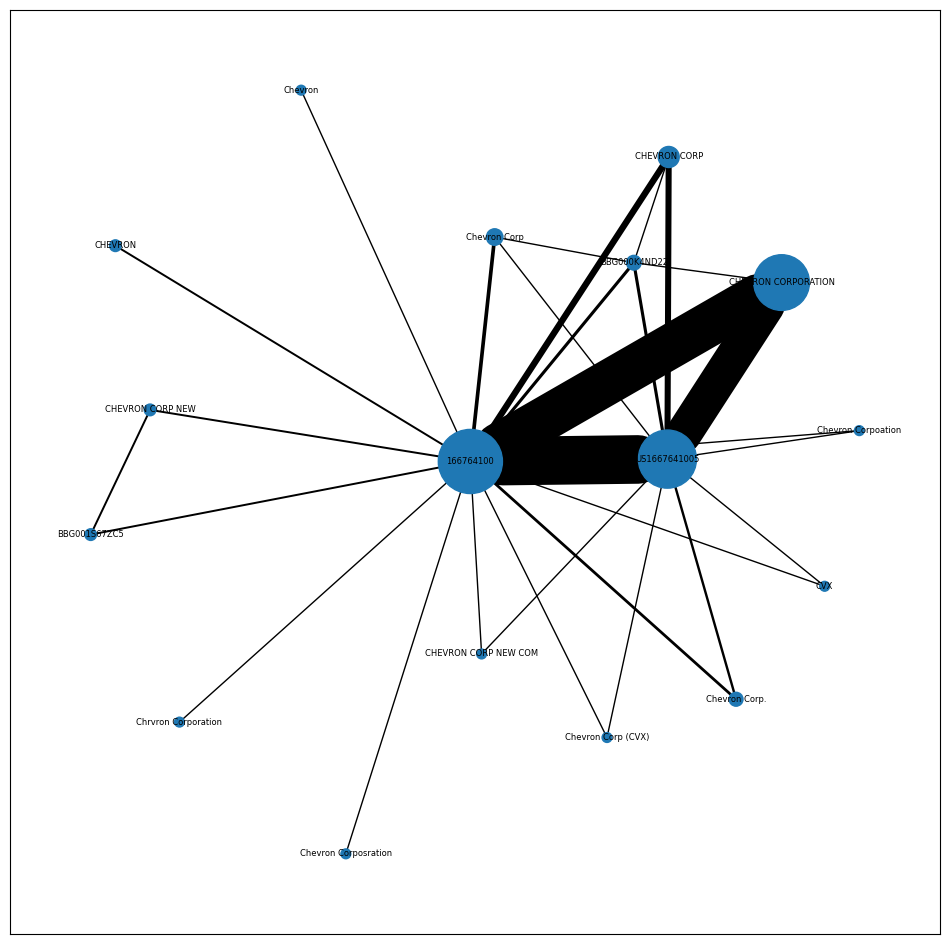

In [7]:
# ps(cvx)
draw_graph(cvx)

In [8]:
msft_subgraph = extract_specific_name_subgraph(post_processed_subgraphs, "microsoft")
mcds_subgraph = extract_specific_name_subgraph(post_processed_subgraphs, "mcdonald")
jpm_subgraph = extract_specific_name_subgraph(post_processed_subgraphs, "jpmorgan")

/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_82037/942150125.py:18: UserWarning: 3 subgraphs have name='mcdonald'.
[len(subg.nodes) for subg in collected]=[1, 27, 2]
  warn(alert_str)
/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_82037/942150125.py:18: UserWarning: 2 subgraphs have name='jpmorgan'.
[len(subg.nodes) for subg in collected]=[1, 24]
  warn(alert_str)


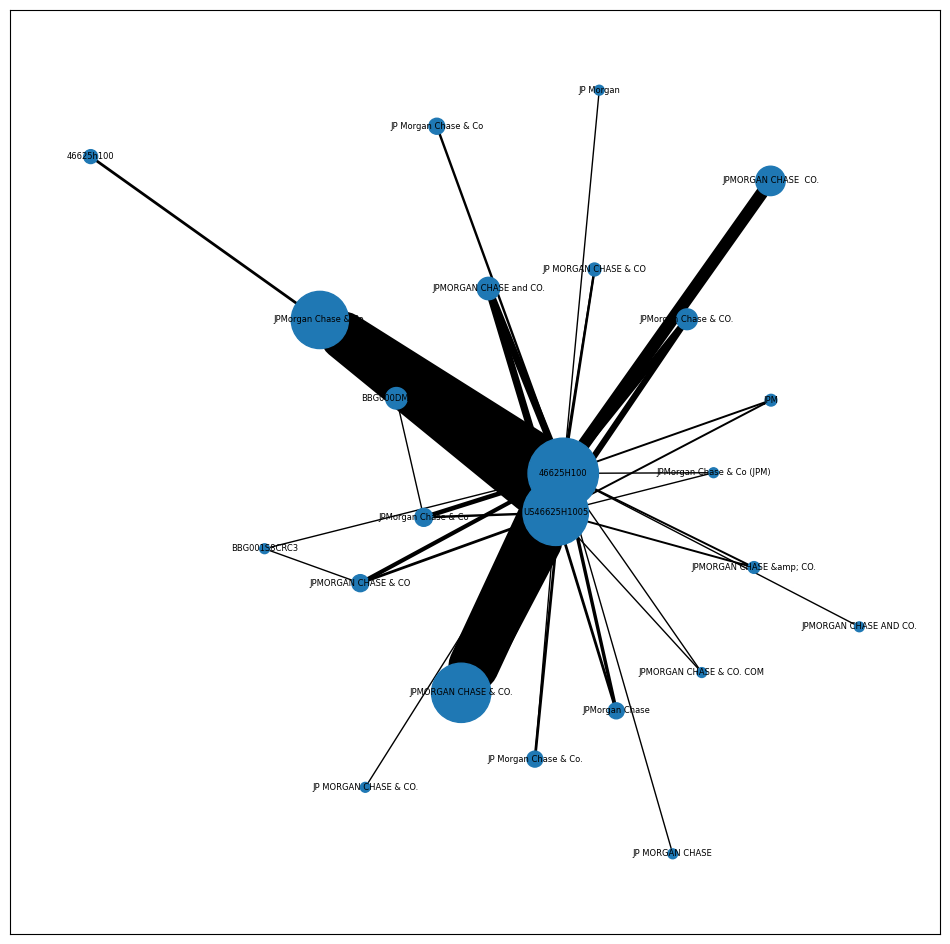

In [9]:
# ps(jpm_subgraph)
draw_graph(jpm_subgraph)

## No PostProcessing

In [10]:
subgraphs = list(
    unconsolidated_df_to_subgraphs(
        votes.select(COMPANY_COLS),
        weight_edges=True,
        connected_subgraphs_postprocessor=None,
    )
)

## Compare the two

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( MICROSOFT ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



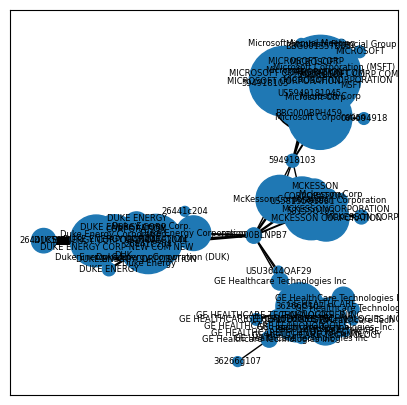

					 
 PROCESSED 



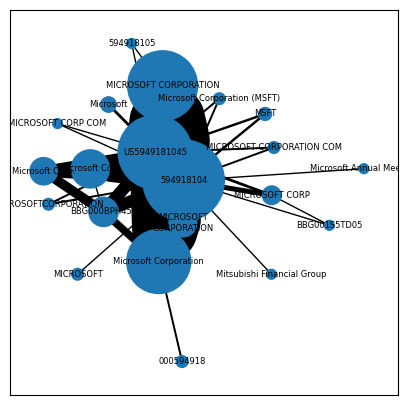

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( DUKE ENERGY ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



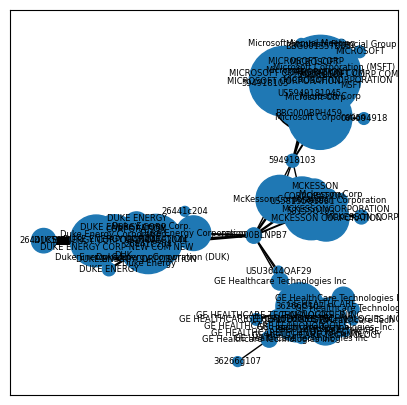

					 
 PROCESSED 



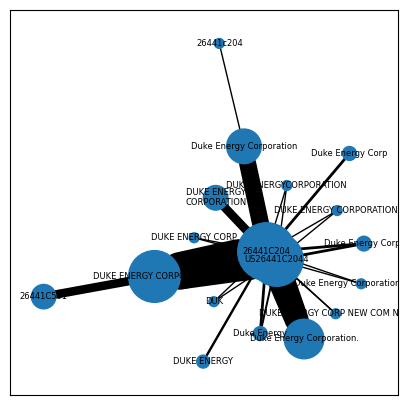

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( GE HEALTHCARE ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



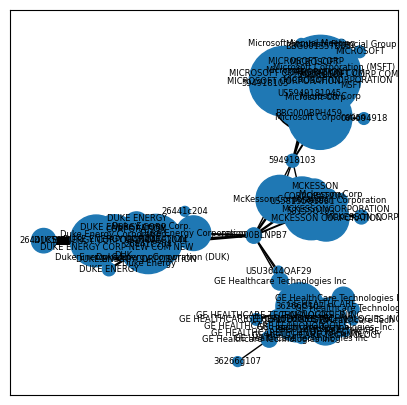

					 
 PROCESSED 



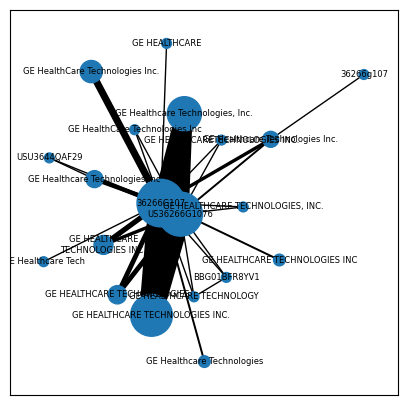

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( CHEVRON ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



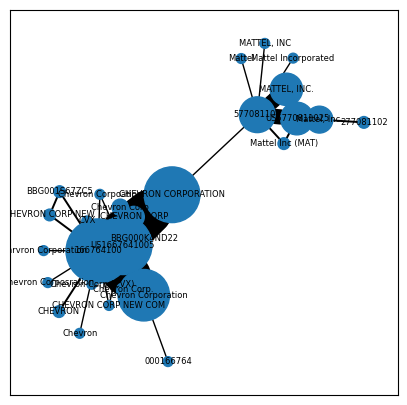

					 
 PROCESSED 



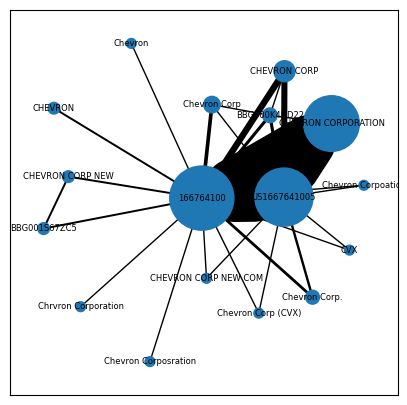

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( MATTEL ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_82037/942150125.py:18: UserWarning: 5 subgraphs have name='mattel'.
[len(subg.nodes) for subg in collected]=[1, 1, 1, 1, 1]
  warn(alert_str)


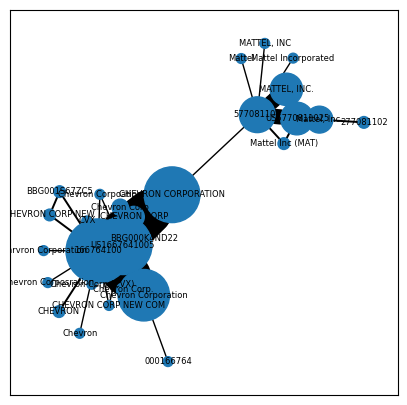

					 
 PROCESSED 



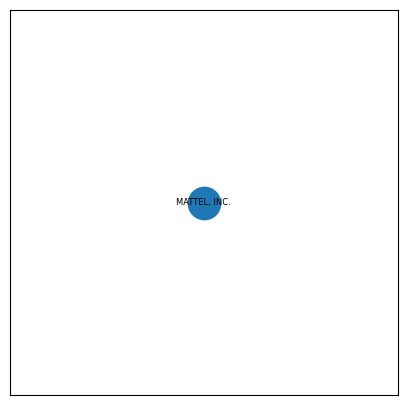

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( JPMORGAN ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_82037/942150125.py:18: UserWarning: 2 subgraphs have name='jpmorgan'.
[len(subg.nodes) for subg in collected]=[1, 24]
  warn(alert_str)
/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_82037/942150125.py:18: UserWarning: 2 subgraphs have name='jpmorgan'.
[len(subg.nodes) for subg in collected]=[1, 60]
  warn(alert_str)


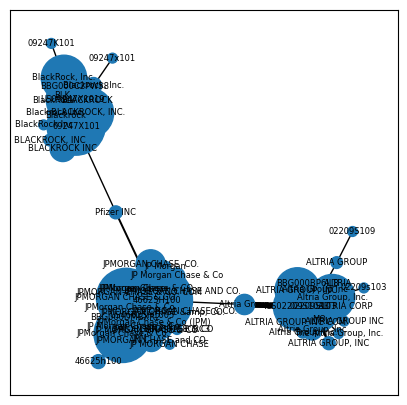

					 
 PROCESSED 



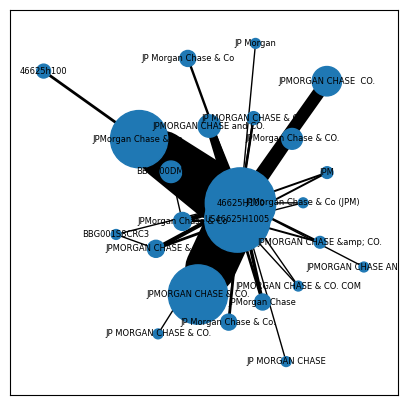

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( BLACKROCK ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_82037/942150125.py:18: UserWarning: 24 subgraphs have name='BlackRock'.
[len(subg.nodes) for subg in collected]=[3, 4, 3, 4, 14, 3, 3, 3, 4, 2, 3, 5, 2, 3, 13, 3, 3, 3, 2, 3, 3, 3, 3, 3]
  warn(alert_str)
/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_82037/942150125.py:18: UserWarning: 24 subgraphs have name='BlackRock'.
[len(subg.nodes) for subg in collected]=[3, 3, 3, 4, 3, 3, 3, 2, 4, 3, 5, 13, 3, 3, 2, 4, 60, 3, 3, 2, 3, 3, 3, 3]
  warn(alert_str)


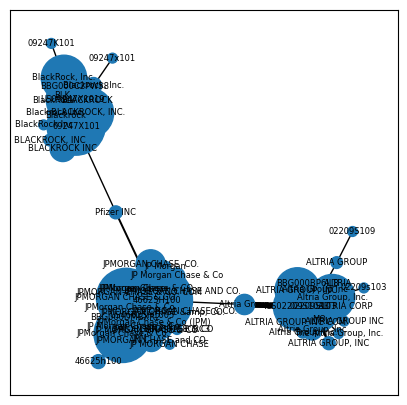

					 
 PROCESSED 



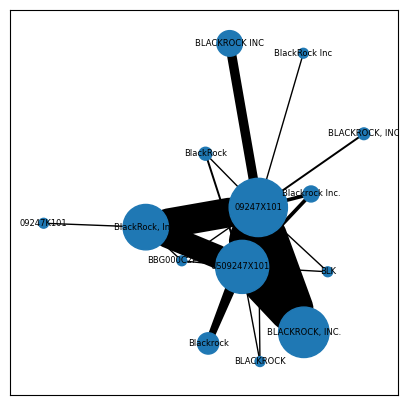

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( ALTRIA ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



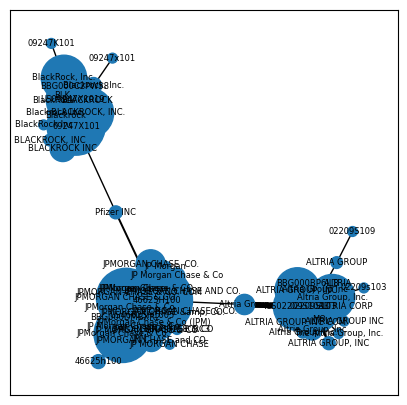

					 
 PROCESSED 



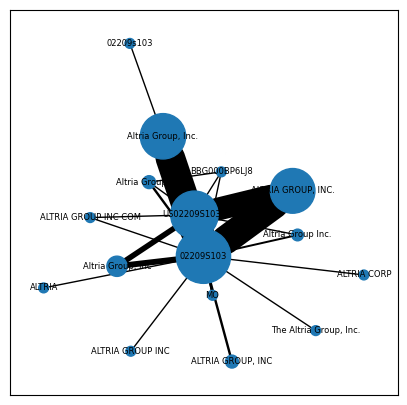

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( STARBUCKS ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



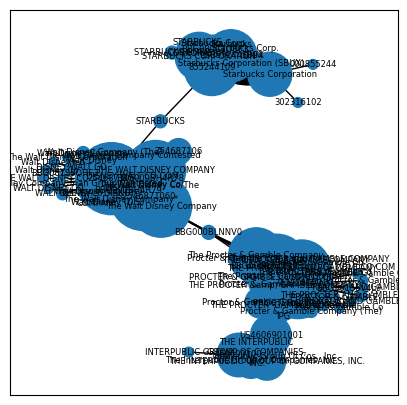

					 
 PROCESSED 



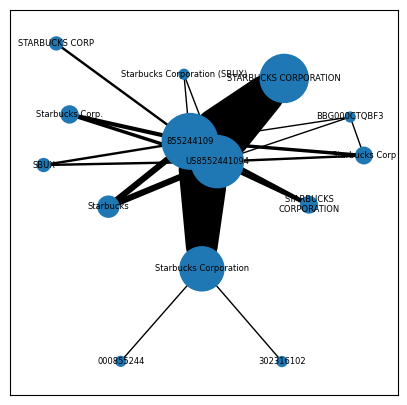

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( PROCTOR ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



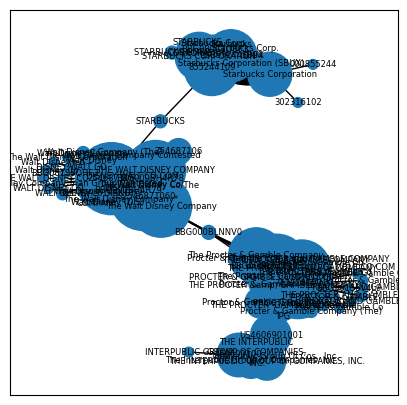

					 
 PROCESSED 



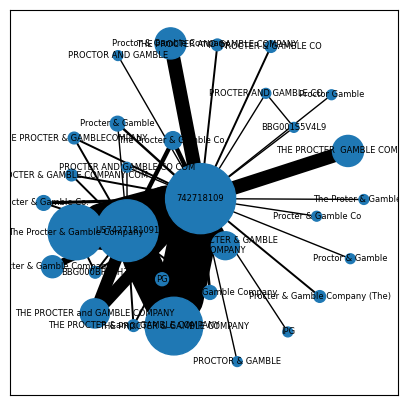

(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((( DISNEY ))))))))))))))))))))))))))))))))))))))))))))))))))))))))))))
					 
 UNPROCESSED 



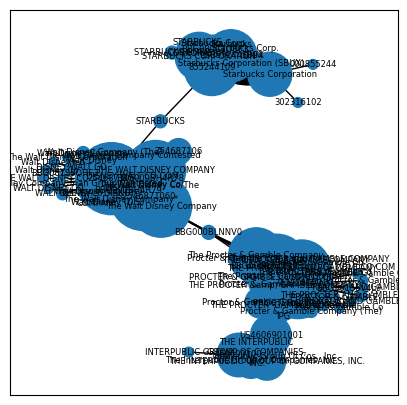

					 
 PROCESSED 



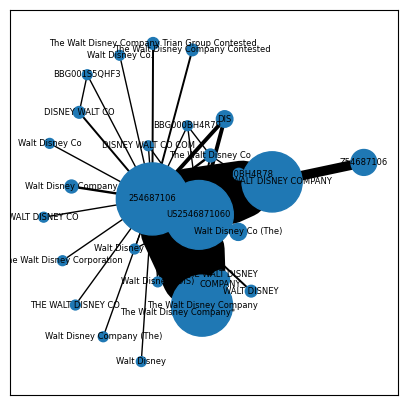

In [11]:


erroneously_linked_cos = [
    "microsoft",
    "DUKE ENERGY",
    "GE HEALTHCARE",
    #
    "chevron",  # originally grouped (a)
    "mattel",  # originally grouped (a)
    #
    "jpmorgan",  # originally grouped (b)
    "BlackRock",  # originally grouped (b)
    "altria",  # originally grouped (b)
    #
    "starbucks",  # originally grouped (c)
    "proctor",  # originally grouped (c)
    "disney",  # originally grouped (c)
]
for co in erroneously_linked_cos:
    post_processed = extract_specific_name_subgraph(post_processed_subgraphs, name=co)
    post_processed_canonicals = _extract_consolidation_mapping_from_subgraph(
        post_processed
    )

    unprocessed = extract_specific_name_subgraph(subgraphs, name=co)
    unprocessed_canonicals = _extract_consolidation_mapping_from_subgraph(unprocessed)

    print("(" * 60, co.upper(), ")" * 60)

    # print("UNPROCESSED:\n")
    # ps(unprocessed)
    print("\t" * 5, "\n", "UNPROCESSED", "\n")
    draw_graph(unprocessed, size=5)
    # pprint(unprocessed_canonicals)

    # print("PROCESSED:\n")
    # ps(post_processed)
    print("\t" * 5, "\n", "PROCESSED", "\n")
    draw_graph(post_processed, size=5)
    # pprint(post_processed_canonicals)

# Conclusion(s) from comparing SubGraphs

- Algorithm works really well on subgraphs that need to be cut (tested with `betweenness_centrality` threshold of `0.06`). Still not perfect though.
- Not yet certain how well it performs on subgraphs which should *NOT* be cut.
- Some `Mattel` observations are cut too far / the alg is just performing strangely here:  

***UNPROCESSED CONSOLIDATION MAPPING***:
```json
{'cusip': {'000166764': '166764100',
           '166764100': '166764100',
           '277081102': '166764100',
           '577081102': '166764100'},
 'figi': {'BBG000K4ND22': 'BBG000K4ND22', 'BBG001S67ZC5': 'BBG000K4ND22'},
 'isin': {'US1667641005': 'US1667641005', 'US5770811025': 'US1667641005'},
 'issuer_name': {'CHEVRON': 'CHEVRON CORPORATION',
                 'CHEVRON CORP': 'CHEVRON CORPORATION',
                 'CHEVRON CORP NEW': 'CHEVRON CORPORATION',
                 'CHEVRON CORP NEW COM': 'CHEVRON CORPORATION',
                 'CHEVRON CORPORATION': 'CHEVRON CORPORATION',
                 'CVX': 'CHEVRON CORPORATION',
                 'Chevron': 'CHEVRON CORPORATION',
                 'Chevron Corp': 'CHEVRON CORPORATION',
                 'Chevron Corp (CVX)': 'CHEVRON CORPORATION',
                 'Chevron Corp.': 'CHEVRON CORPORATION',
                 'Chevron Corpoation': 'CHEVRON CORPORATION',
                 'Chevron Corporation': 'CHEVRON CORPORATION',
                 'Chevron Corposration': 'CHEVRON CORPORATION',
                 'Chrvron Corporation': 'CHEVRON CORPORATION',
                 'MATTEL, INC': 'CHEVRON CORPORATION',
                 'MATTEL, INC.': 'CHEVRON CORPORATION',
                 'Mattel': 'CHEVRON CORPORATION',
                 'Mattel Inc (MAT)': 'CHEVRON CORPORATION',
                 'Mattel Incorporated': 'CHEVRON CORPORATION',
                 'Mattel, Inc.': 'CHEVRON CORPORATION'}}
```

***PROCESSED CONSOLIDATION MAPPING***
```json
{'issuer_name': {'MATTEL, INC.': 'MATTEL, INC.'}}
```

# Develop new graph-cutting alg

## Get examples that should / shouldn't be cut

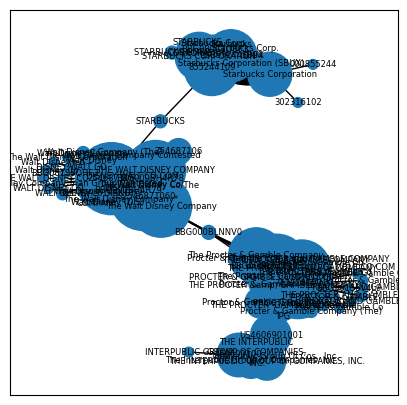

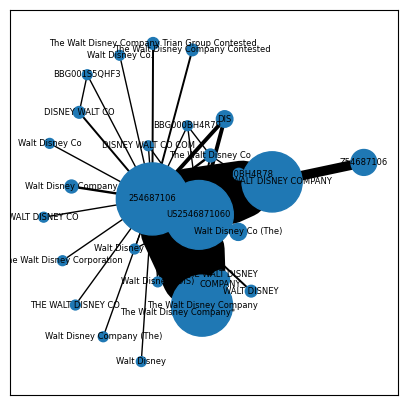

In [12]:
from typing import Literal

DISNEYS = Literal["correctly_linked", "erroneously_linked"]
DISNEYS_LIST = ["correctly_linked", "erroneously_linked"]

disney: dict[DISNEYS, nx.Graph] = {
    "correctly_linked": extract_specific_name_subgraph(  # should not be cut
        post_processed_subgraphs, "disney"
    ),
    "erroneously_linked": extract_specific_name_subgraph(
        subgraphs, "disney"
    ),  # should be cut
}

draw_graph(disney["erroneously_linked"], size=5)
draw_graph(disney["correctly_linked"], size=5)

{'correctly_linked': <networkx.classes.graph.Graph object at 0x2858b1d90>, 'erroneously_linked': <networkx.classes.graph.Graph object at 0x2858b2210>}


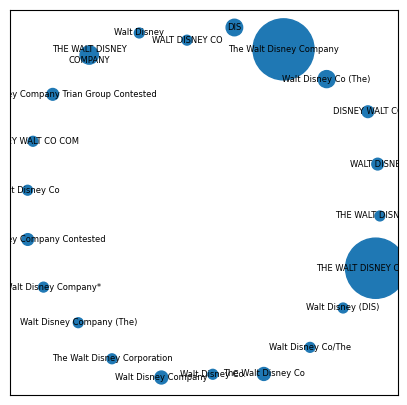

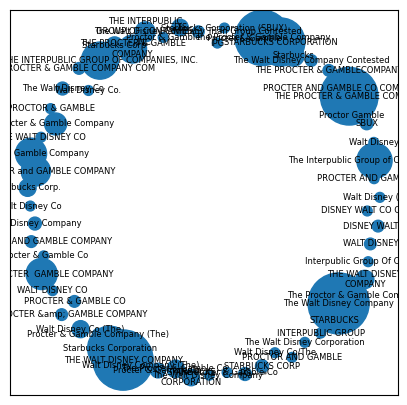

In [13]:
just_issuer_names: dict[DISNEYS, nx.Graph] = {}
for name in DISNEYS_LIST:
    graph_copy = disney[name].copy()
    nodes_to_remove = [
        node
        for node, attr in graph_copy.nodes(data=True)
        if attr.get("field") != "issuer_name"
    ]
    graph_copy.remove_nodes_from(nodes_to_remove)
    just_issuer_names[name] = graph_copy

print(just_issuer_names)

for g in just_issuer_names.values():
    draw_graph(g, 5)

In [14]:
from functools import partial
from typing import Any, Callable, Literal


def _find_point_to_cut(
    G: nx.Graph,
    method: Literal["articulation"] = "articulation",
) -> str:
    to_cut: str
    match method:
        case "articulation":
            data = G.nodes.data()
            cut_points = tuple(nx.articulation_points(G))
            cut_point_counts: dict[str, int] = {
                name: data[name]["count"] for name in cut_points
            }
            to_cut = min(cut_point_counts, key=cut_point_counts.get)  # type: ignore
        case _:
            raise NotImplementedError(method)
    return to_cut


def _should_cut_graph(G: nx.Graph, method: Literal[""]) -> bool:
    return False


def graph_splitter(
    G: nx.Graph,
    should_cut_graph: Callable[[nx.Graph], bool] = _should_cut_graph,
    find_point_to_cut: Callable[[nx.Graph], str] = partial(
        _find_point_to_cut, method="articulation"
    ),  # returns the key str corresponding to the node to cut
) -> Any:
    while should_cut_graph(G):
        point_to_cut: str = find_point_to_cut(G)
        G.remove_node(point_to_cut)  # TODO: modify process to preserve this node

## Electric betweenness

In [15]:
def get_max_betweenness(
    G: nx.Graph, alg: Callable[[nx.Graph], dict[tuple, float]]
) -> float:
    betweennesses: dict[tuple, float] = alg(G, weight="count", normalized=True)
    return max(betweennesses.values())

In [16]:
get_max_betweenness(disney["erroneously_linked"], nx.edge_betweenness_centrality)

0.41353006122653824

In [17]:
get_max_betweenness(
    disney["erroneously_linked"], nx.edge_current_flow_betweenness_centrality
)

0.15509259259255861

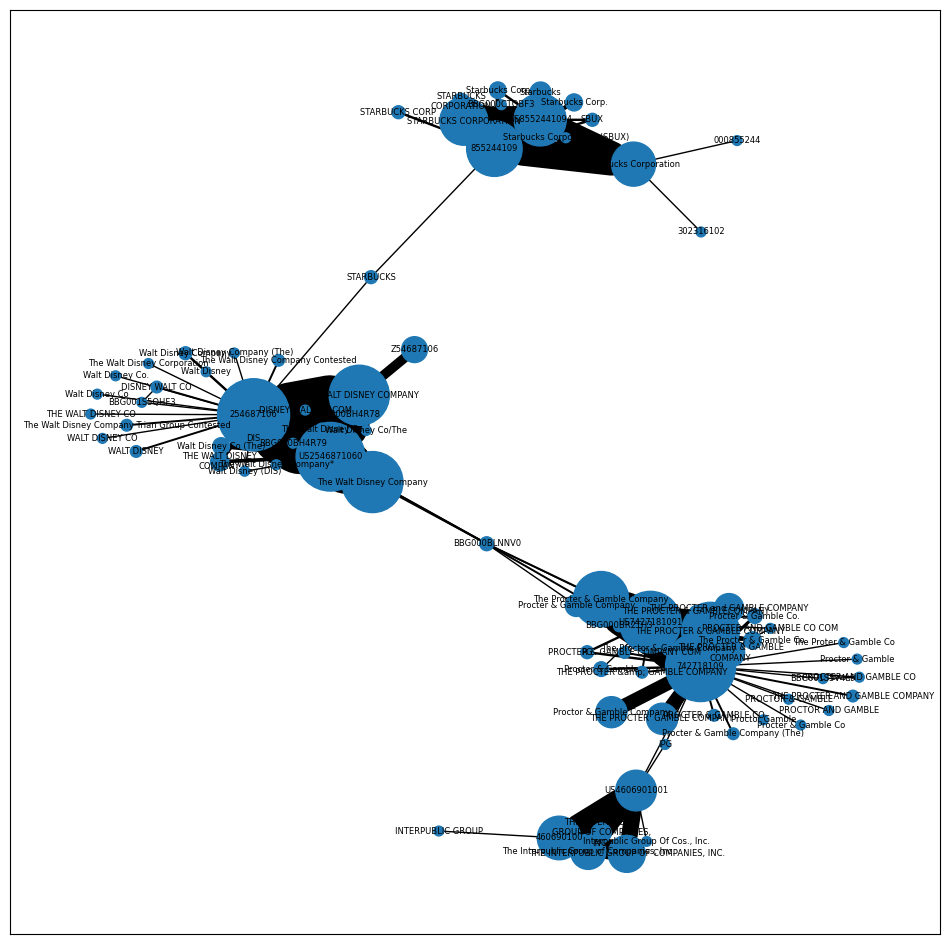

In [18]:
draw_graph(disney["erroneously_linked"])

In [19]:
[x for x in msft_subgraph.nodes.data()]

[('594918105', {'field': 'cusip', 'count': 1}),
 ('Microsoft Corp', {'field': 'issuer_name', 'count': 226}),
 ('594918104', {'field': 'cusip', 'count': 4698}),
 ('MICROSOFT CORPORATION', {'field': 'issuer_name', 'count': 2555}),
 ('US5949181045', {'field': 'isin', 'count': 3197}),
 ('Microsoft', {'field': 'issuer_name', 'count': 6}),
 ('Mitsubishi Financial Group', {'field': 'issuer_name', 'count': 1}),
 ('MICROSOFT', {'field': 'issuer_name', 'count': 2}),
 ('MICROSOFT CORP', {'field': 'issuer_name', 'count': 13}),
 ('MICROSOFT CORPORATION COM', {'field': 'issuer_name', 'count': 2}),
 ('BBG001S5TD05', {'field': 'figi', 'count': 1}),
 ('MICROSOFTCORPORATION', {'field': 'issuer_name', 'count': 2}),
 ('BBG000BPH459', {'field': 'figi', 'count': 79}),
 ('MICROSOFT CORP COM', {'field': 'issuer_name', 'count': 1}),
 ('MICROSOFT\nCORPORATION', {'field': 'issuer_name', 'count': 64}),
 ('MSFT', {'field': 'issuer_name', 'count': 3}),
 ('Microsoft Corporation (MSFT)', {'field': 'issuer_name', 'cou

In [247]:
import networkx as nx
import numpy as np
from sklearn.cluster import KMeans
from scipy.sparse import csgraph
import matplotlib.pyplot as plt
from icecream import ic


def plot_colored_graph(G: nx.Graph, labels: np.ndarray):
    """
    Plot a graph with nodes colored according to their cluster labels.

    Parameters:
    - G: The input graph (networkx.Graph)
    - labels: A list or array of cluster labels corresponding to the nodes in the graph
    """
    # Create a color map based on the cluster labels
    unique_labels = np.unique(labels)
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
    label_color_map = {label: colors[i] for i, label in enumerate(unique_labels)}

    # Assign colors to nodes based on their labels
    node_colors = [
        label_color_map[labels[list(G.nodes()).index(node)]] for node in G.nodes()
    ]

    # Draw the graph
    pos = nx.spring_layout(G, seed=42)  # Layout for consistent plotting
    plt.figure(figsize=(10, 8))
    nx.draw_networkx(
        G,
        pos,
        node_color=node_colors,
        with_labels=True,
        node_size=500,
        font_size=10,
        font_color="black",
        cmap=plt.cm.rainbow,
    )

    plt.title("Graph with Colored Clusters")
    plt.show()


def plot_eigenvalues(eigenvalues: np.ndarray, labels=None) -> None:
    plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, "o-", markersize=5)

    if labels is None:
        labels = range(1, len(eigenvalues) + 1)  # Default labels are the indices

    for i, label in enumerate(labels):
        plt.text(
            i + 1, eigenvalues[i], f"{label}", fontsize=7, ha="right", rotation=-45
        )

    plt.title("Eigenvalues of the Laplacian Matrix")
    plt.xlabel("Index")
    plt.ylabel("Eigenvalue")
    plt.grid(True)
    plt.show()


def find_k_clusters(
    G: nx.Graph,
    finding_method: Literal["n_0val_eigeinvalues", "eigen_gaps"],
    verbose: bool,
    eigenval_threshold: float | None = 0.05,
) -> int:
    """
    Finds the number of *nearly* disconnected components in a graph
      by finding the number of near-zero eigenvalues in its Laplacian.
    """
    A = nx.adjacency_matrix(G, weight="count")

    # Step 1: Compute the Laplacian and its eigenvalues/eigenvectors
    L = csgraph.laplacian(A, normed=True)
    eigenvalues, _ = np.linalg.eigh(L.toarray())

    # Step 1.5: Plot eigenvalues
    if verbose:
        labels = [
            x[0] if x[1]["field"] == "issuer_name" else "" for x in G.nodes.data()
        ]
        # plot_eigenvalues(eigenvalues, labels=labels)

    # Step 2: Find "k"
    k: int
    match finding_method:
        case "eigen_gaps":
            warning_str = (
                f"{finding_method=} is deprecated; use `n_0val_eigeinvalues` instead."
            )
            warn(warning_str)
            eigen_gaps = np.diff(eigenvalues)
            k = int(
                np.argmax(eigen_gaps) + 1
            )  # The index of the largest gap indicates number of clusters
        case "n_0val_eigeinvalues":
            k = (
                eigenvalues < eigenval_threshold
            ).sum()  # they won't be exactly 0 - just close TODO: normalize this & make more robust & check edge cases
        case _:
            raise ValueError(finding_method)
    if verbose:
        ic(sorted(eigenvalues)[:5])
        ic(k)
        if k > 5:
            ic(L)
    return k


PartitioningMethod = Literal["kmeans", "betweenness_centrality", "articulation_points"]
partitioning_methods: list[PartitioningMethod] = [
    "kmeans",
    "betweenness_centrality",
    "articulation_points",
]


def _partition_via_kmeans(G: nx.Graph, k: int, verbose: bool) -> nx.Graph:
    warn("`kmeans` does not produce good results -- it mixes labels within clusters.")

    # Use the adjacency matrix of the graph as features
    adjacency_matrix = nx.to_numpy_array(G)

    # Apply k-means clustering to node features
    kmeans = KMeans(n_clusters=k, random_state=0).fit(adjacency_matrix)
    labels = kmeans.labels_

    # Create a dictionary of clusters
    clusters = {i: [] for i in range(k)}
    for node, label in zip(G.nodes(), labels):
        clusters[label].append(node)

    # Optionally, you can remove nodes or modify the graph based on the clusters
    if verbose:
        print("Performing k-means clustering")

        plot_colored_graph(G, labels)

    for u, v in list(G.edges()):
        if labels[list(G.nodes()).index(u)] != labels[list(G.nodes()).index(v)]:
            G.remove_edge(u, v)
            if verbose:
                print(f"Removed edge between {u} and {v} (different clusters)")
    return G


def _partition_via_betweenness_centrality(
    G: nx.Graph, k: int, verbose: bool
) -> nx.Graph:
    removed_nodes = []
    while nx.number_connected_components(G) < k:
        # Compute betweenness centrality for all nodes
        betweennesses = dict(nx.betweenness_centrality(G, weight="count"))
        if verbose:
            betweennesses = {
                k: v for k, v in sorted(betweennesses.items(), key=lambda item: item[1])
            }

        # Find the node with the highest betweenness centrality
        max_node = max(betweennesses, key=betweennesses.get)

        # Remove the node with the highest betweenness centrality
        G.remove_node(max_node)
        removed_nodes.append(max_node)

        if verbose:
            print(
                f"Removed node {max_node} with betweenness centrality {betweennesses[max_node]:.4f}"
            )
    return G


def _partition_via_articulation_points(
    G: nx.Graph,
    k: int,
    verbose: bool,
    sort_articulation_points_by: Literal["degree", "betweenness_centrality"],
) -> nx.Graph:
    for _ in range(
        k - 1
    ):  # NOTE: this correctly ranges up to k - 1, because we make k-1 to end up with k clusters
        cut_points = tuple(nx.articulation_points(G))
        if verbose:
            draw_graph(G, 5)
            ic(_)
            ic(cut_points)
        cut_points = [
            node
            for node in cut_points
            if G.degree(node)
            > 1  # more than one connection because it has to bridge multiple clusters - this also avoids creating "archipelagos"
        ]

        match sort_articulation_points_by:
            case "betweenness_centrality":
                betweenness_centrality = nx.betweenness_centrality(G, weight="count")
                cut_points = sorted(
                    cut_points,
                    key=lambda node: betweenness_centrality[node],
                    reverse=True,
                )
            case "degree":
                cut_points = sorted(
                    cut_points, key=lambda node: G.degree(node, weight="count")
                )

        if verbose:
            betweenness_centralities = nx.betweenness_centrality(G, weight="count")
            degrees = [G.degree(node, weight="count") for node in cut_points]
            asdasdasd = pl.DataFrame(
                {
                    "point": cut_points,
                    "betweenness_centrality": [
                        betweenness_centralities[x] for x in cut_points
                    ],
                    "degree": degrees,
                }
            )
            print(asdasdasd)
        if len(cut_points) == 0:
            break
        cut_point: str = cut_points[0]
        if verbose:
            ic(cut_point)

        # TODO(?): assess betweenness_centrality of cut_points; only cut if total counts > some X

        # get cut point
        data = G.nodes.data()
        cut_point_counts: dict[str, int] = {
            name: data[name]["count"] for name in cut_points
        }
        to_cut: str = min(cut_point_counts, key=cut_point_counts.get)  # type: ignore

        # remove
        G.remove_node(to_cut)
        if verbose:
            draw_graph(G, 5)

    return G


def _partition_companies_graph(
    G: nx.Graph,
    k: int,
    method: PartitioningMethod,
    sort_articulation_points_by: Literal["degree", "betweenness_centrality"],
    verbose: bool = True,
) -> nx.Graph:
    match method:
        case "kmeans":
            G = _partition_via_kmeans(G, k=k, verbose=verbose)
        case "betweenness_centrality":
            G = _partition_via_betweenness_centrality(G, k=k, verbose=verbose)
        case "articulation_points":
            G = _partition_via_articulation_points(
                G,
                k=k,
                verbose=verbose,
                sort_articulation_points_by=sort_articulation_points_by,  # TODO: inject this at the correct level
            )

        case _:
            raise NotImplementedError(method)
    return G


def partition_companies_graph_where_necessary(
    G: nx.Graph,
    k_finding_method: Literal["n_0val_eigeinvalues", "eigen_gaps"],
    sort_articulation_points_by: Literal["degree", "betweenness_centrality"],
    partitioning_methods: Iterable[PartitioningMethod] = partitioning_methods,
    verbose: bool = False,
) -> nx.Graph:
    if verbose:
        draw_graph(G, 5)
    k: int = find_k_clusters(G.copy(), finding_method=k_finding_method, verbose=verbose)
    if k == 1:
        if verbose:
            print("Not partitioning")
        return G

    partition_attempts: dict[PartitioningMethod, nx.Graph] = {}
    method_scores: dict[PartitioningMethod, float] = {}
    for method in partitioning_methods:
        partition_attempts[method] = _partition_companies_graph(
            G.copy(),
            k=k,
            method=method,
            verbose=verbose,
            sort_articulation_points_by=sort_articulation_points_by,
        )
        method_scores[method] = nx.community.modularity(
            partition_attempts[method],
            communities=nx.connected_components(partition_attempts[method]),
            weight="count",
        )
        # if verbose:
        if True:
            print(method)
            draw_graph(partition_attempts[method], 4)

    best_method: str = max(method_scores, key=method_scores.get)
    best_partition: nx.Graph = partition_attempts[best_method]
    ic(best_method)
    draw_graph(best_partition, 7)
    return best_partition

In [248]:
# def cluster_via_laplacian_kmeans(
#     _G: nx.Graph, k_method: Literal["eigen_gaps", "n_0val_eigeinvalues"], cluster_method: Literal[""]
# ) -> None:
#     G = _G.copy()
#     draw_graph(G, 5)

#     A = nx.adjacency_matrix(G, weight="count")

#     # Step 1: Compute the Laplacian and its eigenvalues/eigenvectors
#     L = csgraph.laplacian(A, normed=True)
#     eigenvalues, eigenvectors = np.linalg.eigh(L.toarray())

#     # Step 1.5: Plot eigenvalues
#     labels = [x[0] if x[1]["field"] == "issuer_name" else "" for x in G.nodes.data()]
#     plot_eigenvalues(eigenvalues, labels=labels)

#     # Step 2: Find "k"
#     k: int
#     match k_method:
#         case "eigen_gaps":
#             eigen_gaps = np.diff(eigenvalues)
#             k = int(
#                 np.argmax(eigen_gaps) + 1
#             )  # The index of the largest gap indicates number of clusters
#         case "n_0val_eigeinvalues":
#             k = (
#                 eigenvalues < 0.1
#             ).sum()  # they won't be exactly 0 - just close TODO: normalize this; TODO: make more robust & check edge cases
#         case _:
#             raise ValueError(k_method)
#     ic(sorted(eigenvalues)[:5])
#     ic(k)
#     if k > 5:
#         ic(L)

#     # Step 3: Use k for clustering
#     embedding = eigenvectors[:, :k]
#     kmeans = KMeans(n_clusters=k).fit(embedding)
#     labels = kmeans.labels_

#     # Steps 4-5
#     # Map graph nodes to indices used in labels array
#     node_to_index = {node: i for i, node in enumerate(G.nodes())}

#     # Step 4: Sever connections between clusters
#     edges_to_remove = [
#         (u, v)
#         for u, v in G.edges()
#         if labels[node_to_index[u]] != labels[node_to_index[v]]
#         and G.degree[u] > 1
#         and G.degree[v] > 1
#     ]
#     ic(edges_to_remove)
#     G.remove_edges_from(edges_to_remove)
#     draw_graph(G, 5)


# cluster_via_laplacian_kmeans(disney["correctly_linked"], "n_0val_eigeinvalues")
# cluster_via_laplacian_kmeans(disney["erroneously_linked"], "n_0val_eigeinvalues")

/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_82037/403077066.py:123: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


kmeans


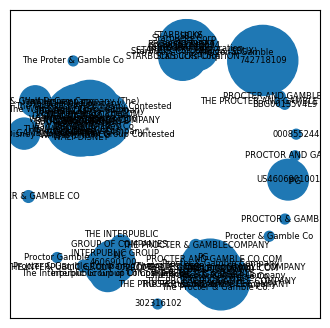

betweenness_centrality


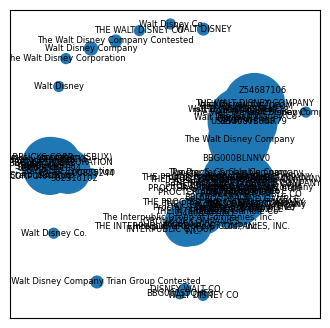

articulation_points


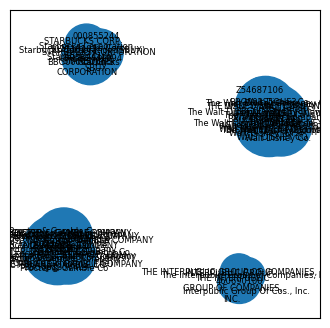

ic| best_method: 'articulation_points'


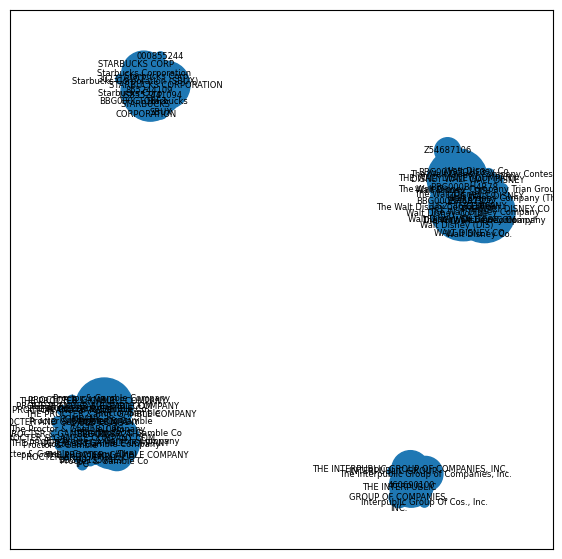

In [249]:
partition_companies_graph_where_necessary(
    disney["erroneously_linked"],
    k_finding_method="n_0val_eigeinvalues",
    sort_articulation_points_by="betweenness_centrality",
    verbose=False,
)

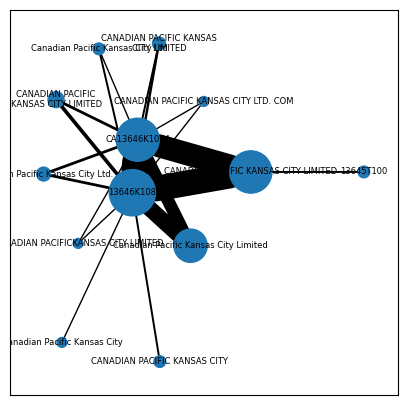

ic| sorted(eigenvalues)[:5]: [np.float64(-6.958851003688522e-17),
                              np.float64(0.9667924726212048),
                              np.float64(0.9965222472743753),
                              np.float64(0.999999999999999),
                              np.float64(0.9999999999999996)]
ic| k: np.int64(1)
ic| k: np.int64(1)


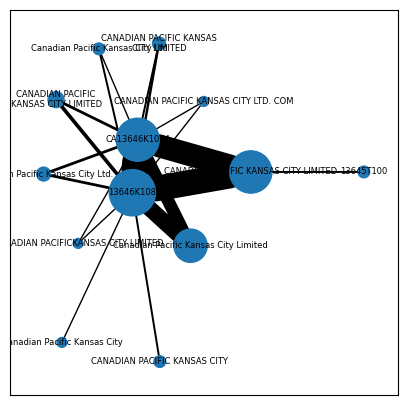

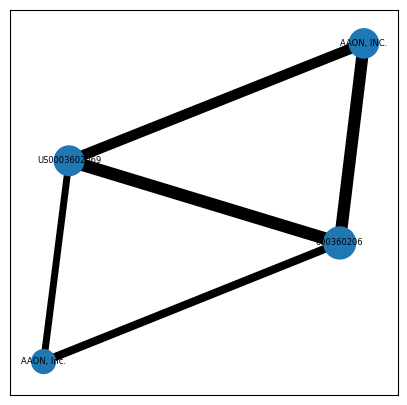

ic| sorted(eigenvalues)[:5]: [np.float64(1.9343993598340742e-16),
                              np.float64(0.9999972020972477),
                              np.float64(1.423329756458006),
                              np.float64(1.5766730414447456)]
ic| k: np.int64(1)
ic| k: np.int64(1)


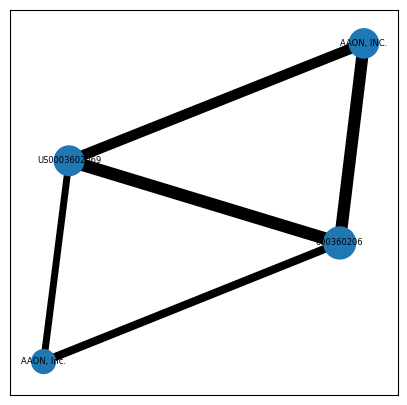

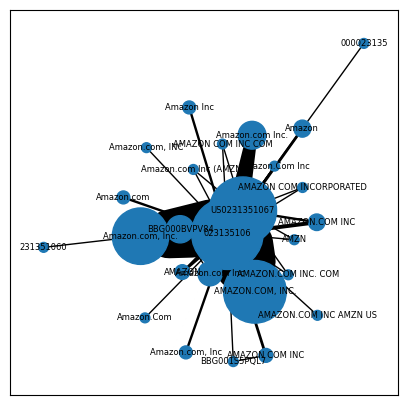

ic| sorted(eigenvalues)[:5]: [np.float64(3.221168097638169e-16),
                              np.float64(0.6221876180069373),
                              np.float64(0.6835847439898094),
                              np.float64(0.9245835003533173),
                              np.float64(0.9969228445061897)]
ic| k: np.int64(1)
ic| k: np.int64(1)


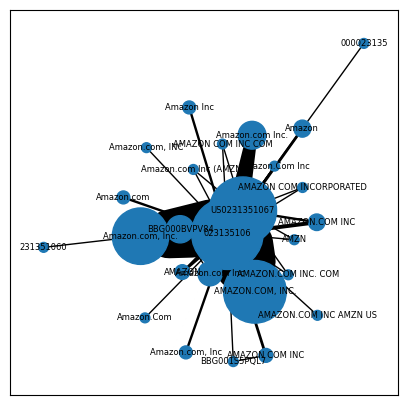

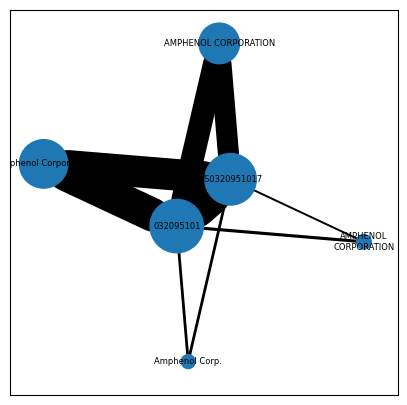

ic| sorted(eigenvalues)[:5]: [np.float64(1.6653345307911705e-16),
                              np.float64(0.9992725640766758),
                              np.float64(0.9999999999999998),
                              np.float64(1.0000000000000002),
                              np.float64(1.4625700861072115)]
ic| k: np.int64(1)
ic| k: np.int64(1)


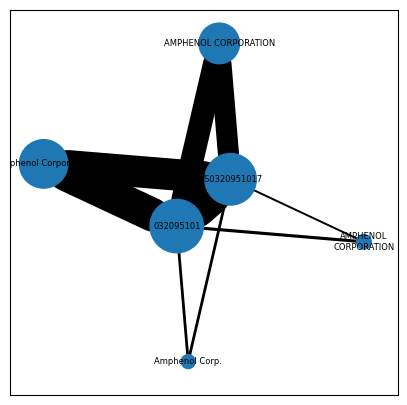

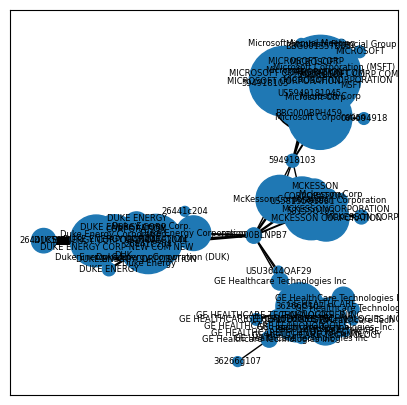

ic| sorted(eigenvalues)[:5]: [np.float64(-1.9486105584917054e-16),
                              np.float64(0.00020943860764656845),
                              np.float64(0.0009509290655436),
                              np.float64(0.001600511923653138),
                              np.float64(0.6663456300455963)]
ic| k: np.int64(4)
ic| k: np.int64(4)


Removed node BBG000BLNPB7 with betweenness centrality 0.6692
Removed node US5949181045 with betweenness centrality 0.1225
Removed node 594918104 with betweenness centrality 0.1352


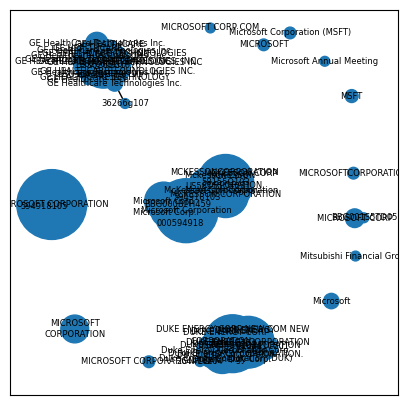

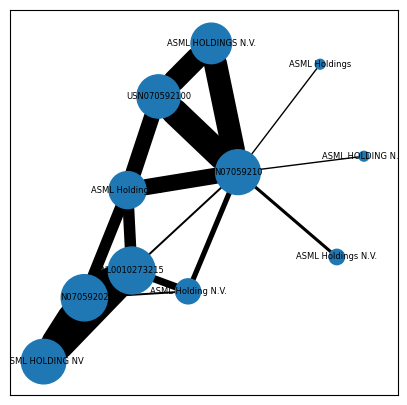

ic| sorted(eigenvalues)[:5]: [np.float64(-1.1030448407017111e-17),
                              np.float64(0.08123456417336332),
                              np.float64(0.97719828737574),
                              np.float64(0.9943182434760547),
                              np.float64(1.0)]
ic| k: np.int64(1)
ic| k: np.int64(1)


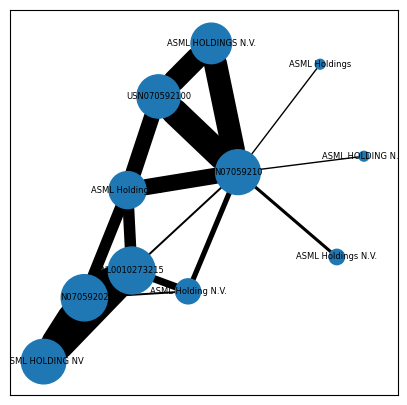

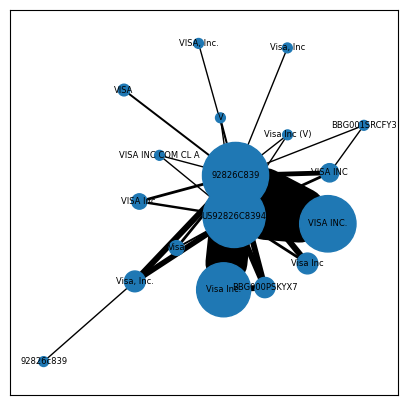

ic| sorted(eigenvalues)[:5]: [np.float64(-2.789862334437641e-16),
                              np.float64(0.82831795531031),
                              np.float64(0.8340279557765636),
                              np.float64(0.9554936297094434),
                              np.float64(0.9964663770571776)]
ic| k: np.int64(1)
ic| k: np.int64(1)


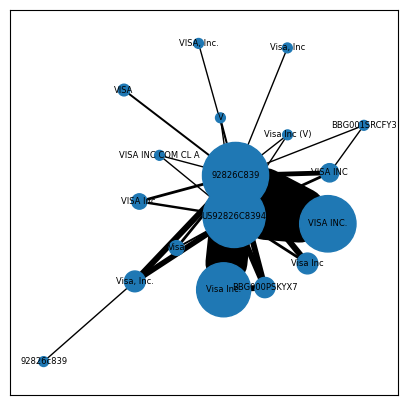

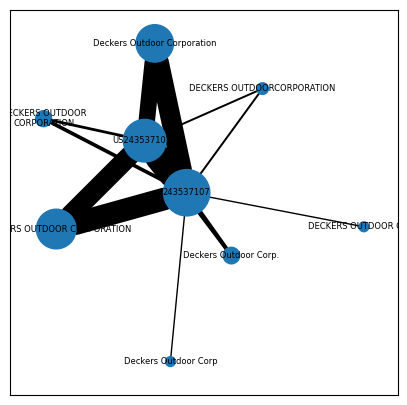

ic| sorted(eigenvalues)[:5]: [np.float64(-5.4352907222311007e-17),
                              np.float64(0.9962791740490247),
                              np.float64(0.9999999999999991),
                              np.float64(0.9999999999999998),
                              np.float64(0.9999999999999998)]
ic| k: np.int64(1)
ic| k: np.int64(1)


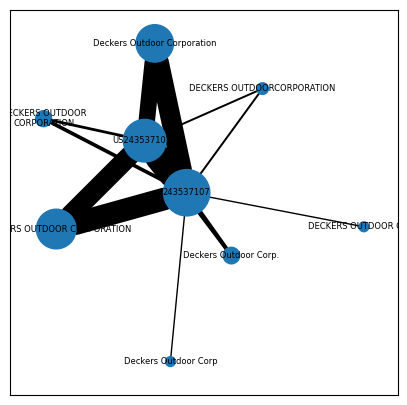

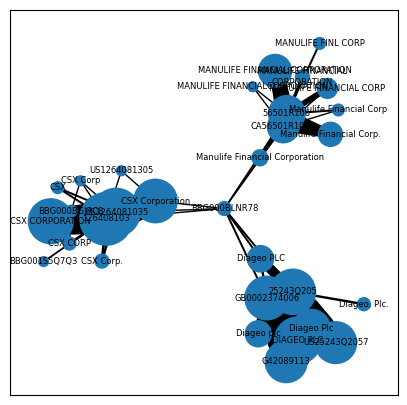

ic| sorted(eigenvalues)[:5]: [np.float64(8.401053136060318e-17),
                              np.float64(0.0009511106733496732),
                              np.float64(0.002986205373171934),
                              np.float64(0.47827044419733444),
                              np.float64(0.6599156331592669)]
ic| k: np.int64(3)
ic| k: np.int64(3)


Removed node BBG000BLNR78 with betweenness centrality 0.7709


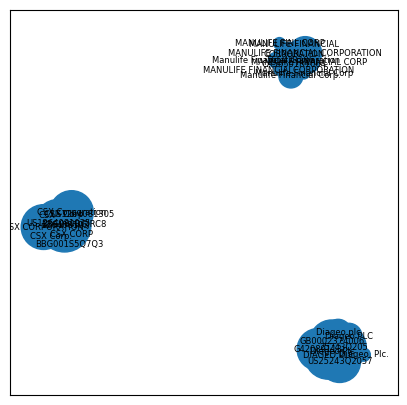

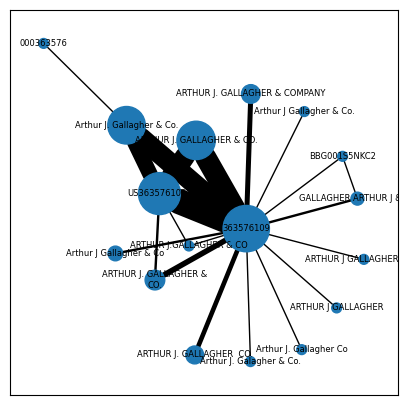

ic| sorted(eigenvalues)[:5]: [np.float64(2.3827864759248807e-16),
                              np.float64(0.6458223118501025),
                              np.float64(0.9447729088944369),
                              np.float64(0.9648122880353341),
                              np.float64(0.9999999999999992)]
ic| k: np.int64(1)
ic| k: np.int64(1)


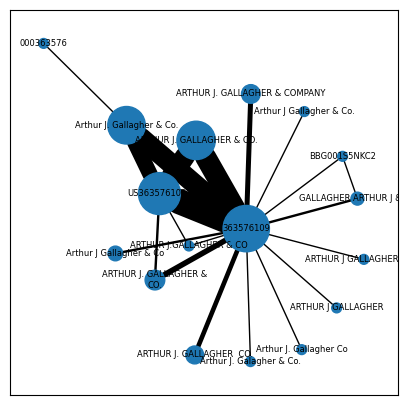

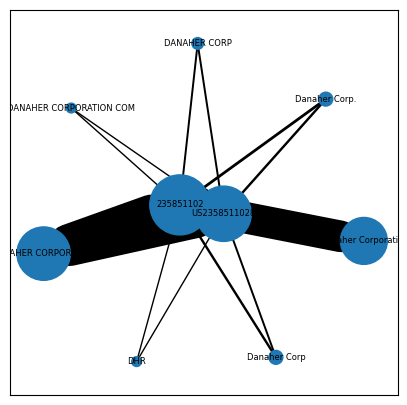

ic| sorted(eigenvalues)[:5]: [np.float64(-3.7941056378183373e-16),
                              np.float64(0.9952571099432534),
                              np.float64(0.9999999999999991),
                              np.float64(0.9999999999999991),
                              np.float64(1.0)]
ic| k: np.int64(1)
ic| k: np.int64(1)


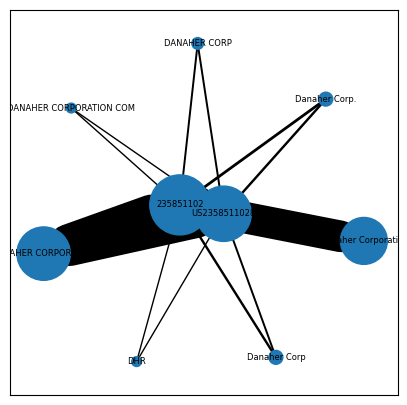

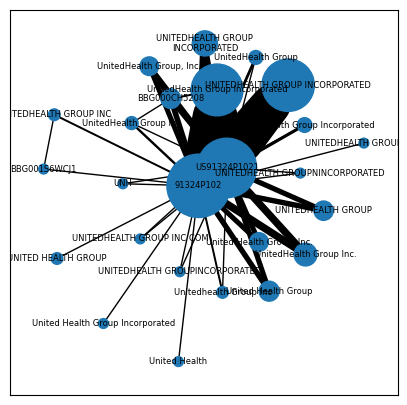

ic| sorted(eigenvalues)[:5]: [np.float64(-1.86129058760822e-15),
                              np.float64(0.5916765923094771),
                              np.float64(0.6970943126908973),
                              np.float64(0.9933424368245231),
                              np.float64(0.9999999999999981)]
ic| k: np.int64(1)
ic| k: np.int64(1)


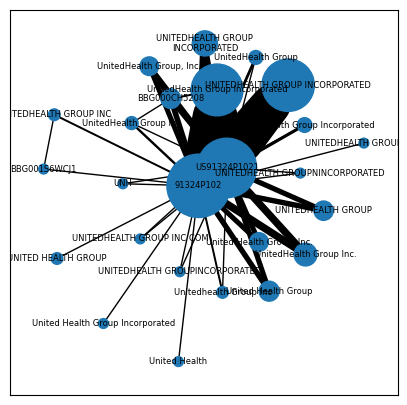

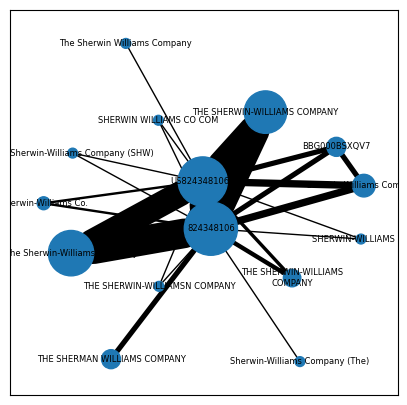

ic| sorted(eigenvalues)[:5]: [np.float64(-1.9766472954364473e-16),
                              np.float64(0.7507862958387652),
                              np.float64(0.9898670601955861),
                              np.float64(0.9999999999999994),
                              np.float64(0.9999999999999996)]
ic| k: np.int64(1)
ic| k: np.int64(1)


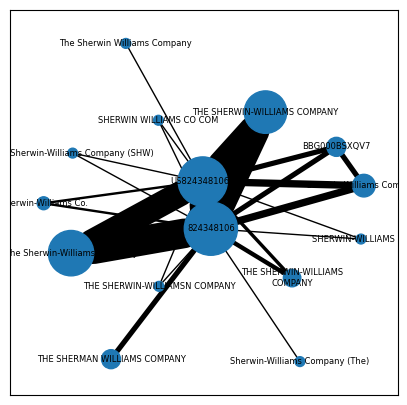

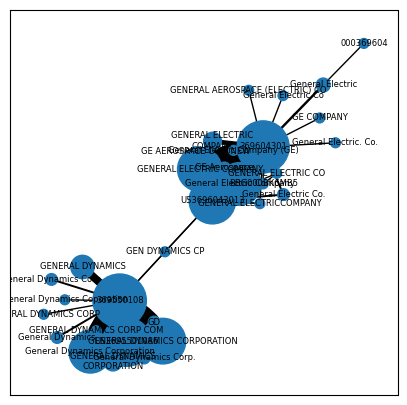

ic| sorted(eigenvalues)[:5]: [np.float64(-8.217271264933111e-17),
                              np.float64(0.0007792678362804459),
                              np.float64(0.5000936208780628),
                              np.float64(0.6672657782879323),
                              np.float64(0.9711734197216843)]
ic| k: np.int64(2)
ic| k: np.int64(2)


Removed node US3696043013 with betweenness centrality 0.6366


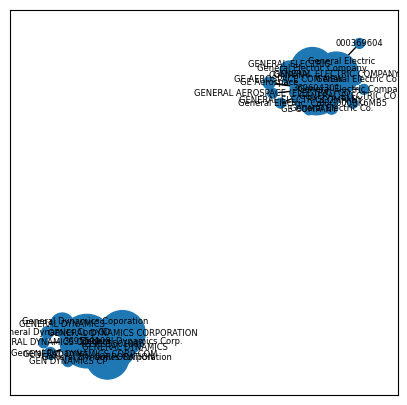

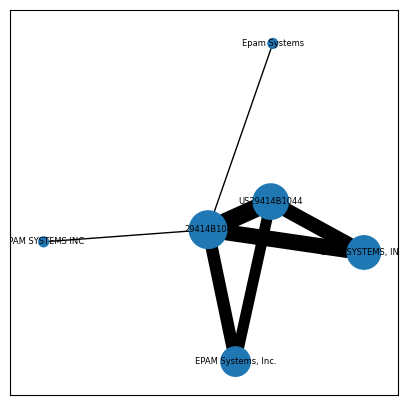

ic| sorted(eigenvalues)[:5]: [np.float64(-1.0607689455022984e-16),
                              np.float64(0.9952688710706333),
                              np.float64(0.9999999999999997),
                              np.float64(1.0000000000000002),
                              np.float64(1.4435751905204237)]
ic| k: np.int64(1)
ic| k: np.int64(1)


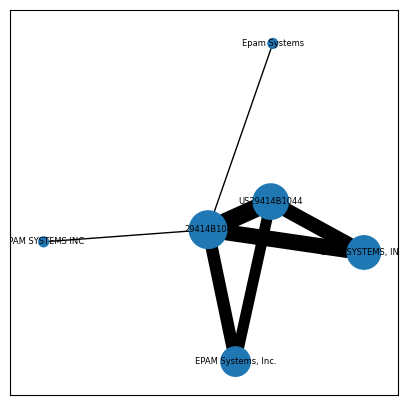

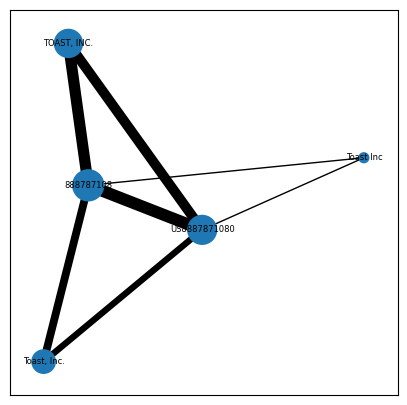

ic| sorted(eigenvalues)[:5]: [np.float64(-2.417670029831787e-16),
                              np.float64(0.9974058486303331),
                              np.float64(1.0000000000000004),
                              np.float64(1.432338589614253),
                              np.float64(1.570255561755415)]
ic| k: np.int64(1)
ic| k: np.int64(1)


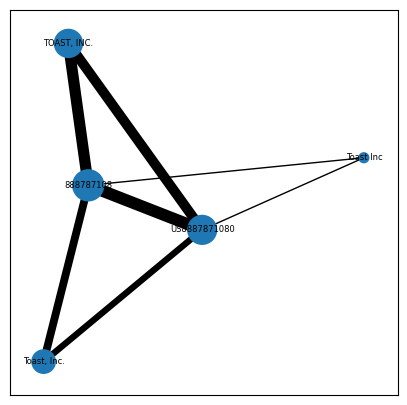

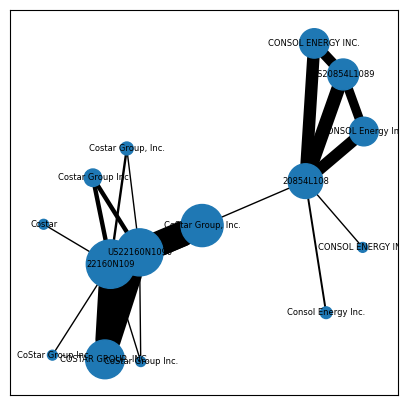

ic| sorted(eigenvalues)[:5]: [np.float64(3.687906999944832e-16),
                              np.float64(0.0017228841842573317),
                              np.float64(0.9890014434074038),
                              np.float64(0.9961438727424492),
                              np.float64(0.9999999999999982)]
ic| k: np.int64(2)
ic| k: np.int64(2)


Removed node US22160N1090 with betweenness centrality 0.6484
Removed node 22160N109 with betweenness centrality 0.7308


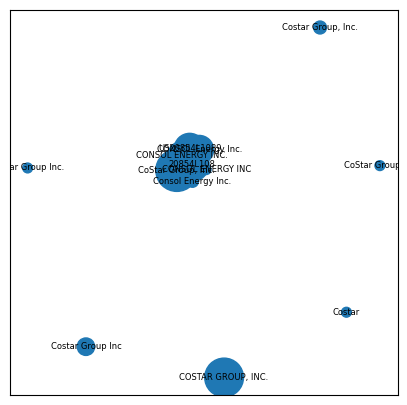

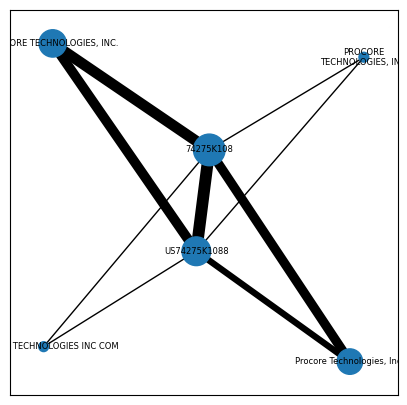

ic| sorted(eigenvalues)[:5]: [np.float64(-1.353084311367242e-16),
                              np.float64(0.9782731210268247),
                              np.float64(1.0000000000000002),
                              np.float64(1.0000000000000007),
                              np.float64(1.4232847734208642)]
ic| k: np.int64(1)
ic| k: np.int64(1)


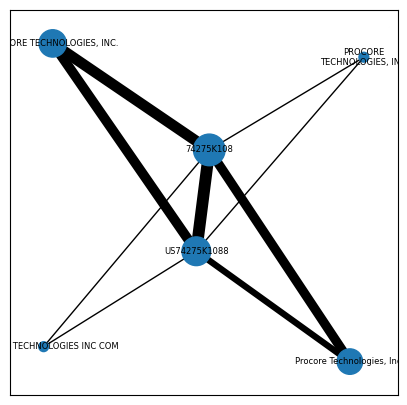

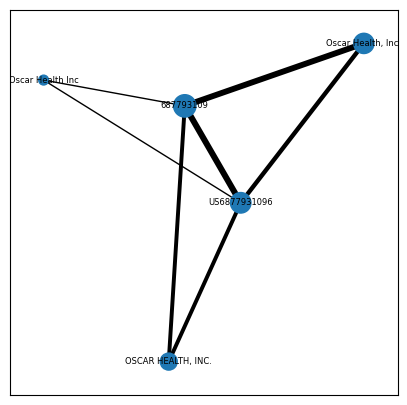

ic| sorted(eigenvalues)[:5]: [np.float64(3.278627369220502e-16),
                              np.float64(0.9769493025902708),
                              np.float64(1.0),
                              np.float64(1.4316330057523863),
                              np.float64(1.5914176916573413)]
ic| k: np.int64(1)
ic| k: np.int64(1)


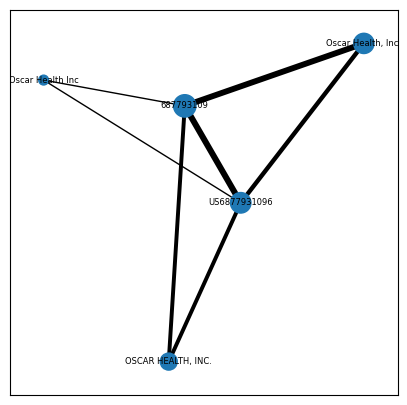

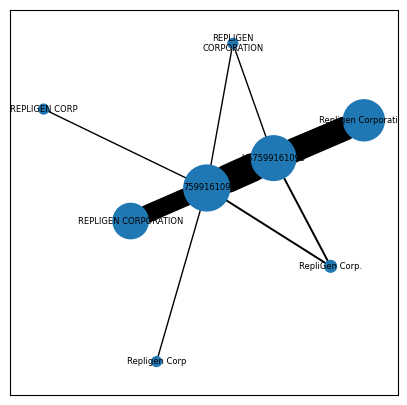

ic| sorted(eigenvalues)[:5]: [np.float64(1.3648568320921964e-16),
                              np.float64(0.9977314649713497),
                              np.float64(0.9999999999999996),
                              np.float64(1.0),
                              np.float64(1.0)]
ic| k: np.int64(1)
ic| k: np.int64(1)


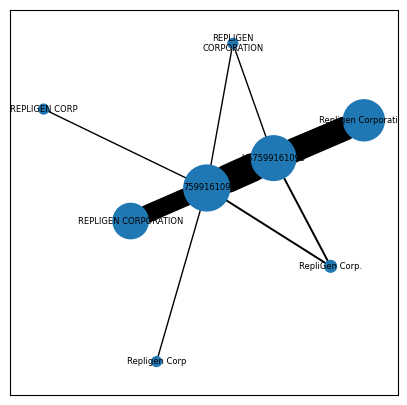

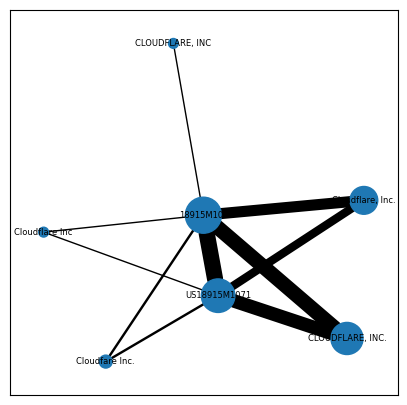

ic| sorted(eigenvalues)[:5]: [np.float64(1.2090297424644386e-16),
                              np.float64(0.9864872100594211),
                              np.float64(0.9999999999999996),
                              np.float64(1.0),
                              np.float64(1.0000000000000004)]
ic| k: np.int64(1)
ic| k: np.int64(1)


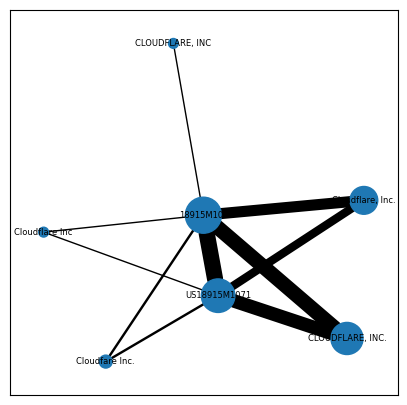

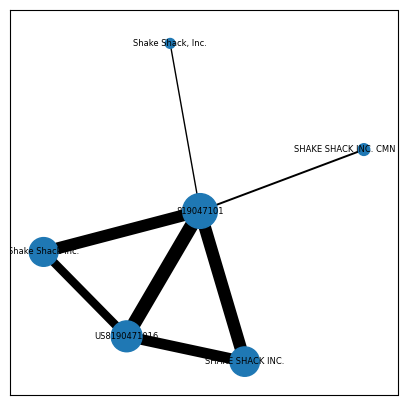

ic| sorted(eigenvalues)[:5]: [np.float64(-3.812835411635805e-17),
                              np.float64(0.9798487150671884),
                              np.float64(1.0),
                              np.float64(1.0000000000000002),
                              np.float64(1.4003045509355374)]
ic| k: np.int64(1)
ic| k: np.int64(1)


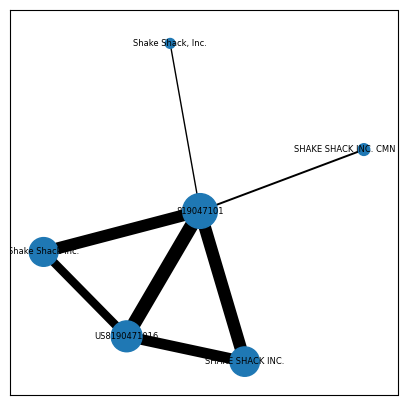

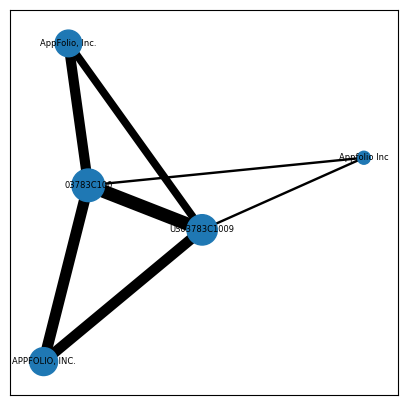

ic| sorted(eigenvalues)[:5]: [np.float64(1.5644547965114843e-16),
                              np.float64(0.9870127747187315),
                              np.float64(0.9999999999999998),
                              np.float64(1.439634559433683),
                              np.float64(1.5733526658475856)]
ic| k: np.int64(1)
ic| k: np.int64(1)


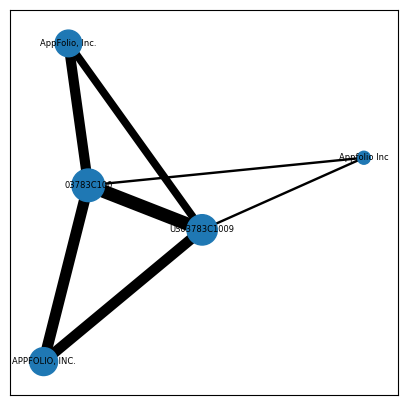

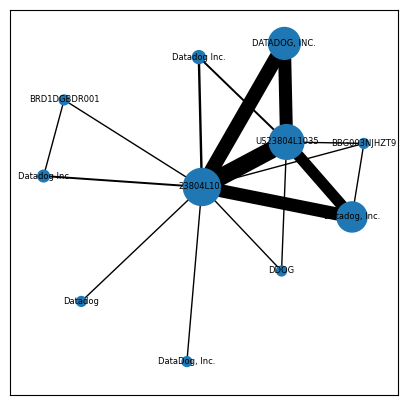

ic| sorted(eigenvalues)[:5]: [np.float64(1.369301101609517e-16),
                              np.float64(0.5911601834541212),
                              np.float64(0.9660576135418414),
                              np.float64(0.994480550623169),
                              np.float64(0.9999999999999994)]
ic| k: np.int64(1)
ic| k: np.int64(1)


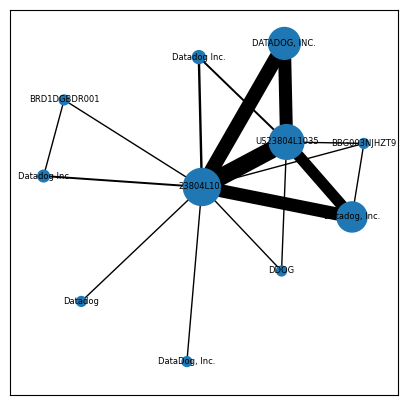

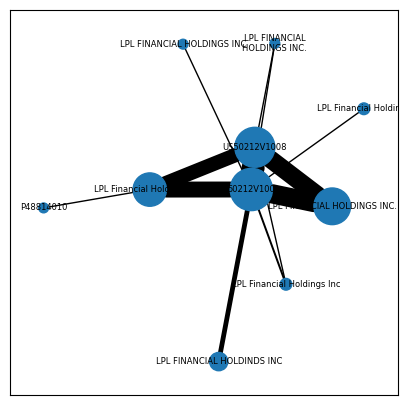

ic| sorted(eigenvalues)[:5]: [np.float64(3.7945046948204763e-16),
                              np.float64(0.9486658770886103),
                              np.float64(0.9792436424931508),
                              np.float64(0.9999999999999993),
                              np.float64(0.9999999999999998)]
ic| k: np.int64(1)
ic| k: np.int64(1)


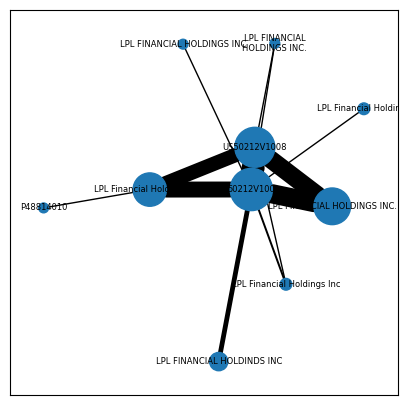

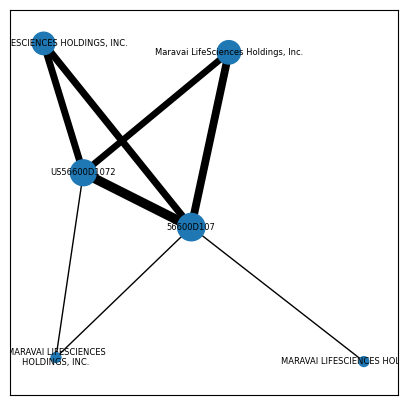

ic| sorted(eigenvalues)[:5]: [np.float64(2.36984266345013e-17),
                              np.float64(0.983992152755204),
                              np.float64(0.9999999999999998),
                              np.float64(1.0),
                              np.float64(1.454641584728795)]
ic| k: np.int64(1)
ic| k: np.int64(1)


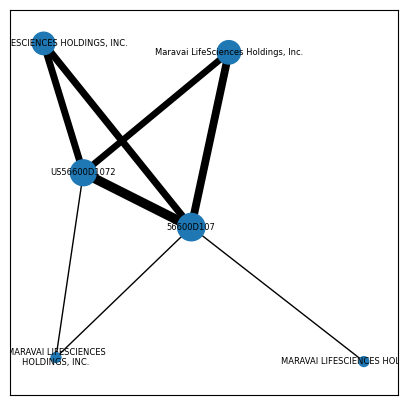

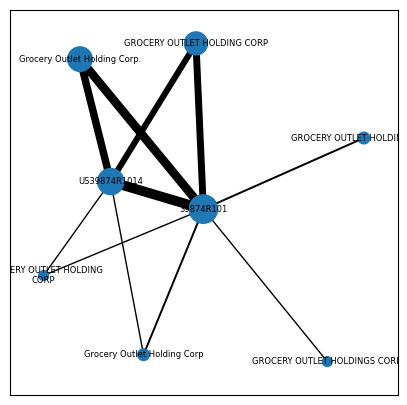

ic| sorted(eigenvalues)[:5]: [np.float64(9.10459556411459e-17),
                              np.float64(0.9776019304526844),
                              np.float64(0.9999999999999997),
                              np.float64(0.9999999999999999),
                              np.float64(0.9999999999999999)]
ic| k: np.int64(1)
ic| k: np.int64(1)


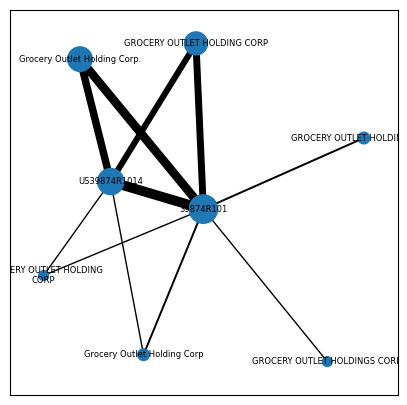

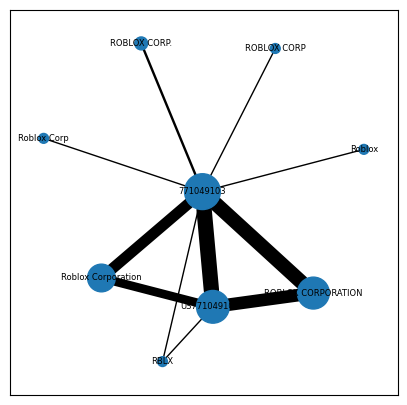

ic| sorted(eigenvalues)[:5]: [np.float64(-1.7827378035566696e-16),
                              np.float64(0.9805871997558998),
                              np.float64(0.9999999999999999),
                              np.float64(1.0),
                              np.float64(1.0000000000000002)]
ic| k: np.int64(1)
ic| k: np.int64(1)


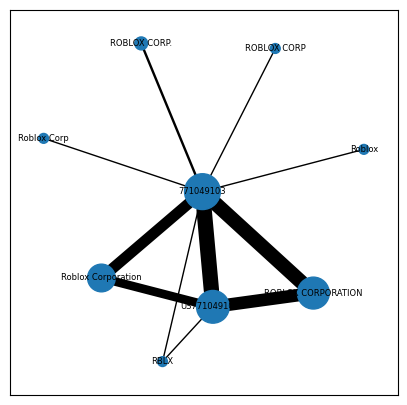

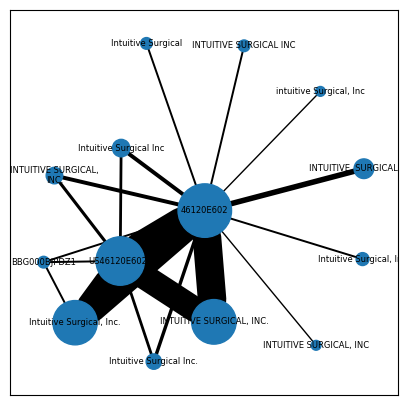

ic| sorted(eigenvalues)[:5]: [np.float64(2.2026910177103497e-17),
                              np.float64(0.9741983072743549),
                              np.float64(0.9856148074940885),
                              np.float64(0.9999999999999991),
                              np.float64(0.9999999999999994)]
ic| k: np.int64(1)
ic| k: np.int64(1)


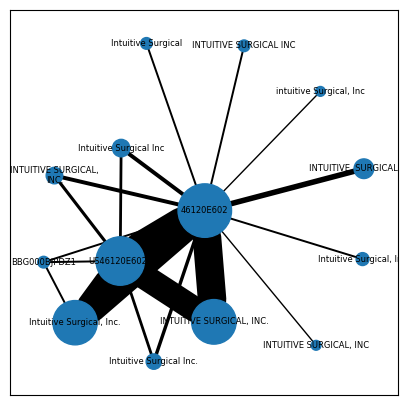

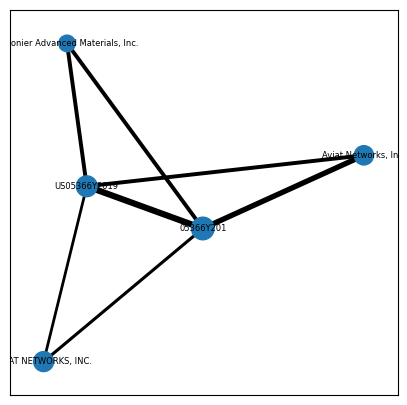

ic| sorted(eigenvalues)[:5]: [np.float64(3.2839290439908083e-16),
                              np.float64(0.9777722114756346),
                              np.float64(1.0),
                              np.float64(1.4345201836869852),
                              np.float64(1.5877076048373806)]
ic| k: np.int64(1)
ic| k: np.int64(1)


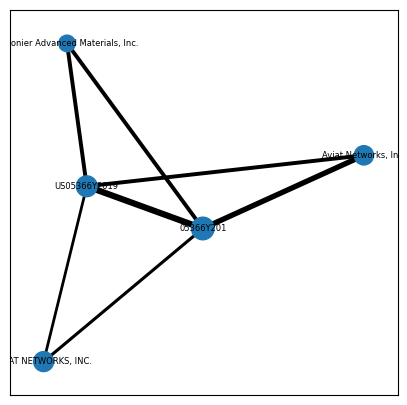

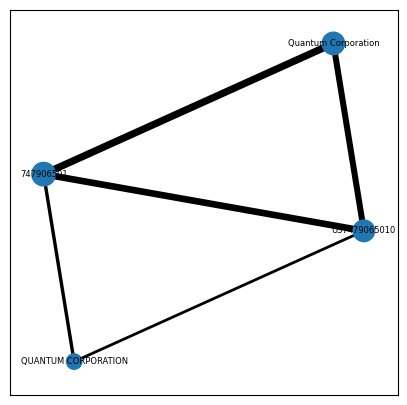

ic| sorted(eigenvalues)[:5]: [np.float64(-1.5561981310983682e-16),
                              np.float64(0.9998745105557125),
                              np.float64(1.4108185928160342),
                              np.float64(1.5893068966282529)]
ic| k: np.int64(1)
ic| k: np.int64(1)


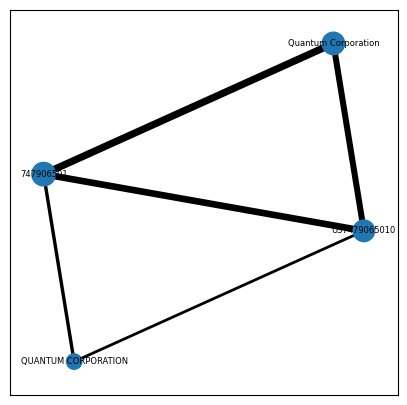

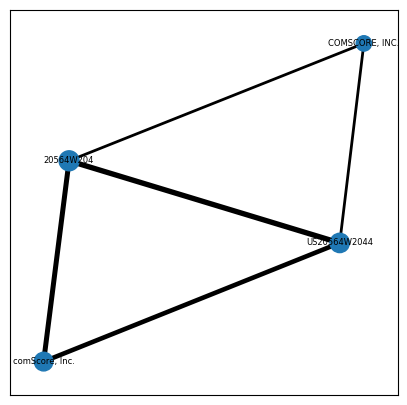

ic| sorted(eigenvalues)[:5]: [np.float64(-2.448799271974952e-16),
                              np.float64(0.998609681562709),
                              np.float64(1.4698293756081067),
                              np.float64(1.5315609428291834)]
ic| k: np.int64(1)
ic| k: np.int64(1)


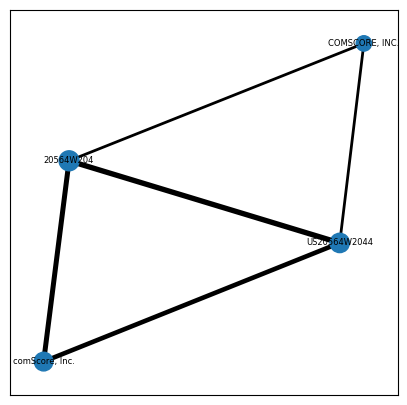

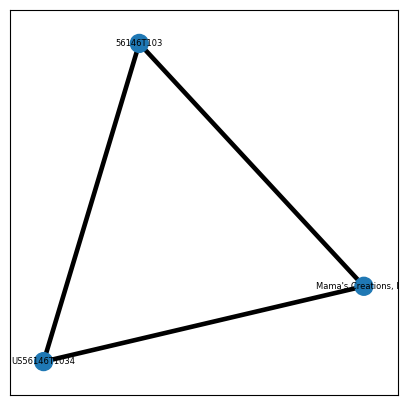

ic| sorted(eigenvalues)[:5]: [np.float64(5.551115123125783e-17), np.float64(1.5), np.float64(1.5)]
ic| k: np.int64(1)
ic| k: np.int64(1)


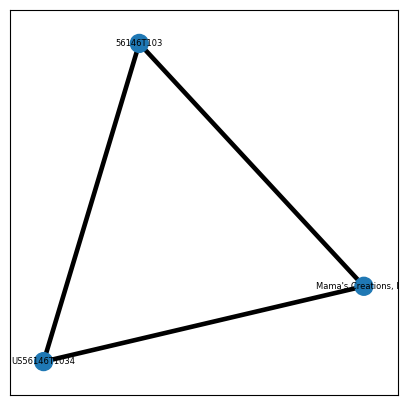

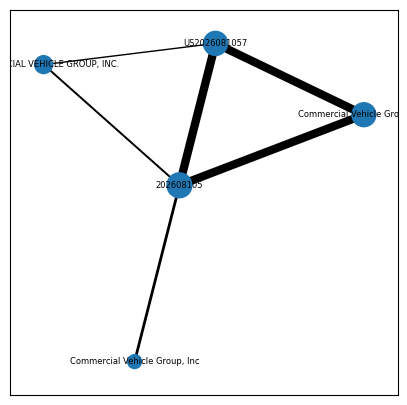

ic| sorted(eigenvalues)[:5]: [np.float64(1.0151407191764147e-16),
                              np.float64(0.9494143833008691),
                              np.float64(1.0),
                              np.float64(1.4974319276020698),
                              np.float64(1.5531536890970614)]
ic| k: np.int64(1)
ic| k: np.int64(1)


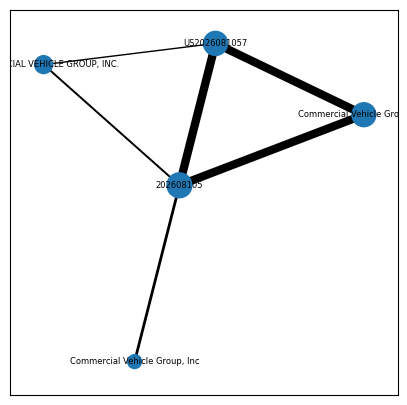

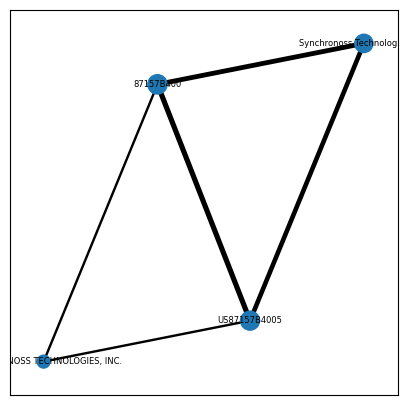

ic| sorted(eigenvalues)[:5]: [np.float64(-4.488440946814082e-16),
                              np.float64(0.9996785603024504),
                              np.float64(1.483004606166363),
                              np.float64(1.5173168335311866)]
ic| k: np.int64(1)
ic| k: np.int64(1)


KeyboardInterrupt: 

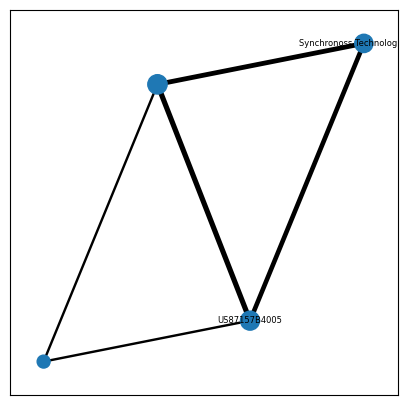

In [194]:
for subg in subgraphs:
    partition_companies_graph_where_necessary(
        subg, "n_0val_eigeinvalues", "betweenness_centrality", True
    )

In [ ]:
subgraphs

In [180]:
partition_companies_graph_where_necessary(
    extract_specific_name_subgraph("amazon", G),
    "n_0val_eigeinvalues",
    "articulation_points",
    True,
)

AttributeError: 'str' object has no attribute 'nodes'

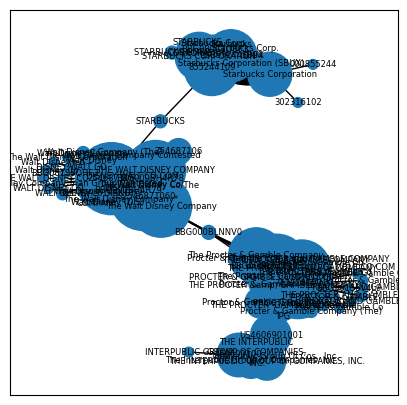

ic| sorted(eigenvalues)[:5]: [np.float64(-2.3921665018429678e-17),
                              np.float64(0.00010778806943998467),
                              np.float64(0.00040839180140143694),
                              np.float64(0.0009684318223592634),
                              np.float64(0.5000250216775516)]
ic| k: np.int64(4)
ic| _: 0
ic| [(c, G.degree(c, weight="count")) for c in cut_points]: [('STARBUCKS', 2),
                                                             ('BBG000BLNNV0', 12),
                                                             ('US4606901001', 588),
                                                             ('460690100', 680),
                                                             ('Starbucks Corporation', 733),
                                                             ('855244109', 1809),
                                                             ('THE WALT DISNEY COMPANY', 2519),
                                                

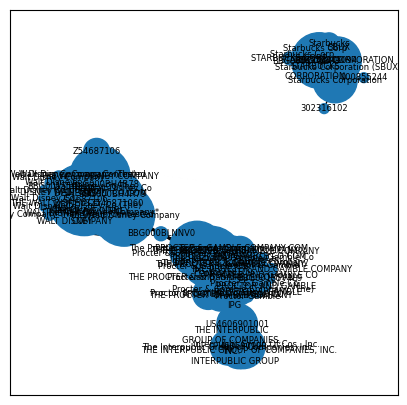

ic| _: 1
ic| [(c, G.degree(c, weight="count")) for c in cut_points]: [('BBG000BLNNV0', 12),
                                                             ('US4606901001', 588),
                                                             ('460690100', 680),
                                                             ('Starbucks Corporation', 733),
                                                             ('855244109', 1808),
                                                             ('THE WALT DISNEY COMPANY', 2519),
                                                             ('742718109', 4143),
                                                             ('254687106', 5281)]
ic| cut_point: 'BBG000BLNNV0'


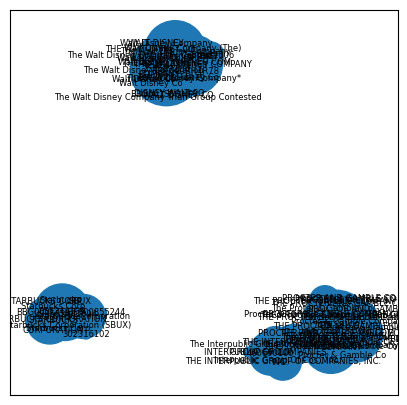

ic| _: 2
ic| [(c, G.degree(c, weight="count")) for c in cut_points]: [('US4606901001', 588),
                                                             ('460690100', 680),
                                                             ('Starbucks Corporation', 733),
                                                             ('855244109', 1808),
                                                             ('THE WALT DISNEY COMPANY', 2519),
                                                             ('742718109', 4141),
                                                             ('254687106', 5279)]
ic| cut_point: 'US4606901001'


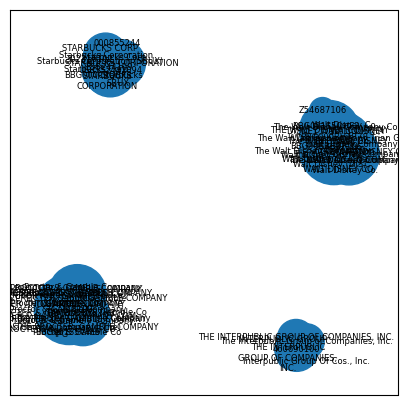

ic| k: np.int64(4)


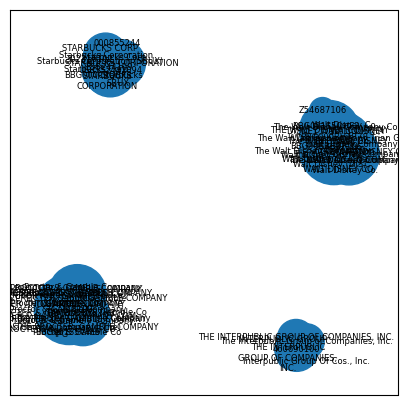

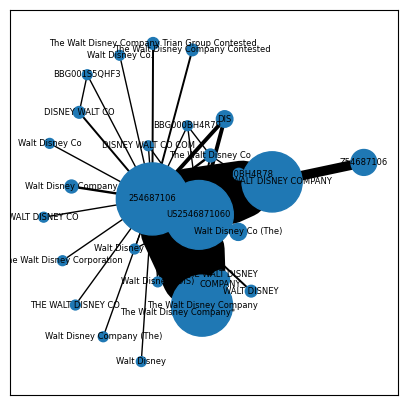

ic| sorted(eigenvalues)[:5]: [np.float64(-5.704134785257663e-16),
                              np.float64(0.591704351460793),
                              np.float64(0.733173520944921),
                              np.float64(0.8957938080227466),
                              np.float64(0.997035577702685)]
ic| k: np.int64(1)
ic| k: np.int64(1)


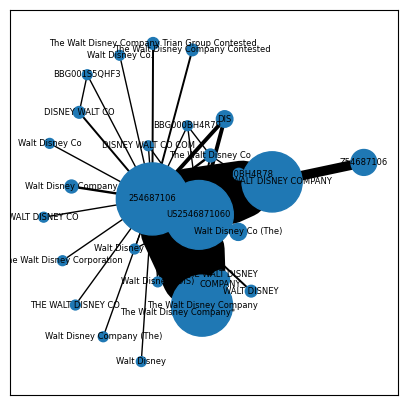

In [150]:
for t in [
    "erroneously_linked",
    "correctly_linked",
]:
    partition_companies_graph_where_necessary(
        disney[t], "n_0val_eigeinvalues", "articulation_points", True
    )

In [81]:
def find_bridges_and_sort_by_betweenness(G):
    # Find all bridges in the graph
    bridges = list(nx.local_bridges(G, weight="count"))

    ic(bridges)

    # Calculate betweenness centrality for all edges
    betweenness_centrality = nx.edge_betweenness_centrality(G, weight="count")

    # Filter the betweenness centrality to only include bridges
    bridges_with_betweenness = [
        (bridge, round(betweenness_centrality[bridge], 3)) for bridge in bridges
    ]

    # Sort bridges by their betweenness centrality in descending order
    sorted_bridges = sorted(bridges_with_betweenness, key=lambda x: x[1], reverse=True)

    return sorted_bridges


find_bridges_and_sort_by_betweenness(disney["erroneously_linked"])

ic| bridges: [('Proctor Gamble', '742718109', inf),
              ('PROCTOR & GAMBLE', '742718109', inf),
              ('WALT DISNEY CO', '254687106', inf),
              ('Walt Disney Co.', '254687106', inf),
              ('STARBUCKS CORP', '855244109', inf),
              ('302316102', 'Starbucks Corporation', inf),
              ('Procter & Gamble Co', '742718109', inf),
              ('460690100', 'INTERPUBLIC GROUP', inf),
              ('Z54687106', 'THE WALT DISNEY COMPANY', inf),
              ('The Walt Disney Company Trian Group Contested', '254687106', inf),
              ('The Walt Disney Corporation', '254687106', inf),
              ('254687106', 'Walt Disney Co', inf),
              ('254687106', 'STARBUCKS', inf),
              ('254687106', 'WALT DISNEY', inf),
              ('254687106', 'Walt Disney', inf),
              ('254687106', 'Walt Disney Company (The)', inf),
              ('254687106', 'The Walt Disney Company Contested', inf),
              ('254687106'

KeyError: ('Proctor Gamble', '742718109', inf)

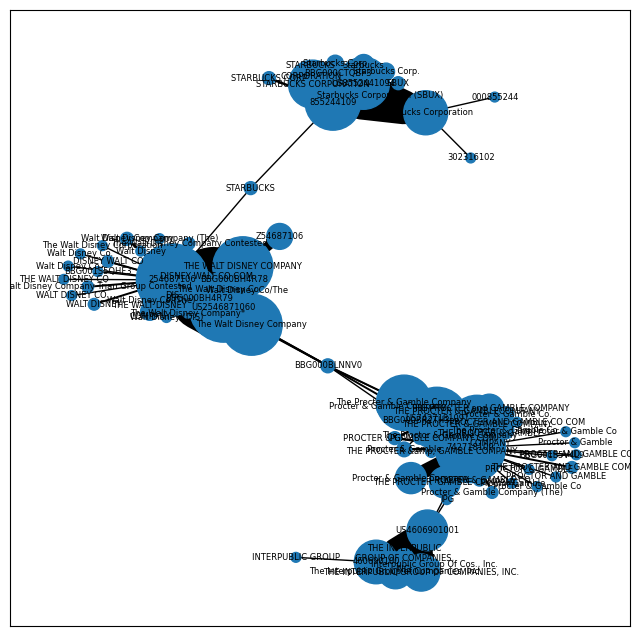

[('254687106', 0.6253086419753087),
 ('742718109', 0.5467592592592597),
 ('BBG000BLNNV0', 0.5044238683127572),
 ('STARBUCKS', 0.2895061728395062),
 ('855244109', 0.2844135802469136),
 ('US4606901001', 0.1398148148148148),
 ('US7427181091', 0.1020061728395062),
 ('US2546871060', 0.08333333333333333),
 ('Starbucks Corporation', 0.049074074074074076),
 ('460690100', 0.025617283950617284),
 ('THE WALT DISNEY COMPANY', 0.024691358024691357),
 ('US8552441094', 0.00787037037037037),
 ('The Procter & Gamble Company', 0.00452674897119341),
 ('BBG000BH4R78', 0.00020576131687242798),
 ('The Walt Disney Co', 0.00010288065843621399),
 ('DIS', 0.0),
 ('Proctor Gamble', 0.0),
 ('Walt Disney Co (The)', 0.0),
 ('BBG000BH4R79', 0.0),
 ('PROCTOR & GAMBLE', 0.0),
 ('Procter & Gamble', 0.0),
 ('PROCTER & GAMBLE COMPANY COM', 0.0),
 ('The Proctor & Gamble Company', 0.0),
 ('WALT DISNEY CO', 0.0),
 ('Walt Disney Co.', 0.0),
 ('Walt Disney Co/The', 0.0),
 ('STARBUCKS CORP', 0.0),
 ('302316102', 0.0),
 ('Proct

In [65]:
draw_graph(disney["erroneously_linked"], 8)
sorted(
    nx.betweenness_centrality(disney["erroneously_linked"]).items(),
    key=lambda x: x[1],
    reverse=True,
)

ic| c: 'betweenness', w: 'count'


ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

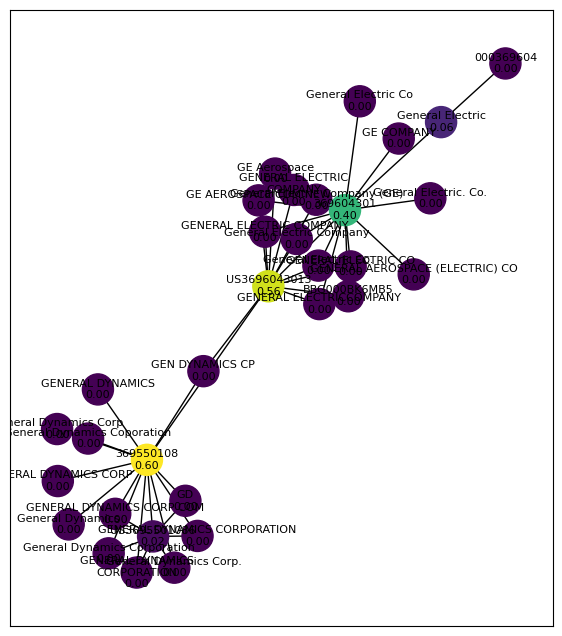

In [132]:
# def plot_graph_by_centrality(
#     G: nx.Graph,
#     centrality_metric: Literal[
#         "betweenness", "degree", "closeness", "communicability_betweenness_centrality"
#     ] = "betweenness",
#     weight: Literal["count"] | None = None,
#     size: int = 7,
# ):
#     """
#     Plot a graph with nodes colored by their centrality values.

#     Parameters:
#     - G: The input graph (networkx.Graph)
#     - centrality_metric: The centrality metric to use. Supported values: "betweenness", "degree", "closeness"
#     """
#     # Compute centrality based on the chosen metric
#     if centrality_metric == "betweenness":
#         centrality = nx.betweenness_centrality(G)
#     elif centrality_metric == "degree":
#         centrality = nx.degree_centrality(G)
#     elif centrality_metric == "closeness":
#         centrality = nx.closeness_centrality(G)
#     elif centrality_metric == "communicability_betweenness_centrality":
#         centrality = nx.communicability_betweenness_centrality(G)
#     else:
#         raise ValueError(f"Unsupported centrality metric: {centrality_metric}")

#     # Normalize centrality values for coloring
#     centrality_values = np.array(list(centrality.values()))
#     norm_centrality = (centrality_values - centrality_values.min()) / (
#         centrality_values.max() - centrality_values.min()
#     )

#     # Map centrality values to colors
#     cmap = plt.cm.viridis  # Change colormap here if desired
#     node_colors = cmap(norm_centrality)

#     # Draw the graph with colored nodes based on centrality
#     pos = nx.spring_layout(G, seed=42)  # Layout for consistent plotting
#     plt.figure(figsize=(size, size + 1))
#     nx.draw_networkx(
#         G,
#         pos,
#         node_color=node_colors,
#         with_labels=True,
#         node_size=500,
#         font_size=10,
#         font_color="black",
#         cmap=cmap,
#     )
#     labels = {node: f"{node}\n{centrality[node]:.2f}" for node in G.nodes()}
#     nx.draw_networkx_labels(G, pos, labels, font_size=8)

#     # Add a colorbar to show the centrality value mapping
#     sm = plt.cm.ScalarMappable(
#         cmap=cmap,
#         norm=plt.Normalize(vmin=centrality_values.min(), vmax=centrality_values.max()),
#     )
#     sm.set_array([])
#     plt.colorbar(sm, label=f"{centrality_metric.capitalize()} Centrality")

#     plt.title(f"Graph Colored by {centrality_metric.capitalize()} Centrality")
#     plt.show()
#     # # Add a colorbar to show the centrality value mapping
#     # # sm = plt.cm.ScalarMappable(
#     # #     cmap=cmap,
#     # #     norm=plt.Normalize(vmin=centrality_values.min(), vmax=centrality_values.max()),
#     # # )
#     # # sm.set_array([])
#     # # plt.colorbar(sm, label=f"{centrality_metric.capitalize()} Centrality")
#     # labels = {node: f"{node}\n{centrality[node]:.2f}" for node in G.nodes()}
#     # nx.draw_networkx_labels(G, pos, labels, font_size=8)


#     # plt.title(f"Graph Colored by {centrality_metric.capitalize()} Centrality")
#     # plt.show()
def plot_graph_by_centrality(
    G: nx.Graph,
    centrality_metric: Literal[
        "betweenness", "degree", "closeness", "communicability_betweenness_centrality"
    ] = "betweenness",
    weight: Literal["count"] | None = None,
    size: int = 7,
):
    """
    Plot a graph with nodes colored by their centrality values and centrality values displayed next to each node.

    Parameters:
    - G: The input graph (networkx.Graph)
    - centrality_metric: The centrality metric to use. Supported values: "betweenness", "degree", "closeness"
    """
    # Compute centrality based on the chosen metric
    if centrality_metric == "betweenness":
        centrality = nx.betweenness_centrality(G)
    elif centrality_metric == "degree":
        centrality = nx.degree_centrality(G)
    elif centrality_metric == "closeness":
        centrality = nx.closeness_centrality(G)
    elif centrality_metric == "communicability_betweenness_centrality":
        centrality = nx.communicability_betweenness_centrality(G)
    else:
        raise ValueError(f"Unsupported centrality metric: {centrality_metric}")

    # Normalize centrality values for coloring
    centrality_values = np.array(list(centrality.values()))
    norm_centrality = (centrality_values - centrality_values.min()) / (
        centrality_values.max() - centrality_values.min()
    )

    # Map centrality values to colors
    cmap = plt.cm.viridis  # Change colormap here if desired
    node_colors = cmap(norm_centrality)

    # Draw the graph with colored nodes based on centrality
    pos = nx.spring_layout(G, seed=42)  # Layout for consistent plotting
    plt.figure(figsize=(size, size + 1))
    nodes = nx.draw_networkx_nodes(
        G,
        pos,
        node_color=node_colors,
        node_size=500,
        cmap=cmap,
    )
    nx.draw_networkx_edges(G, pos)
    nx.draw_networkx_labels(
        G,
        pos,
        labels={node: f"{node}\n{centrality[node]:.2f}" for node in G.nodes()},
        font_size=8,
    )

    # Add a colorbar to show the centrality value mapping
    sm = plt.cm.ScalarMappable(
        cmap=cmap,
        norm=plt.Normalize(vmin=centrality_values.min(), vmax=centrality_values.max()),
    )
    sm.set_array([])
    plt.colorbar(sm, label=f"{centrality_metric.capitalize()} Centrality")

    plt.title(f"Graph Colored by {centrality_metric.capitalize()} Centrality")
    plt.show()


for c in [
    "betweenness",
    "degree",
    "closeness",
    "communicability_betweenness_centrality",
]:
    for w in ["count", None]:
        ic(c, w)
        plot_graph_by_centrality(ge, centrality_metric=c, weight=w)

In [107]:
import networkx as nx
from itertools import combinations


def pair_edge_betweenness_centrality(G):
    # Get all pairs of nodes
    node_pairs = list(combinations(G.nodes(), 2))

    # Create a dictionary to store co-betweenness centrality for edge pairs
    edge_pair_centrality = {}

    # Iterate over all pairs of nodes
    for source, target in node_pairs:
        # Get all shortest paths between source and target
        paths = list(nx.all_shortest_paths(G, source=source, target=target))

        # For each path, look at the edges involved
        for path in paths:
            # Convert node path to edge path (tuples of nodes)
            edges_in_path = list(zip(path[:-1], path[1:]))

            # Iterate over all pairs of edges in this path
            for edge1, edge2 in combinations(edges_in_path, 2):
                edge_pair = tuple(sorted([edge1, edge2]))

                # Initialize the edge pair count if not already present
                if edge_pair not in edge_pair_centrality:
                    edge_pair_centrality[edge_pair] = 0

                # Increment count for this pair of edges
                edge_pair_centrality[edge_pair] += 1

    return edge_pair_centrality


# Example usage:
G = nx.Graph()
G.add_edges_from([(0, 1), (1, 2), (2, 3), (3, 4), (0, 4), (1, 3), (0, 2)])

# Compute pair edge betweenness centrality
centrality = pair_edge_betweenness_centrality(G)
print(centrality)
# Print resultsK

{((0, 1), (1, 3)): 1, ((0, 4), (4, 3)): 1, ((0, 2), (2, 3)): 1, ((0, 4), (1, 0)): 1, ((1, 3), (3, 4)): 1, ((2, 3), (3, 4)): 1, ((0, 4), (2, 0)): 1}


In [108]:
pair_edge_betweenness_centrality(ge)

{(('369604301', 'GENERAL ELECTRIC CO'),
  ('General Electric Company', '369604301')): 1,
 (('General Electric Company', 'US3696043013'),
  ('US3696043013', 'GENERAL ELECTRIC CO')): 1,
 (('General Electric Company', 'US3696043013'),
  ('US3696043013', 'GEN DYNAMICS CP')): 1,
 (('General Electric Company', 'US3696043013'),
  ('US3696043013', '369550108')): 13,
 (('369550108', 'General Dynamics Corp'),
  ('General Electric Company', 'US3696043013')): 1,
 (('369550108', 'General Dynamics Corp'), ('US3696043013', '369550108')): 2,
 (('369550108', 'GENERAL DYNAMICS'),
  ('General Electric Company', 'US3696043013')): 1,
 (('369550108', 'GENERAL DYNAMICS'), ('US3696043013', '369550108')): 2,
 (('369550108', 'General Dynamics Corp.'),
  ('General Electric Company', 'US3696043013')): 1,
 (('369550108', 'General Dynamics Corp.'), ('US3696043013', '369550108')): 2,
 (('369550108', 'GENERAL DYNAMICS CORP COM'),
  ('General Electric Company', 'US3696043013')): 1,
 (('369550108', 'GENERAL DYNAMICS CO

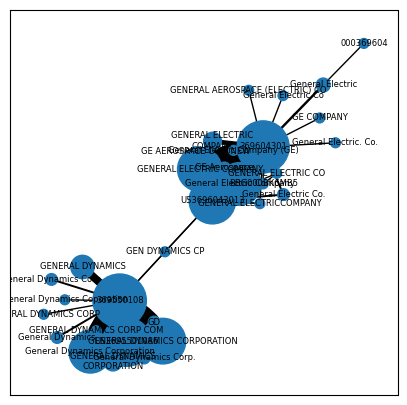

In [113]:
draw_graph(ge, 5)

In [124]:
[x for x in ge.edges().data()]  # if x[0]["field"] == "issuer_name"]

[('General Electric Company',
  '369604301',
  {'count': 356, 'fields': {'cusip', 'issuer_name'}}),
 ('General Electric Company',
  'US3696043013',
  {'count': 214, 'fields': {'isin', 'issuer_name'}}),
 ('GENERAL ELECTRIC CO',
  '369604301',
  {'count': 1, 'fields': {'cusip', 'issuer_name'}}),
 ('GENERAL ELECTRIC CO',
  'US3696043013',
  {'count': 1, 'fields': {'isin', 'issuer_name'}}),
 ('GENERAL ELECTRIC CO',
  'BBG000BK6MB5',
  {'count': 1, 'fields': {'figi', 'issuer_name'}}),
 ('GEN DYNAMICS CP',
  '369550108',
  {'count': 1, 'fields': {'cusip', 'issuer_name'}}),
 ('GEN DYNAMICS CP',
  'US3696043013',
  {'count': 1, 'fields': {'isin', 'issuer_name'}}),
 ('General Dynamics Corp',
  '369550108',
  {'count': 2, 'fields': {'cusip', 'issuer_name'}}),
 ('369550108',
  'General Dynamics Corporation',
  {'count': 357, 'fields': {'cusip', 'issuer_name'}}),
 ('369550108', 'US3695501086', {'count': 601, 'fields': {'cusip', 'isin'}}),
 ('369550108',
  'GENERAL DYNAMICS CORPORATION',
  {'count'

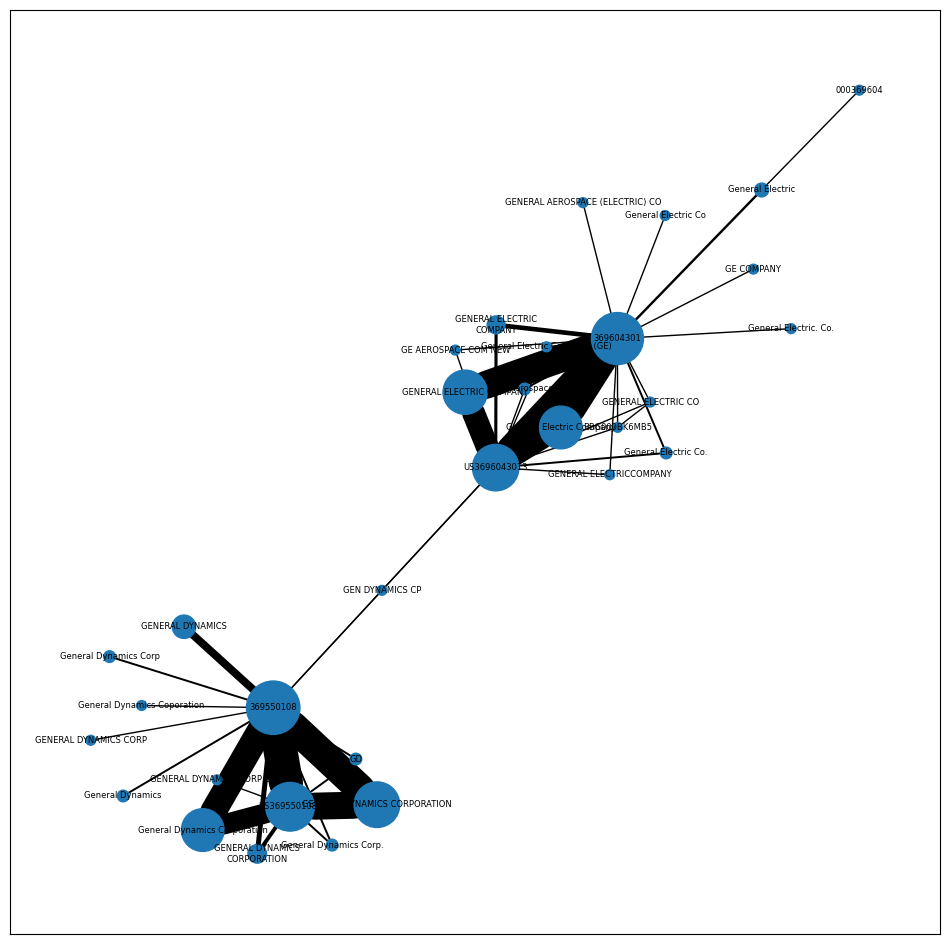

In [126]:
draw_graph(ge)

In [ ]:
ge_names = nx.Graph()
ge_names.add_nodes_from([x for x in ge.nodes().data() if x[1]["field"] == "issuer_name"])
ge_names.add_weighted_edges_from()
draw_graph(ge_names)

NodeView(('General Electric Company', 'GENERAL ELECTRIC CO', 'GEN DYNAMICS CP', 'General Dynamics Corp', '369550108', 'GENERAL DYNAMICS', 'General Dynamics Corp.', 'GENERAL DYNAMICS CORP COM', 'GE AEROSPACE COM NEW', 'US3695501086', 'General Electric Co.', 'General Electric. Co.', 'General Electric Co', 'GENERAL DYNAMICS CORP', 'General Dynamics Corporation', 'GENERAL DYNAMICS\nCORPORATION', 'GENERAL ELECTRIC\nCOMPANY', 'General Electric Company (GE)', 'GENERAL ELECTRICCOMPANY', '369604301', 'General Dynamics', 'GE Aerospace', 'GD', 'General Dynamics Coporation', 'BBG000BK6MB5', 'GENERAL DYNAMICS CORPORATION', '000369604', 'US3696043013', 'GENERAL ELECTRIC COMPANY', 'GENERAL AEROSPACE (ELECTRIC) CO', 'General Electric', 'GE COMPANY'))

In [117]:
ge_names = nx.Graph()
ge_names.add_nodes_from([x for x in ge.nodes().data() if x[1]["field"] == "issuer_name"])
ge_names.add_edges_from([x for x in ge.edges().data() if x["field"] == "issuer_name"])
ge_names.nodes(data=True)
nx.is_isomorphic(ge_names, ge)

True

In [116]:
ge_names.edges.data()

EdgeDataView([])

In [151]:
ge = extract_specific_name_subgraph(subgraphs, "general electric")

/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_82037/942150125.py:18: UserWarning: 2 subgraphs have name='general electric'.
[len(subg.nodes) for subg in collected]=[10, 32]
  warn(alert_str)


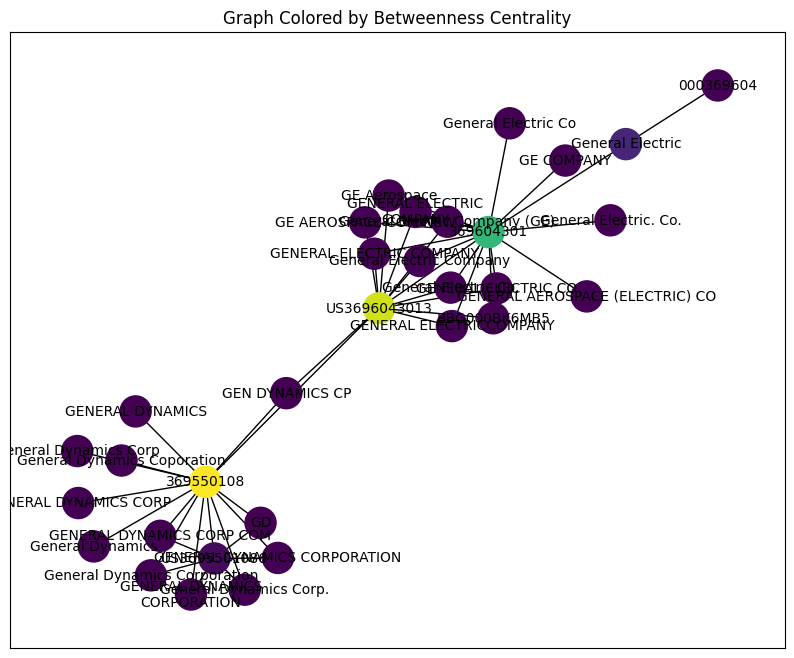

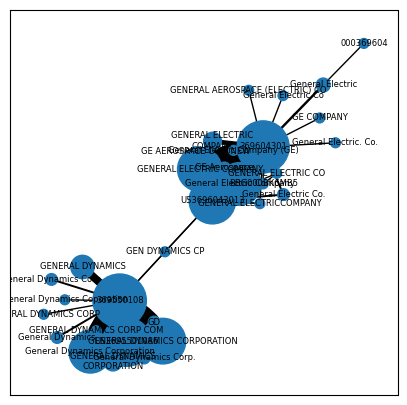

ic| sorted(eigenvalues)[:5]: [np.float64(-8.217271264933111e-17),
                              np.float64(0.0007792678362804459),
                              np.float64(0.5000936208780628),
                              np.float64(0.6672657782879323),
                              np.float64(0.9711734197216843)]
ic| k: np.int64(2)
ic| _: 0
ic| [(c, G.degree(c, weight="count")) for c in cut_points]: [('General Electric', 4),
                                                             ('US3696043013', 998),
                                                             ('369604301', 1285),
                                                             ('369550108', 1477)]
ic| cut_point: 'General Electric'


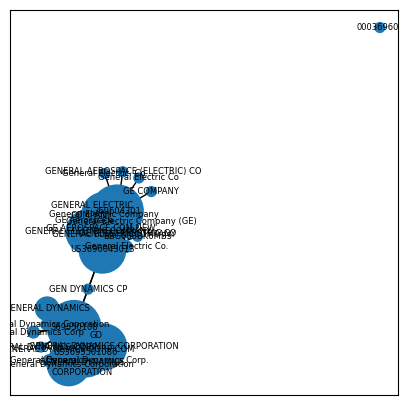

ic| k: np.int64(2)


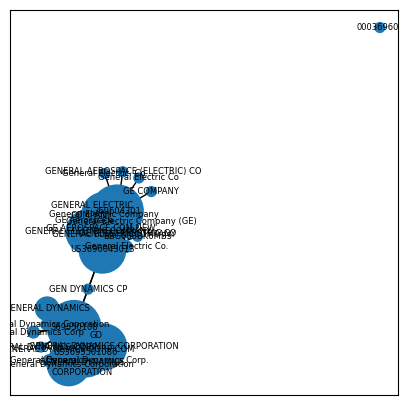

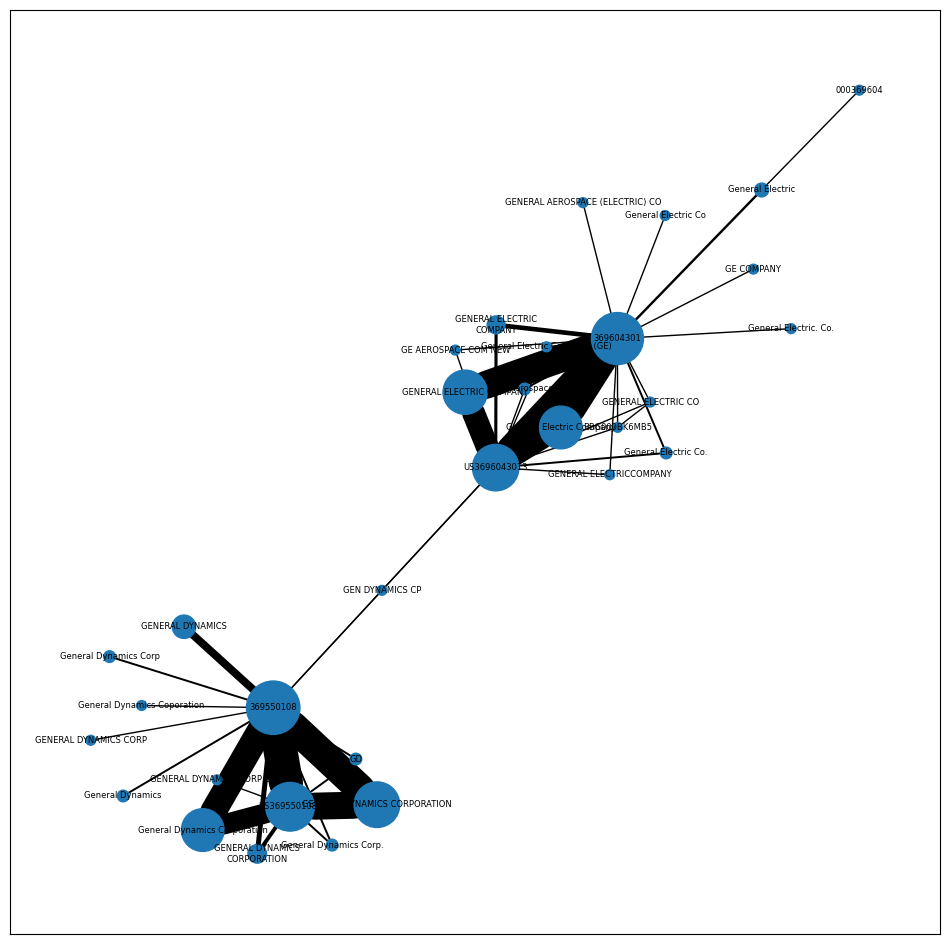

In [49]:
draw_graph(ge)

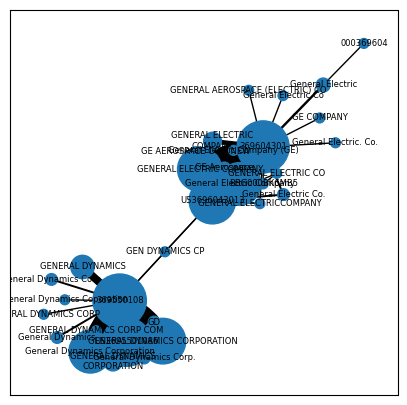

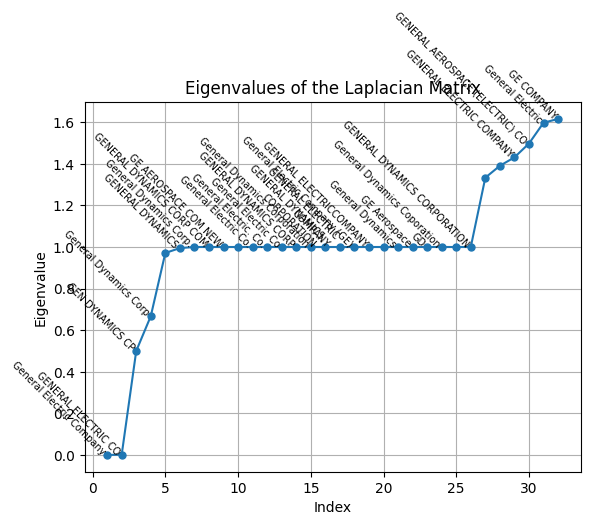

ic| sorted(eigenvalues)[:5]: [np.float64(-8.217271264933111e-17),
                              np.float64(0.0007792678362804459),
                              np.float64(0.5000936208780628),
                              np.float64(0.6672657782879323),
                              np.float64(0.9711734197216843)]
ic| k: np.int64(2)
ic| _: 0


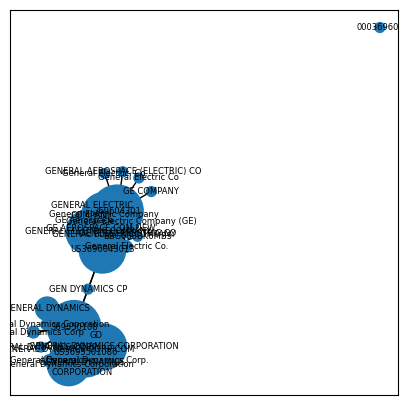

In [47]:
partition_companies_graph_where_necessary(
    ge,
    k_finding_method="n_0val_eigeinvalues",
    processing_method="remove_articulation_nodes",
    verbose=True,
)

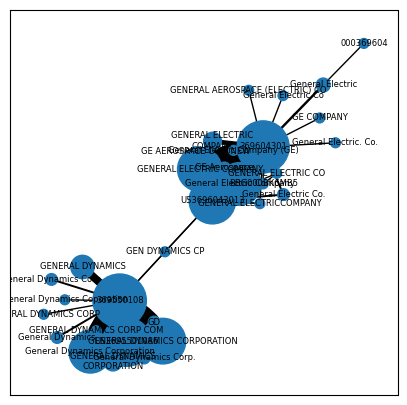

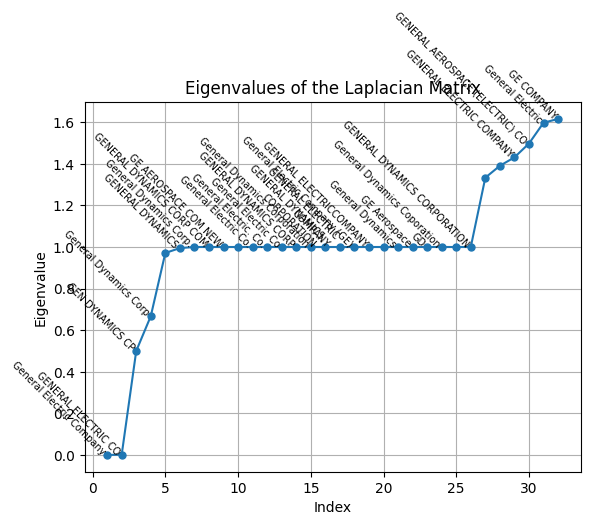

ic| sorted(eigenvalues): [np.float64(-8.217271264933111e-17),
                          np.float64(0.0007792678362804459),
                          np.float64(0.5000936208780628),
                          np.float64(0.6672657782879323),
                          np.float64(0.9711734197216843),
                          np.float64(0.9948223482347185),
                          np.float64(0.9999999999999983),
                          np.float64(0.9999999999999987),
                          np.float64(0.9999999999999987),
                          np.float64(0.9999999999999997),
                          np.float64(0.9999999999999998),
                          np.float64(0.9999999999999998),
                          np.float64(1.0),
                          np.float64(1.0),
                          np.float64(1.0),
                          np.float64(1.0),
                          np.float64(1.0000000000000002),
                          np.float64(1.0000000000000002),
         

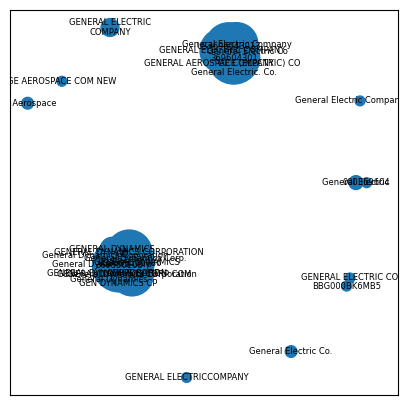

In [24]:
cluster_via_laplacian_kmeans(ge, "n_0val_eigeinvalues")
# draw_graph(ge)

In [93]:
## TEST NEW CLUSTERING

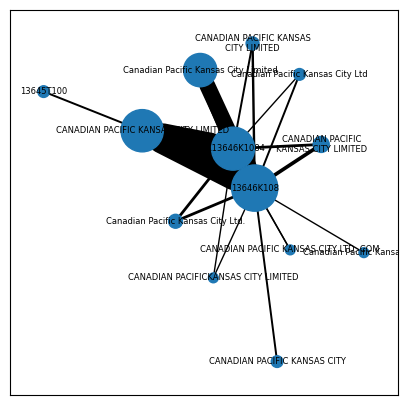

ic| k: 1
ic| edges_to_remove: []


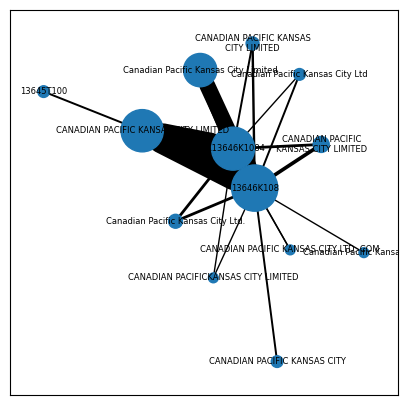

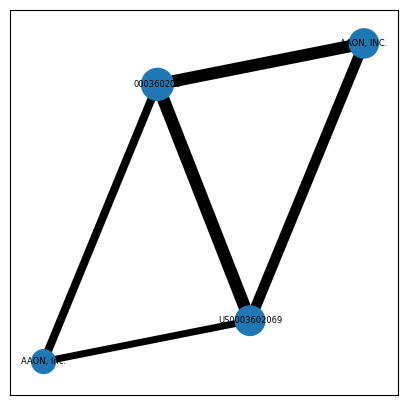

ic| k: 1
ic| edges_to_remove: []


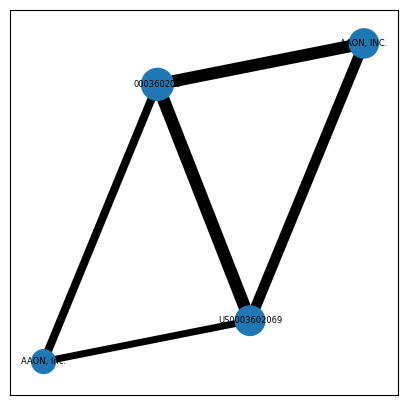

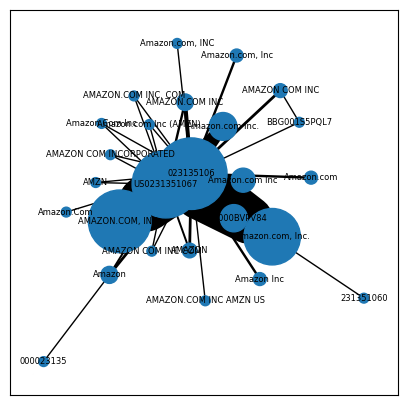

ic| k: 1
ic| edges_to_remove: []


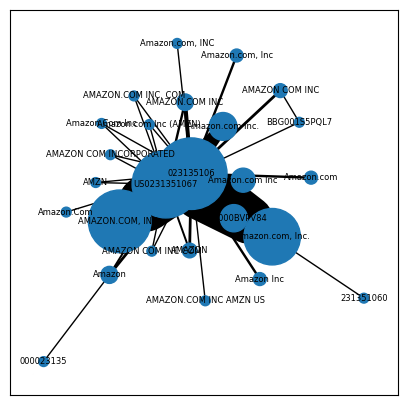

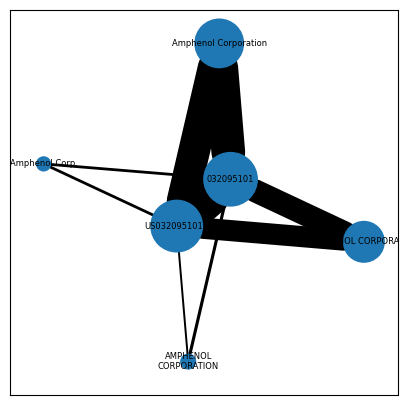

ic| k: 1
ic| edges_to_remove: []


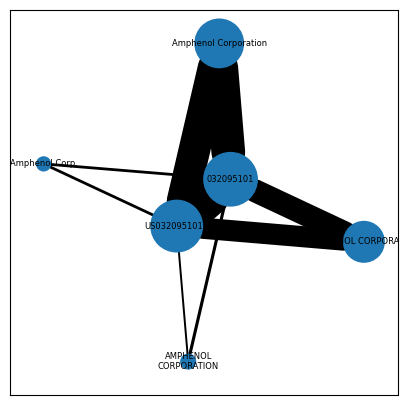

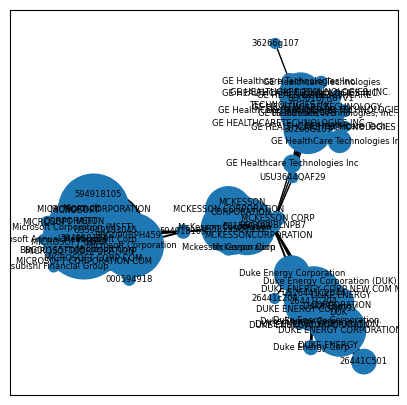

ic| k: 4
ic| edges_to_remove: [('36266G107', 'BBG000BLNPB7'),
                      ('Mckesson Corp', '58155Q103'),
                      ('Mckesson Corp', 'US58155Q1031'),
                      ('GE Healthcare Technologies Inc', 'BBG000BLNPB7'),
                      ('MCKESSON CORPORATION', '58155Q103'),
                      ('MCKESSON CORPORATION', 'US58155Q1031'),
                      ('58155Q103', 'McKesson Corporation'),
                      ('58155Q103', 'MCKESSON
                     CORPORATION'),
                      ('58155Q103', 'Mckesson Corporation'),
                      ('58155Q103', 'BBG000BLNPB7'),
                      ('58155Q103', 'MCKESSONCORPORATION'),
                      ('58155Q103', 'MCKESSON CORP'),
                      ('MCKESSONCORPORATION', 'US58155Q1031'),
                      ('McKesson Corporation', 'US58155Q1031'),
                      ('Microsoft Corporation', '594918103'),
                      ('Duke Energy Corporation', 'BBG000BLNPB7'),
 

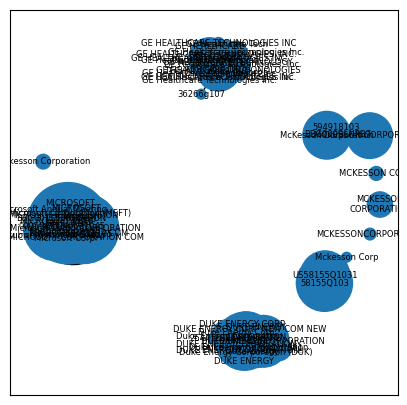

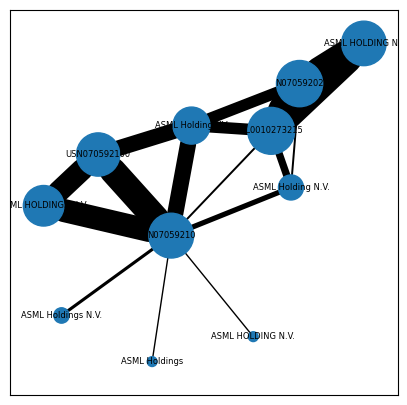

ic| k: 3
ic| edges_to_remove: [('ASML Holding NV', 'N07059202'),
                      ('ASML Holding NV', 'NL0010273215'),
                      ('ASML Holding NV', 'N07059210'),
                      ('ASML Holding N.V.', 'N07059210'),
                      ('N07059210', 'ASML HOLDINGS N.V.'),
                      ('N07059210', 'USN070592100'),
                      ('N07059210', 'NL0010273215')]


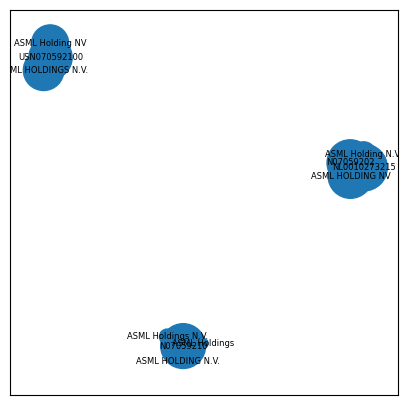

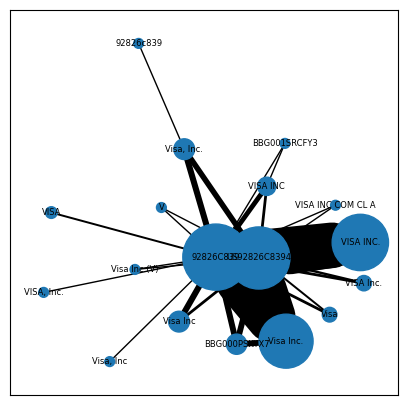

ic| k: 1
ic| edges_to_remove: []


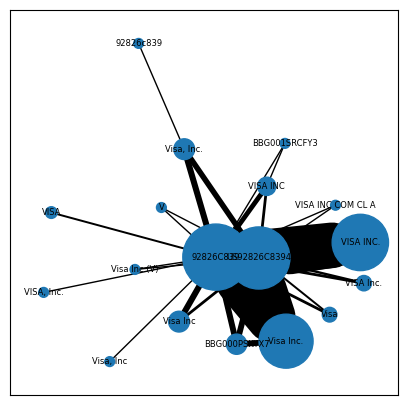

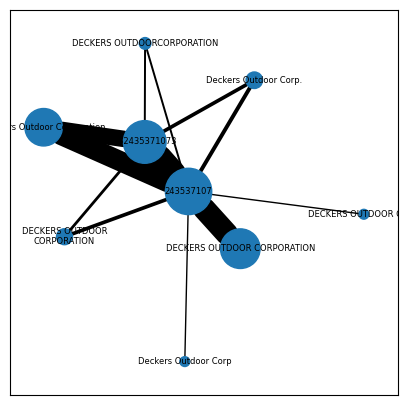

ic| k: 1
ic| edges_to_remove: []


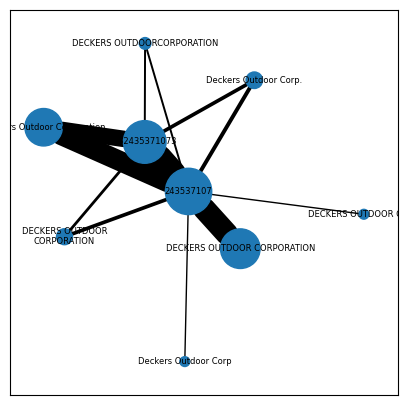

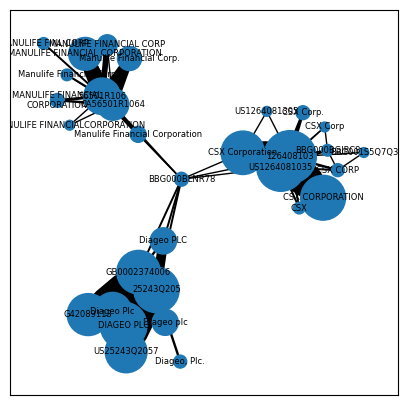

ic| k: 3
ic| edges_to_remove: [('GB0002374006', 'BBG000BLNR78'),
                      ('CSX Corporation', 'BBG000BLNR78'),
                      ('Diageo PLC', 'BBG000BLNR78'),
                      ('126408103', 'BBG000BLNR78'),
                      ('US1264081035', 'BBG000BLNR78'),
                      ('BBG000BLNR78', '25243Q205')]


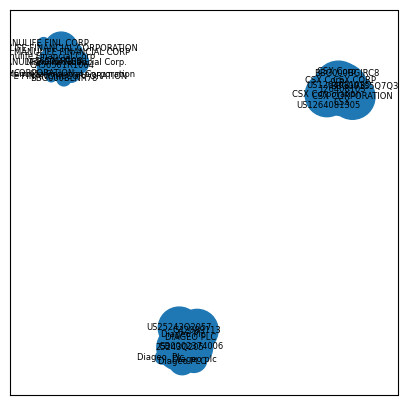

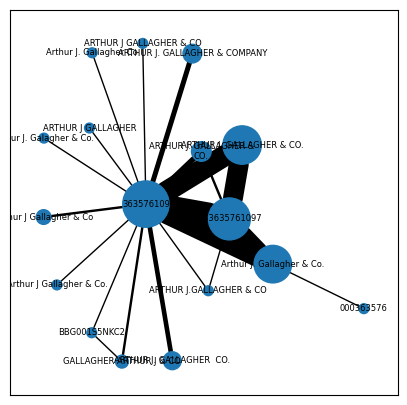

ic| k: 13
ic| L: <COOrdinate sparse array of dtype 'float64'
       	with 59 stored elements and shape (17, 17)>
ic| edges_to_remove: [('Arthur J. Gallagher Co', '363576109'),
                      ('Arthur J. Gallagher & Co.', '363576109'),
                      ('Arthur J. Gallagher & Co.', 'US3635761097'),
                      ('Arthur J Gallagher & Co', '363576109'),
                      ('ARTHUR J GALLAGHER', '363576109'),
                      ('ARTHUR J. GALLAGHER & COMPANY', '363576109'),
                      ('363576109', 'ARTHUR J. GALLAGHER & CO.'),
                      ('363576109', 'US3635761097'),
                      ('363576109', 'ARTHUR J.GALLAGHER & CO'),
                      ('363576109', 'ARTHUR J. GALLAGHER &
                     CO.'),
                      ('363576109', 'ARTHUR J. GALLAGHER  CO.'),
                      ('363576109', 'ARTHUR J GALLAGHER & CO'),
                      ('363576109', 'Arthur J. Galagher & Co.'),
                      ('36357610

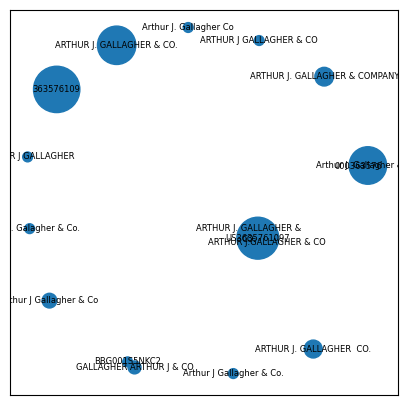

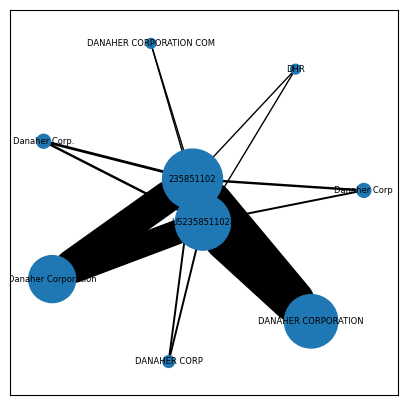

ic| k: 1
ic| edges_to_remove: []


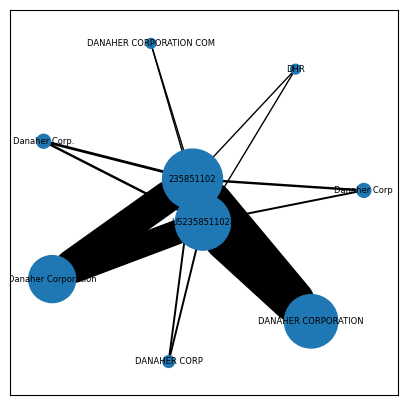

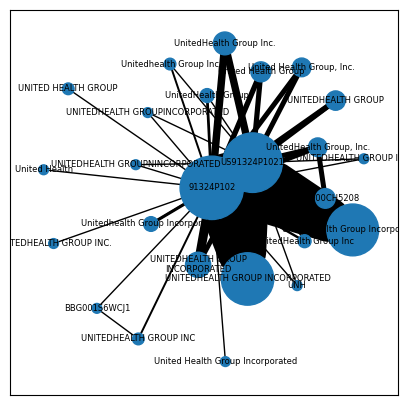

ic| k: 1
ic| edges_to_remove: []


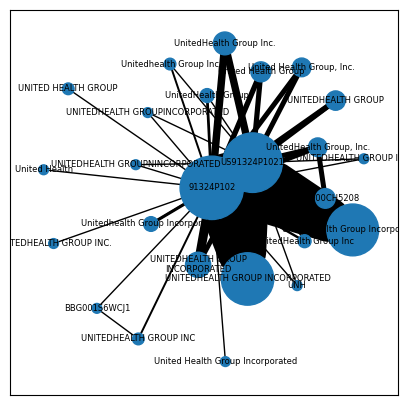

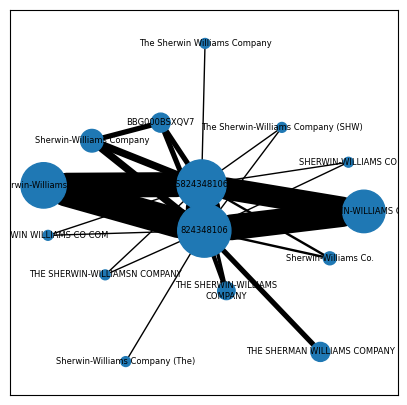

ic| k: 1
ic| edges_to_remove: []


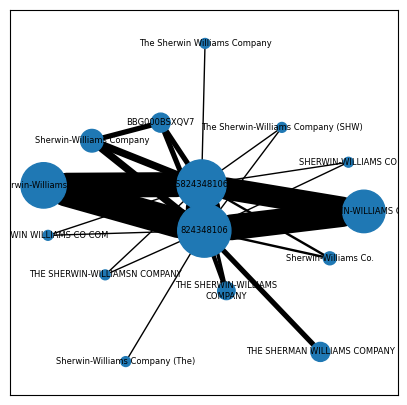

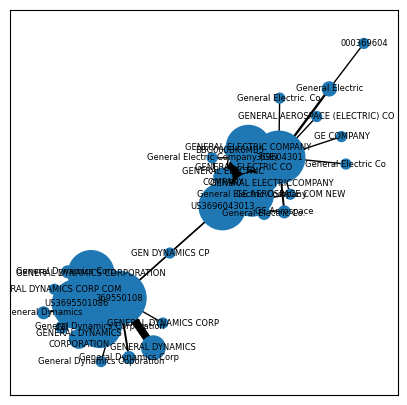

ic| k: 26
ic| L: <COOrdinate sparse array of dtype 'float64'
       	with 130 stored elements and shape (32, 32)>
ic| edges_to_remove: [('GENERAL ELECTRIC COMPANY', '369604301'),
                      ('GENERAL ELECTRIC COMPANY', 'US3696043013'),
                      ('General Dynamics Coporation', '369550108'),
                      ('General Electric Company (GE)', '369604301'),
                      ('General Electric Company (GE)', 'US3696043013'),
                      ('GE AEROSPACE COM NEW', '369604301'),
                      ('GE AEROSPACE COM NEW', 'US3696043013'),
                      ('General Dynamics Corp.', '369550108'),
                      ('General Dynamics Corp.', 'US3695501086'),
                      ('General Electric Company', '369604301'),
                      ('General Electric Company', 'US3696043013'),
                      ('GENERAL DYNAMICS CORP COM', '369550108'),
                      ('GENERAL DYNAMICS CORP COM', 'US3695501086'),
                    

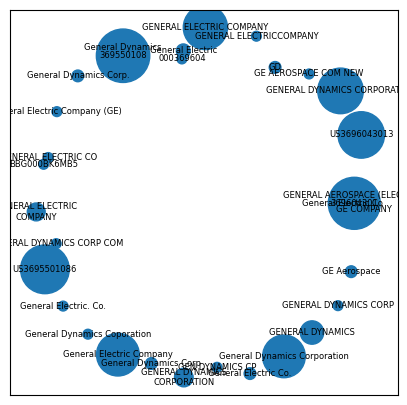

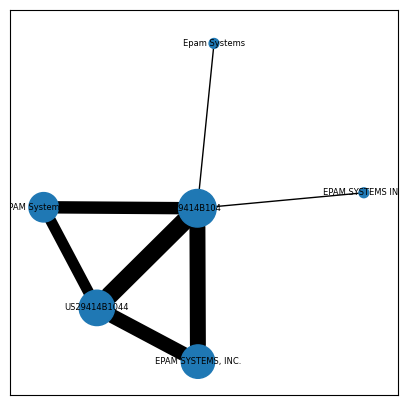

ic| k: 1
ic| edges_to_remove: []


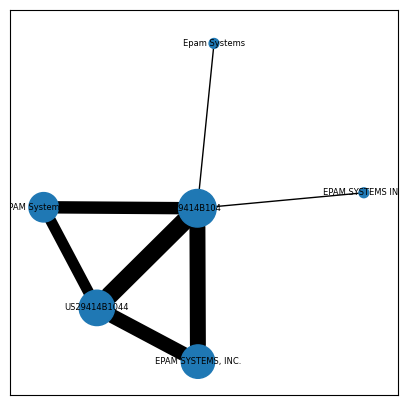

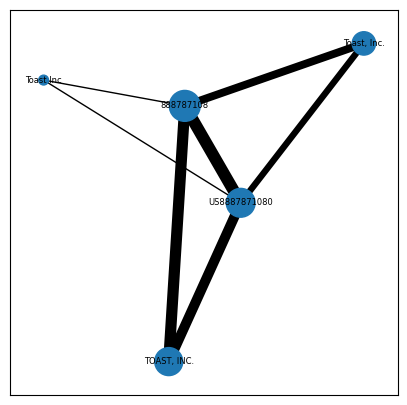

ic| k: 1
ic| edges_to_remove: []


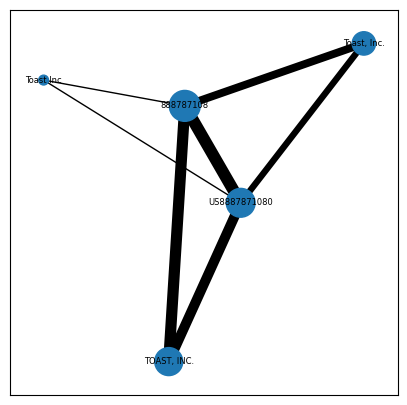

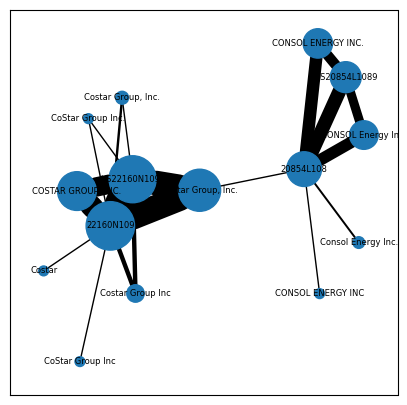

ic| k: 2
ic| edges_to_remove: [('20854L108', 'CoStar Group, Inc.')]


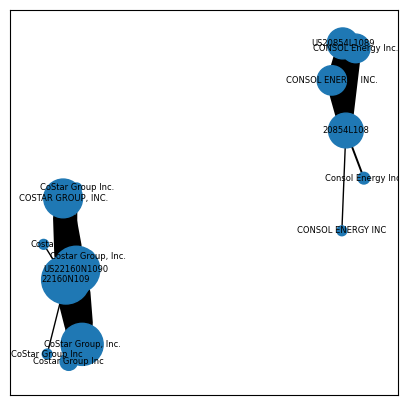

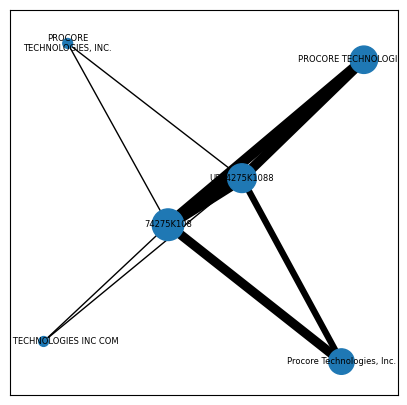

ic| k: 1
ic| edges_to_remove: []


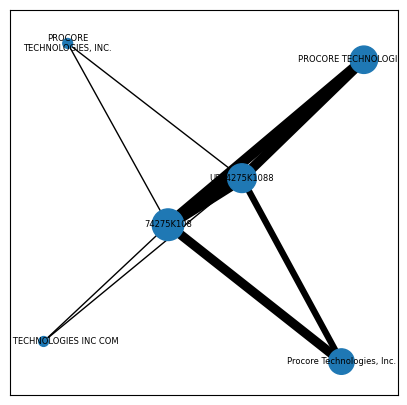

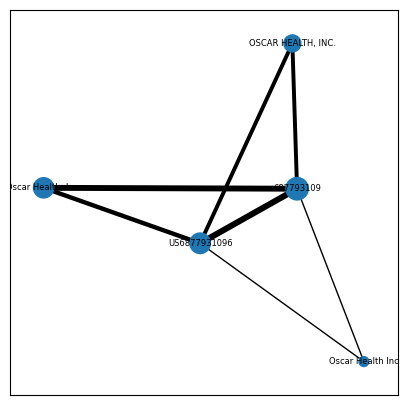

ic| k: 1
ic| edges_to_remove: []


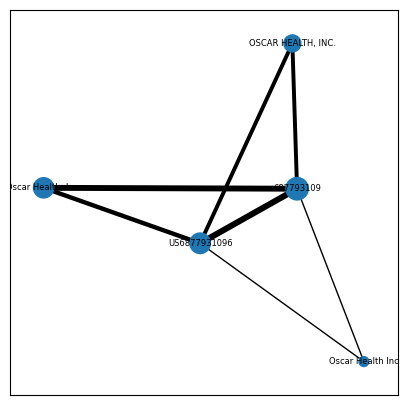

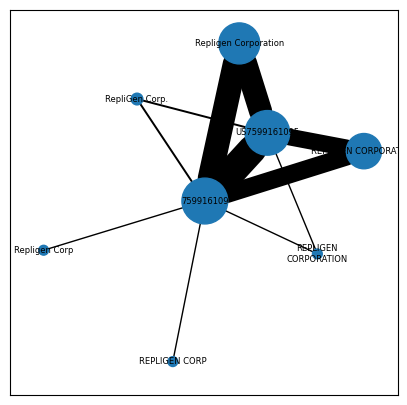

ic| k: 1
ic| edges_to_remove: []


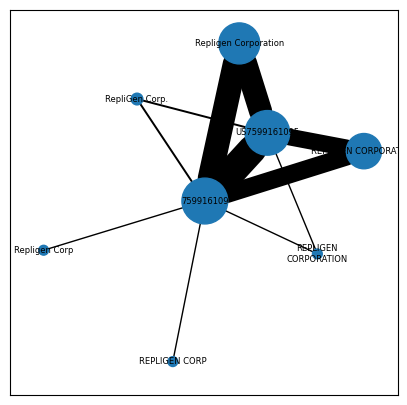

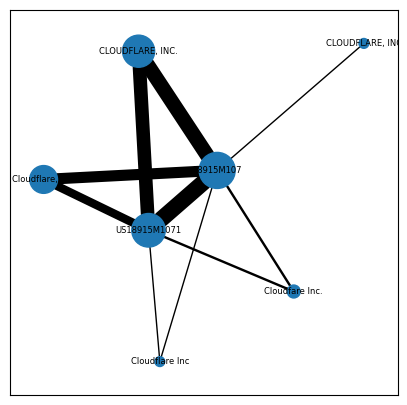

ic| k: 1
ic| edges_to_remove: []


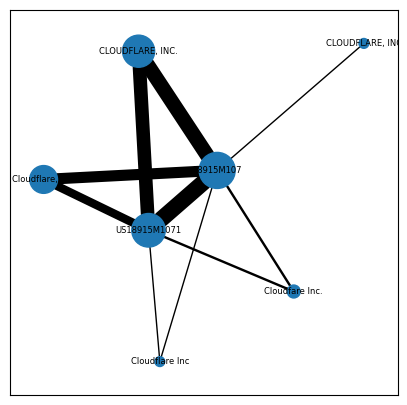

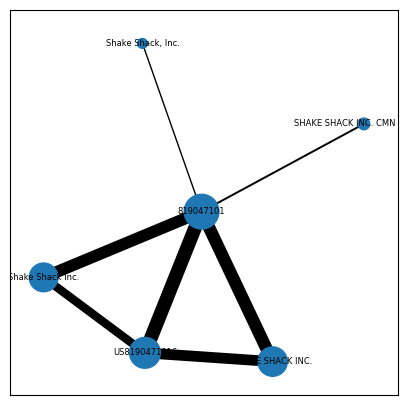

ic| k: 1
ic| edges_to_remove: []


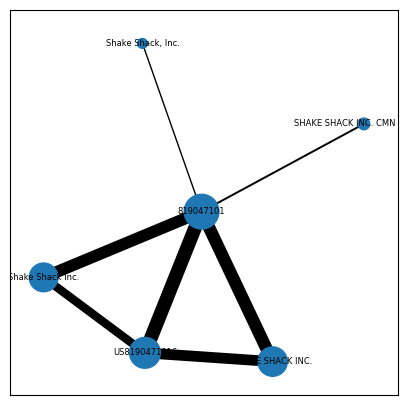

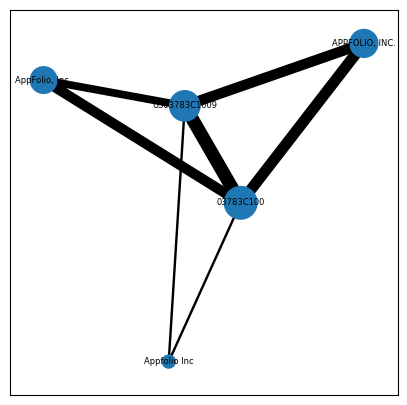

ic| k: 1
ic| edges_to_remove: []


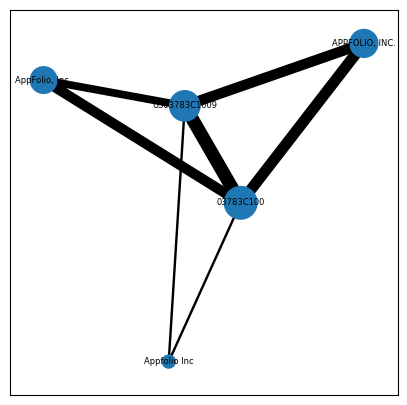

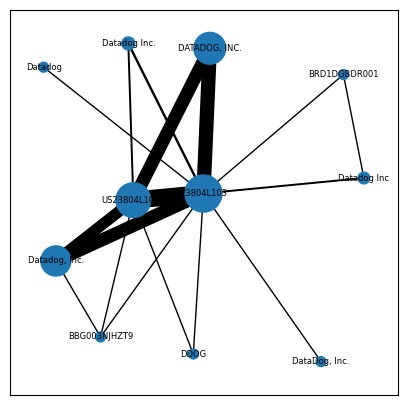

ic| k: 1
ic| edges_to_remove: []


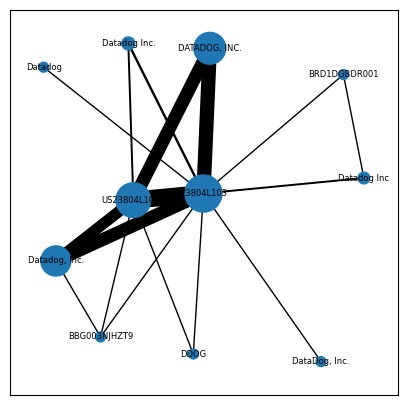

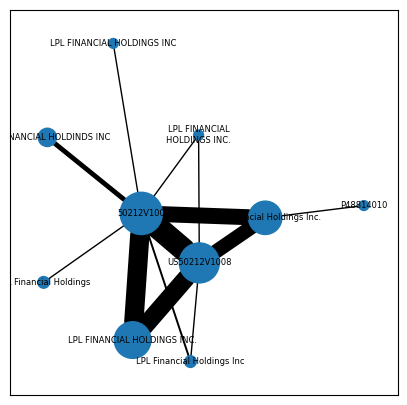

ic| k: 1
ic| edges_to_remove: []


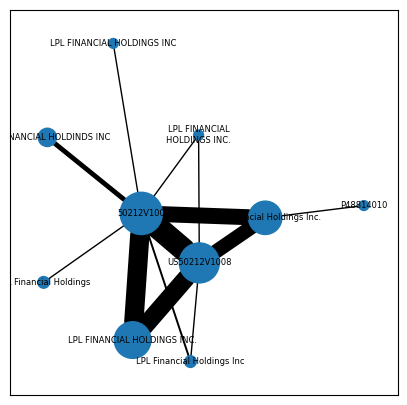

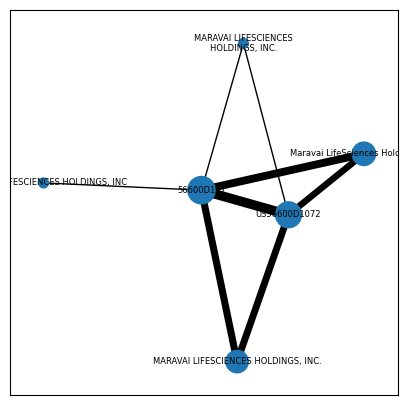

ic| k: 1
ic| edges_to_remove: []


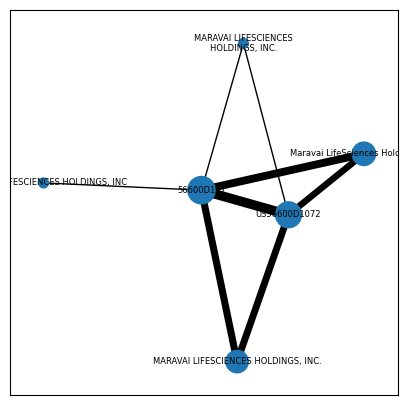

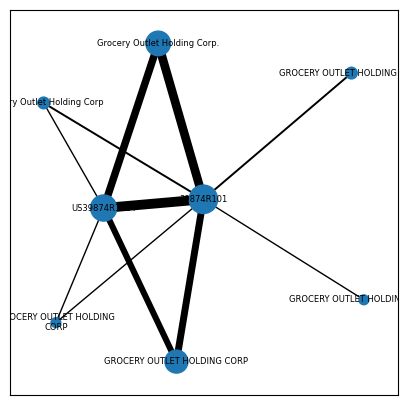

ic| k: 1
ic| edges_to_remove: []


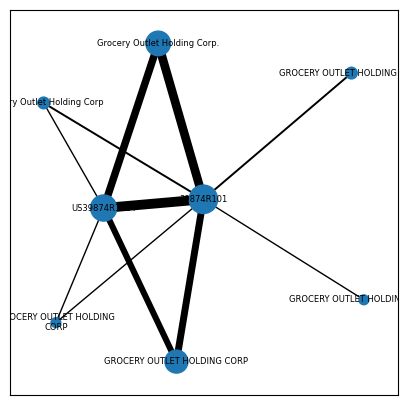

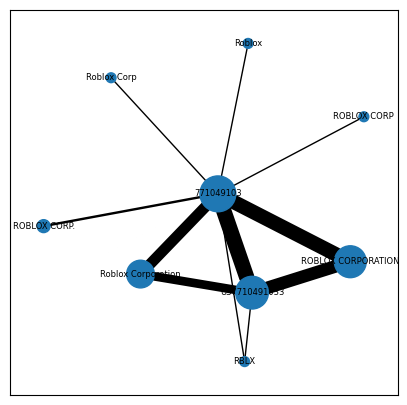

ic| k: 1
ic| edges_to_remove: []


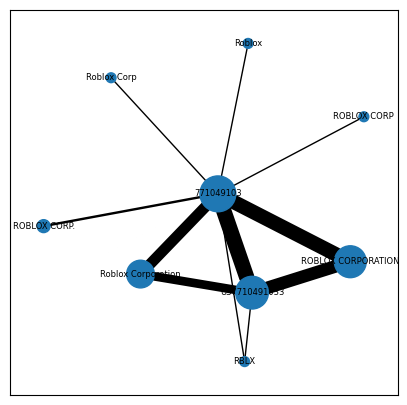

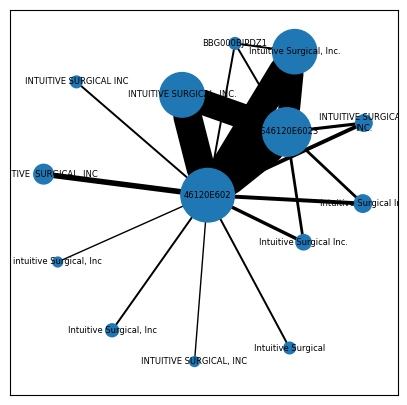

ic| k: 1
ic| edges_to_remove: []


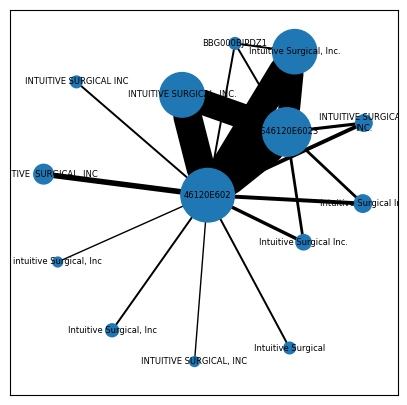

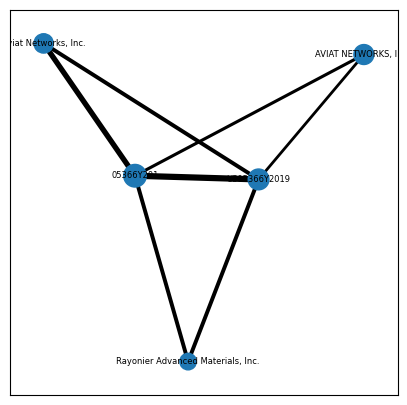

ic| k: 1
ic| edges_to_remove: []


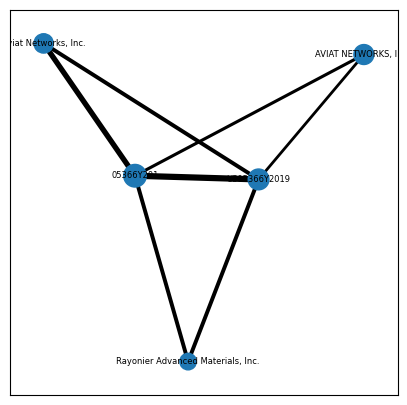

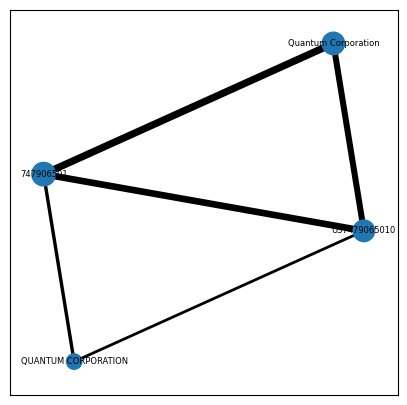

ic| k: 1
ic| edges_to_remove: []


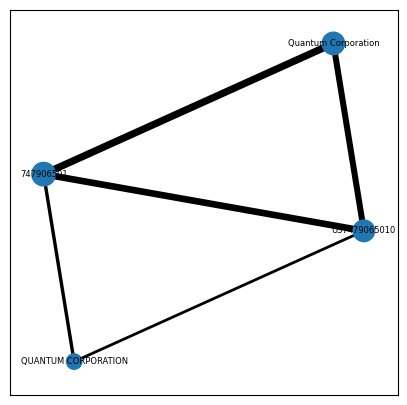

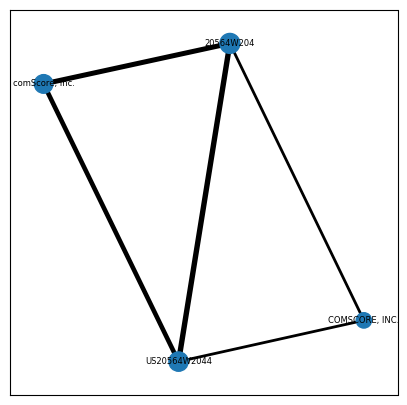

ic| k: 1
ic| edges_to_remove: []


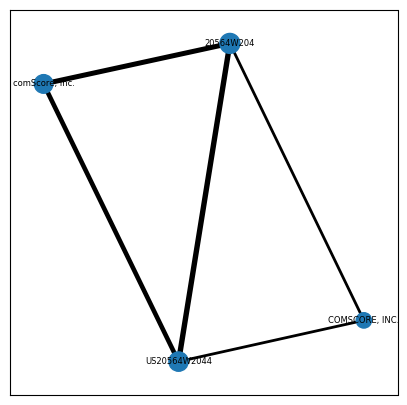

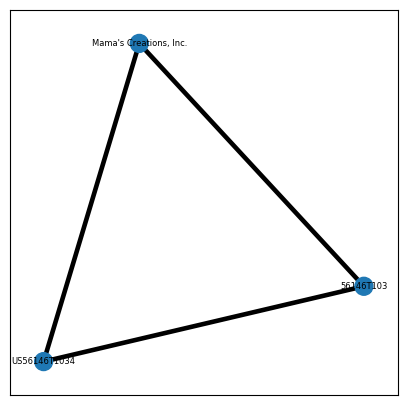

ic| k: 1
ic| edges_to_remove: []


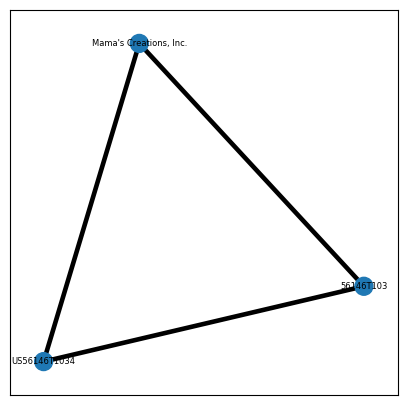

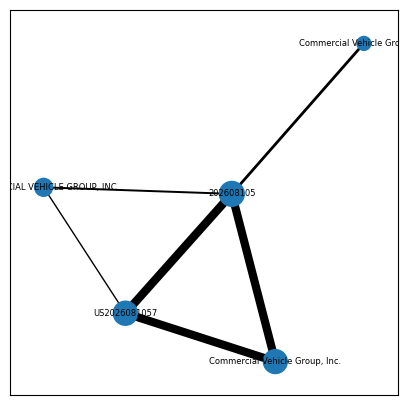

ic| k: 1
ic| edges_to_remove: []


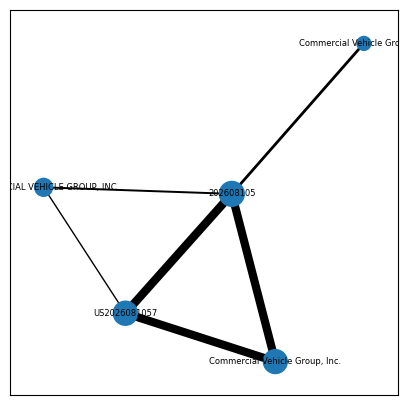

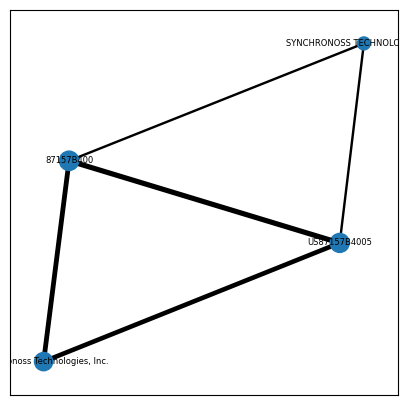

ic| k: 1
ic| edges_to_remove: []


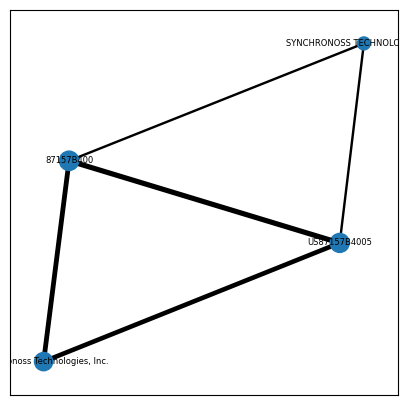

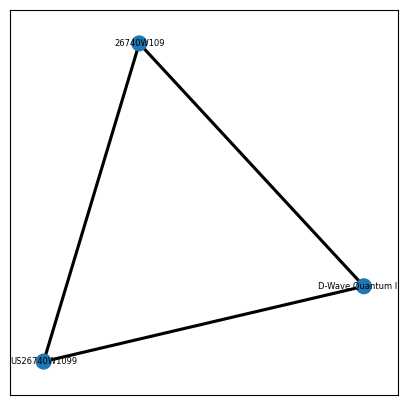

ic| k: 1
ic| edges_to_remove: []


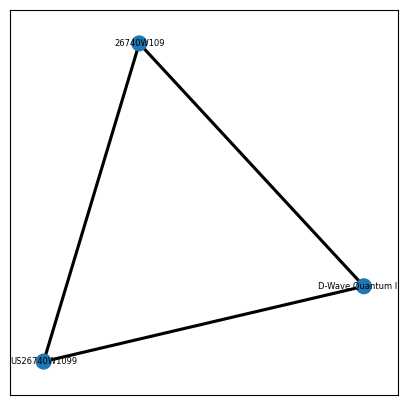

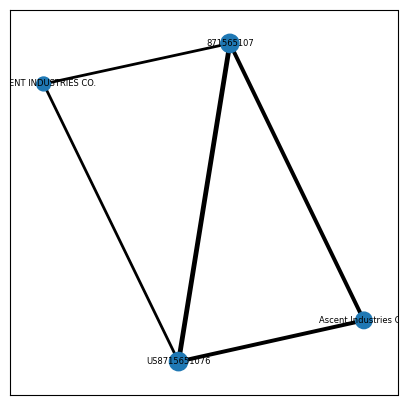

ic| k: 1
ic| edges_to_remove: []


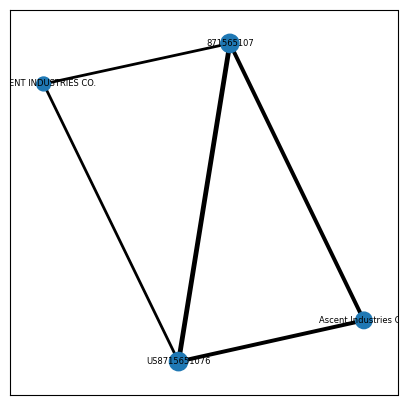

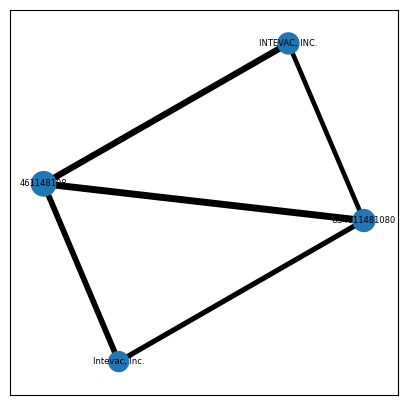

ic| k: 1
ic| edges_to_remove: []


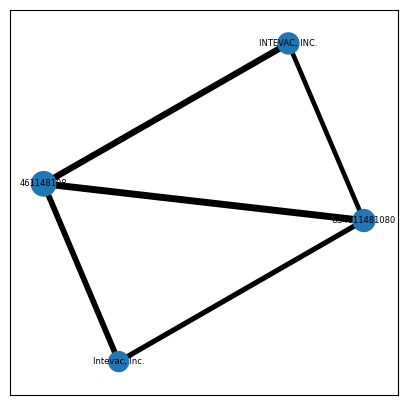

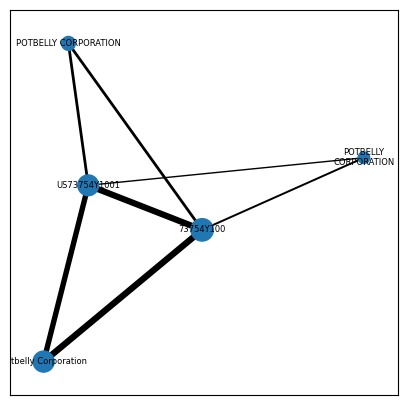

ic| k: 1
ic| edges_to_remove: []


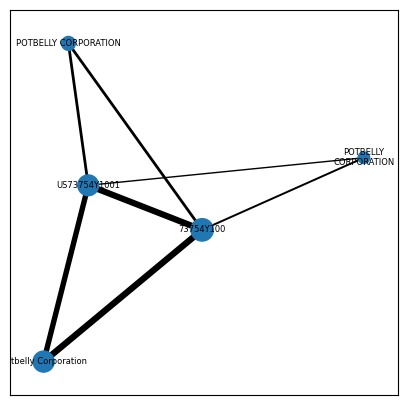

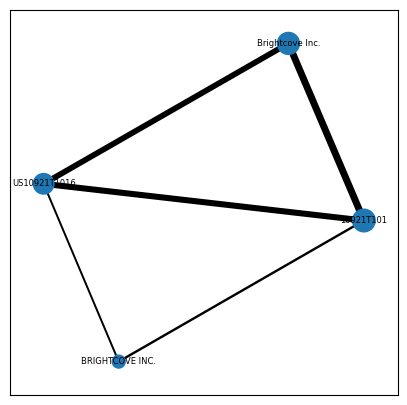

ic| k: 1
ic| edges_to_remove: []


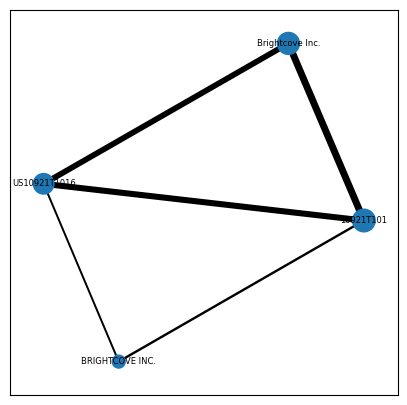

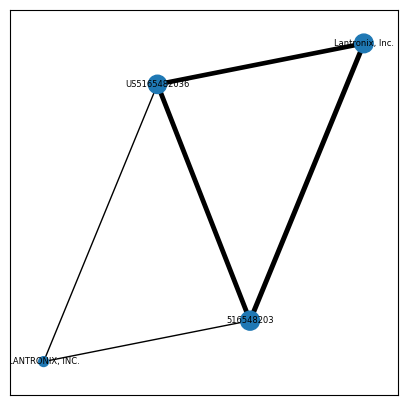

ic| k: 1
ic| edges_to_remove: []


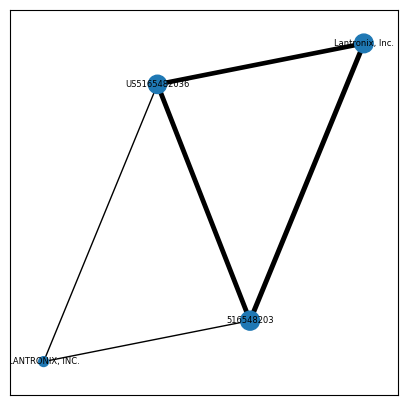

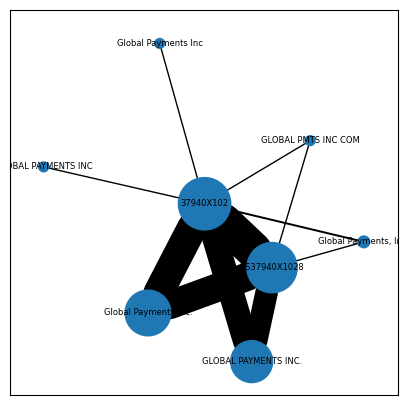

ic| k: 1
ic| edges_to_remove: []


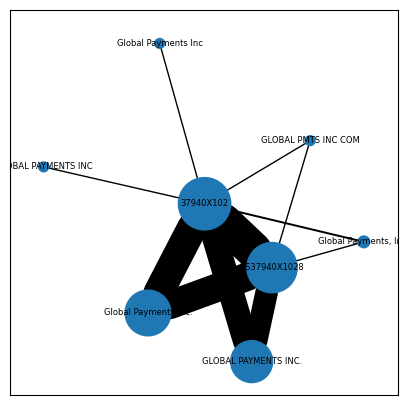

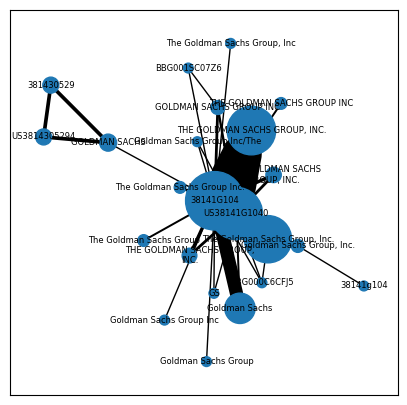

ic| k: 22
ic| L: <COOrdinate sparse array of dtype 'float64'
       	with 95 stored elements and shape (23, 23)>
ic| edges_to_remove: [('The Goldman Sachs Group, Inc', '38141G104'),
                      ('THE GOLDMAN SACHS
                     GROUP, INC.', '38141G104'),
                      ('THE GOLDMAN SACHS
                     GROUP, INC.', 'US38141G1040'),
                      ('The Goldman Sachs Group', '38141G104'),
                      ('THE GOLDMAN SACHS GROUP,
                     INC.', '38141G104'),
                      ('THE GOLDMAN SACHS GROUP,
                     INC.', 'US38141G1040'),
                      ('Goldman Sachs Group, Inc.', 'US38141G1040'),
                      ('Goldman Sachs Group, Inc.', '38141g104'),
                      ('381430529', 'GOLDMAN SACHS'),
                      ('381430529', 'US3814305294'),
                      ('THE GOLDMAN SACHS GROUP INC', '38141G104'),
                      ('Goldman Sachs', '38141G104'),
                    

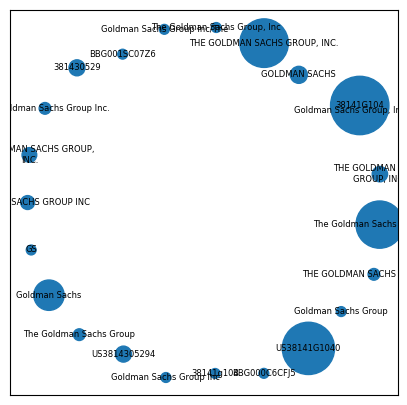

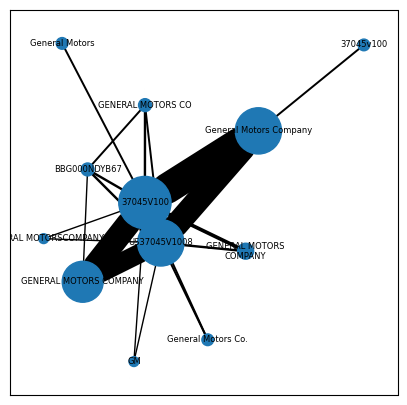

ic| k: 1
ic| edges_to_remove: []


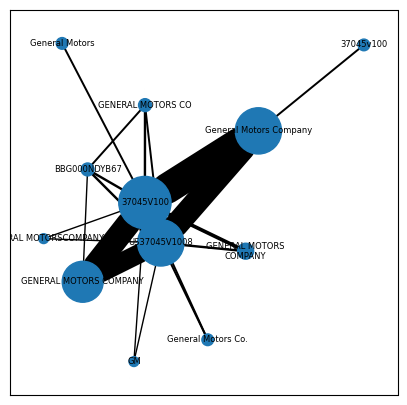

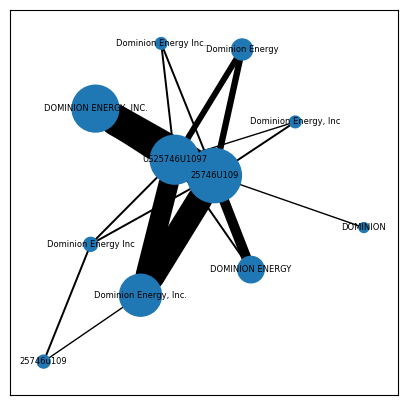

ic| k: 1
ic| edges_to_remove: []


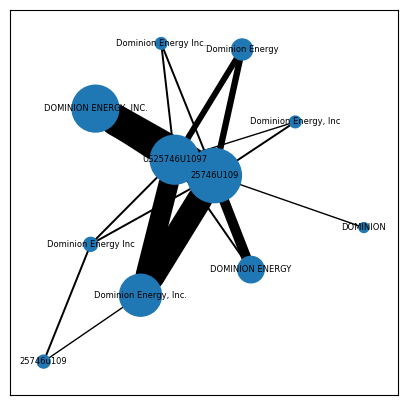

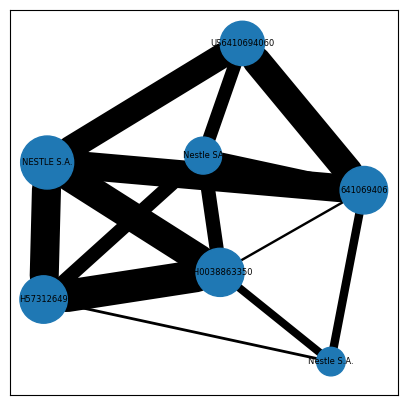

ic| k: 1
ic| edges_to_remove: []


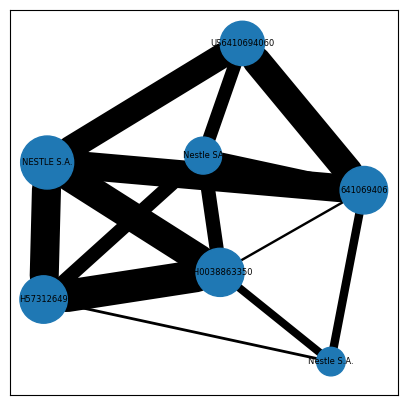

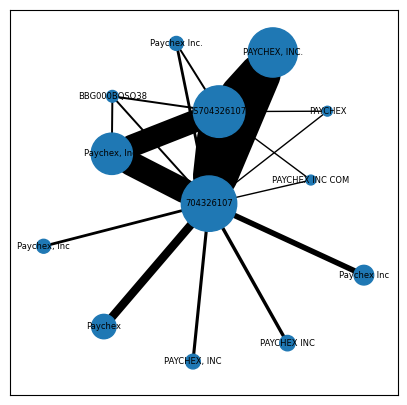

ic| k: 1
ic| edges_to_remove: []


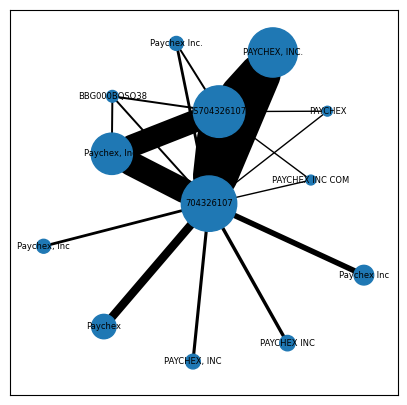

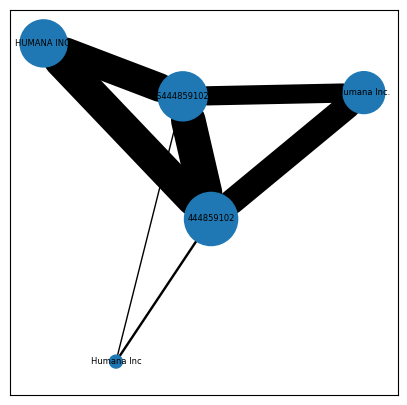

ic| k: 1
ic| edges_to_remove: []


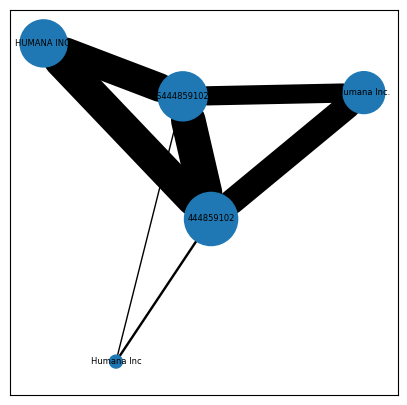

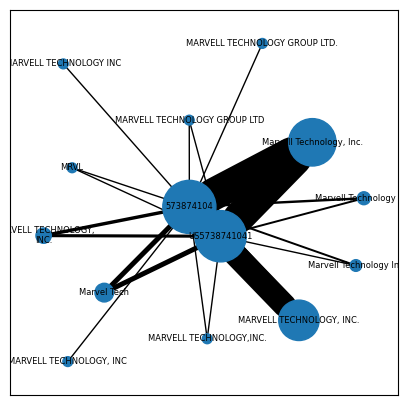

ic| k: 1
ic| edges_to_remove: []


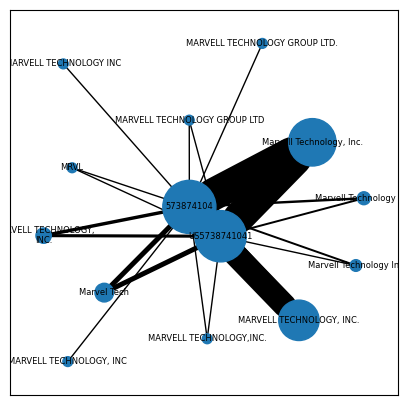

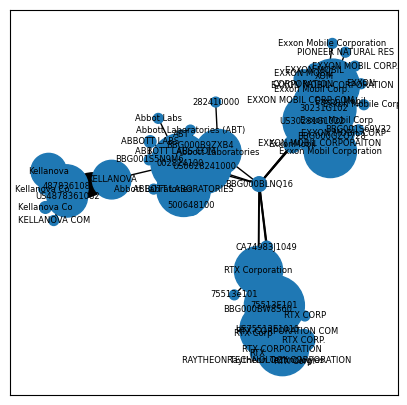

ic| k: 4
ic| edges_to_remove: [('75513E101', 'BBG000BLNQ16'),
                      ('ExxonMobil', 'BBG000BLNQ16'),
                      ('BBG000BLNQ16', '30231G102'),
                      ('BBG000BLNQ16', 'US30231G1022'),
                      ('BBG000BLNQ16', 'RTX Corporation'),
                      ('BBG000BLNQ16', 'CA74983J1049'),
                      ('KELLANOVA', '002824100')]


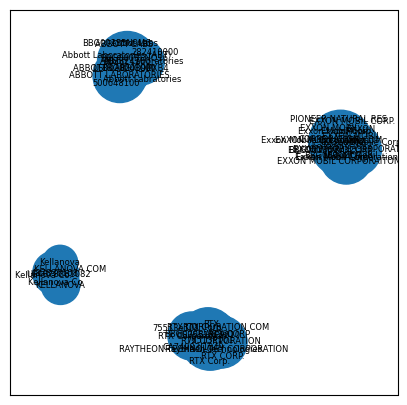

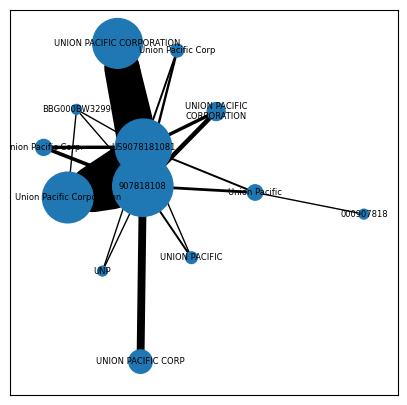

ic| k: 1
ic| edges_to_remove: []


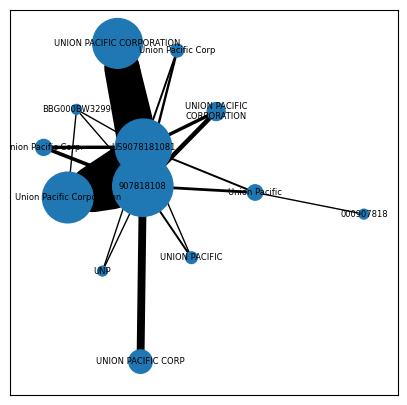

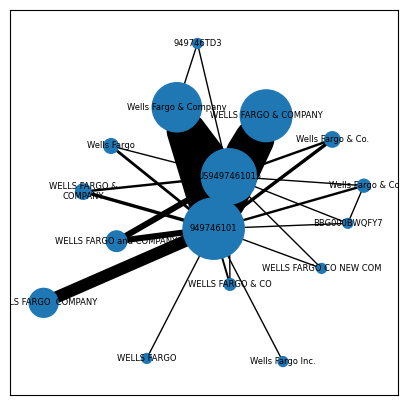

ic| k: 1
ic| edges_to_remove: []


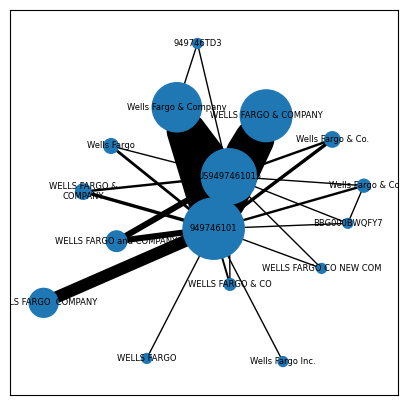

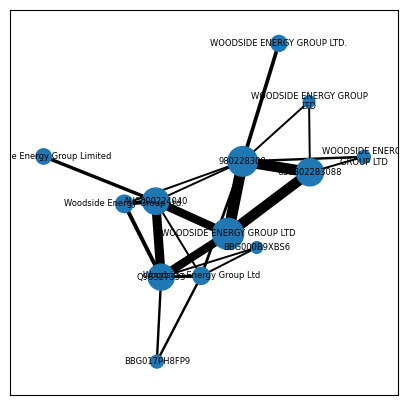

ic| k: 2
ic| edges_to_remove: [('980228308', 'Woodside Energy Group Ltd'),
                      ('980228308', 'AU0000224040'),
                      ('980228308', 'Woodside Energy Group Ltd.'),
                      ('AU0000224040', 'WOODSIDE ENERGY GROUP LTD'),
                      ('Q98327333', 'WOODSIDE ENERGY GROUP LTD')]


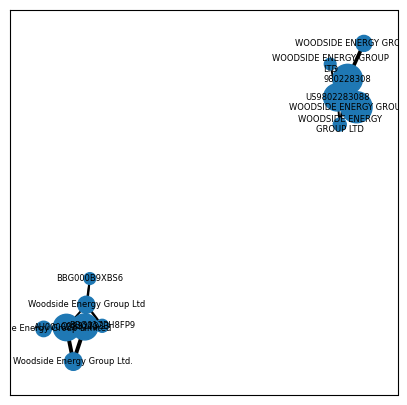

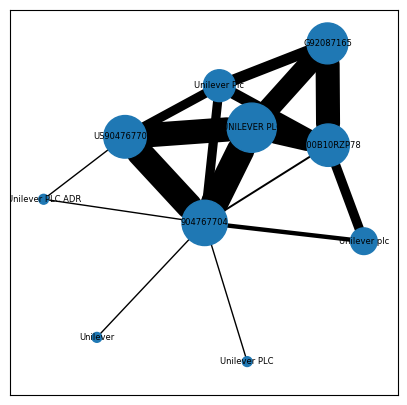

ic| k: 1
ic| edges_to_remove: []


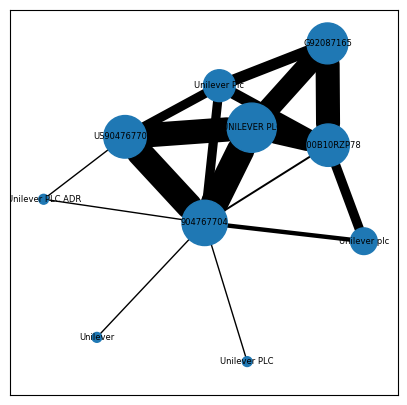

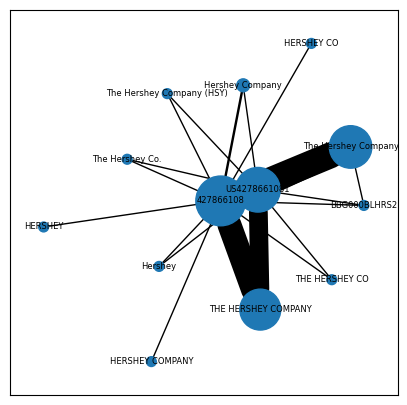

ic| k: 1
ic| edges_to_remove: []


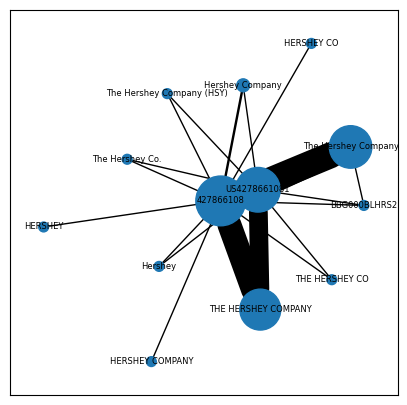

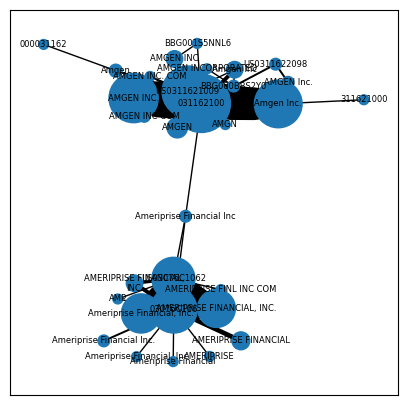

ic| k: 2
ic| edges_to_remove: [('Ameriprise Financial Inc', '031162100')]


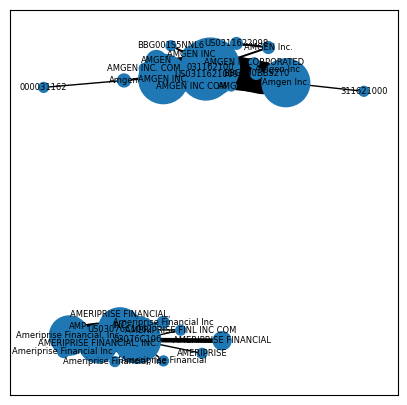

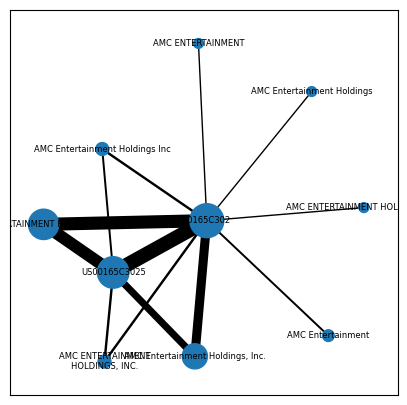

ic| k: 1
ic| edges_to_remove: []


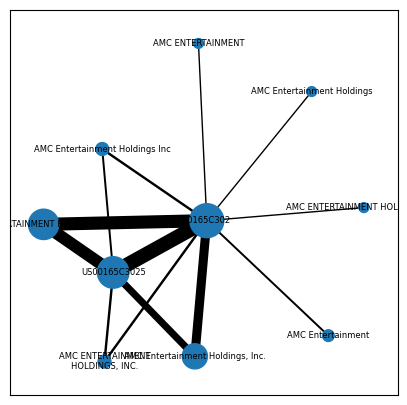

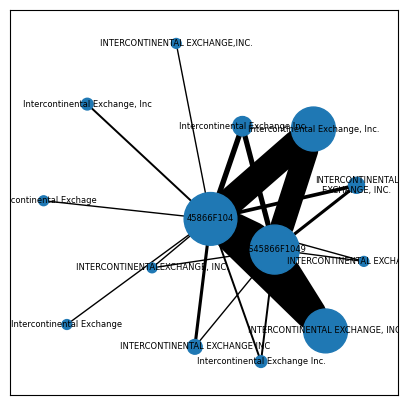

ic| k: 1
ic| edges_to_remove: []


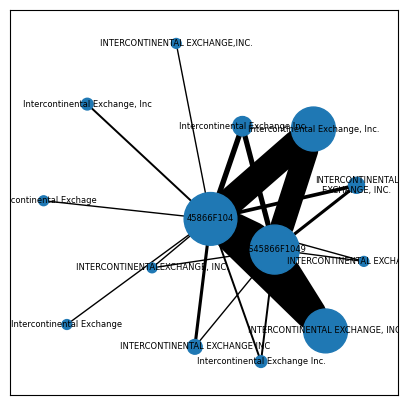

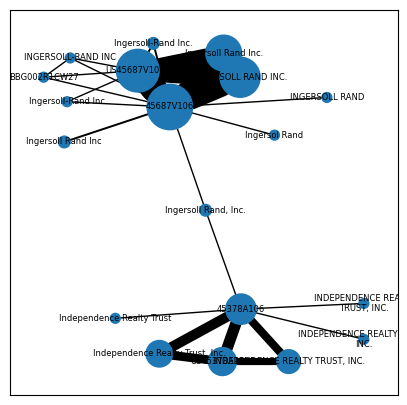

ic| k: 2
ic| edges_to_remove: [('45687V106', 'Ingersoll Rand, Inc.')]


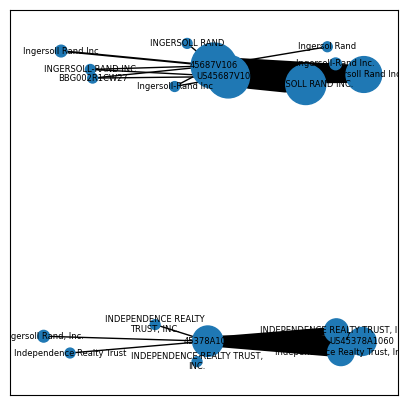

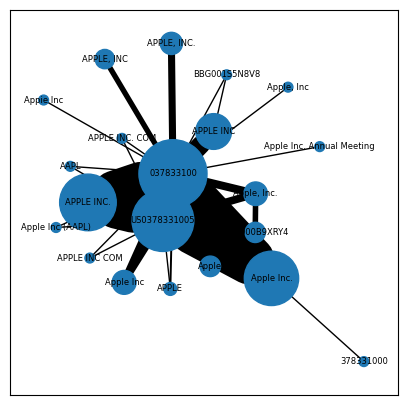

ic| k: 1
ic| edges_to_remove: []


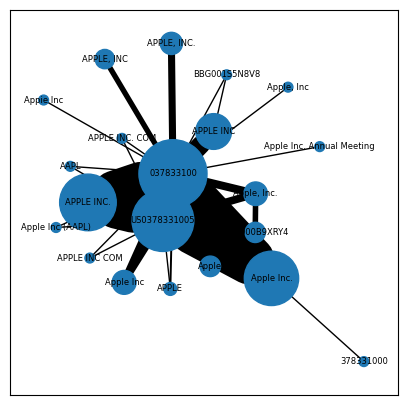

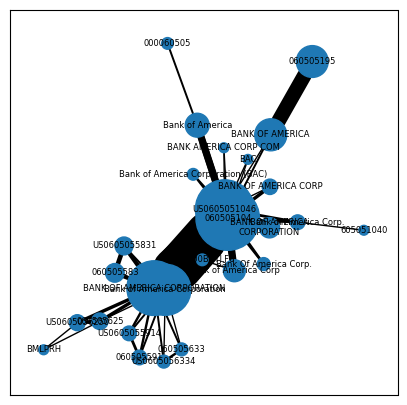

ic| k: 26
ic| L: <COOrdinate sparse array of dtype 'float64'
       	with 133 stored elements and shape (27, 27)>
ic| edges_to_remove: [('060505195', 'BANK OF AMERICA'),
                      ('060505633', 'BANK OF AMERICA CORPORATION'),
                      ('060505633', 'US0605056334'),
                      ('060505633', 'Bank of America Corporation'),
                      ('US0605056334', 'BANK OF AMERICA CORPORATION'),
                      ('US0605056334', 'Bank of America Corporation'),
                      ('Bank of America', '060505104'),
                      ('Bank of America', 'US0605051046'),
                      ('Bank of America', '000060505'),
                      ('BAC', '060505104'),
                      ('BAC', 'US0605051046'),
                      ('Bank of America Corporation (BAC)', '060505104'),
                      ('Bank of America Corporation (BAC)', 'US0605051046'),
                      ('605051040', 'Bank of America Corp.'),
                      ('

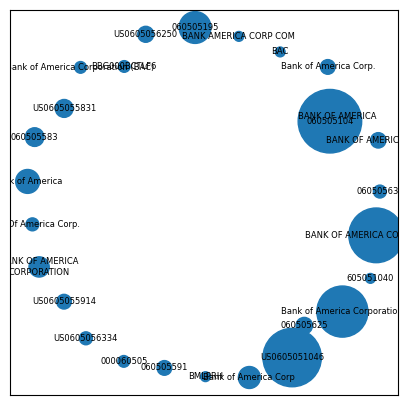

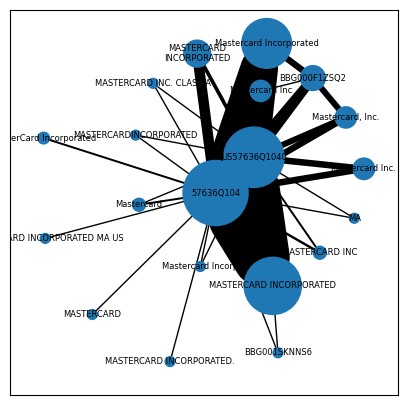

ic| k: 1
ic| edges_to_remove: []


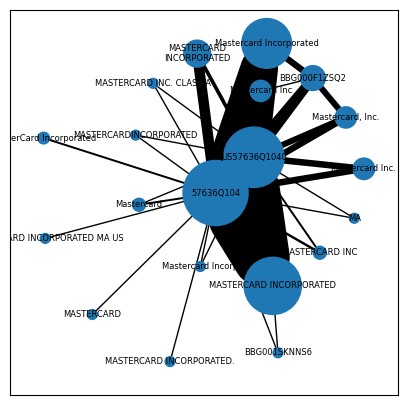

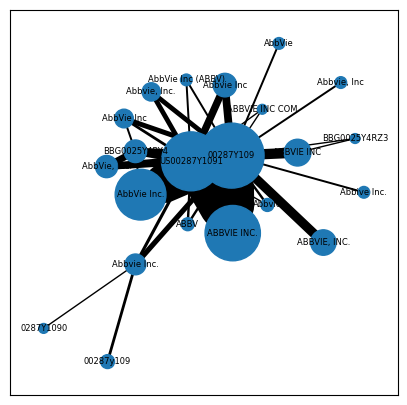

ic| k: 1
ic| edges_to_remove: []


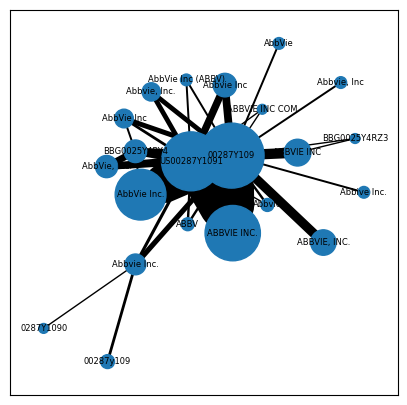

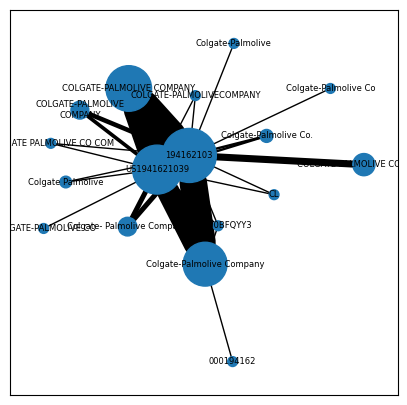

ic| k: 1
ic| edges_to_remove: []


KeyboardInterrupt: 

In [108]:
for subg in subgraphs:
    cluster_via_laplacian_kmeans(subg)

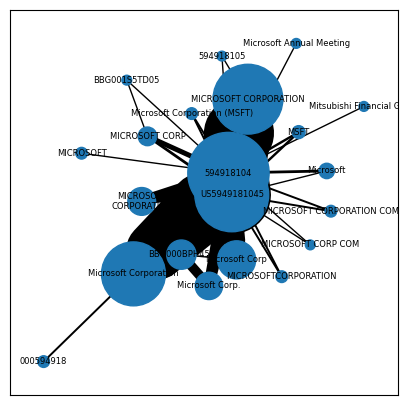

k=np.int64(1)
("node_to_index={'594918105': 0, 'Mitsubishi Financial Group': 1, 'MICROSOFT "
 "CORP': 2, '594918104': 3, 'Microsoft Annual Meeting': 4, '000594918': 5, "
 "'MICROSOFT CORPORATION COM': 6, 'Microsoft Corporation': 7, 'MICROSOFT "
 "CORPORATION': 8, 'Microsoft Corp.': 9, 'MICROSOFTCORPORATION': 10, "
 "'Microsoft Corporation (MSFT)': 11, 'Microsoft Corp': 12, 'US5949181045': "
 "13, 'BBG000BPH459': 14, 'MICROSOFT CORP COM': 15, 'BBG001S5TD05': 16, "
 "'MSFT': 17, 'MICROSOFT\\nCORPORATION': 18, 'Microsoft': 19, 'MICROSOFT': 20}")
'edges_to_remove=[]'


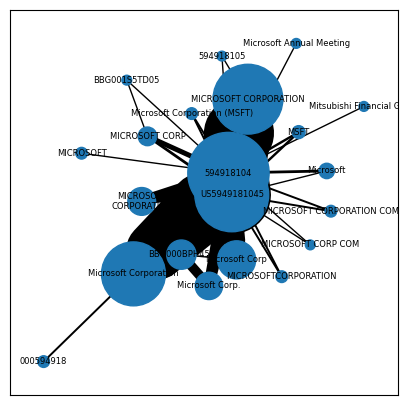

In [90]:
cluster_via_laplacian_kmeans(msft_subgraph)

In [85]:
amzn = extract_specific_name_subgraph(subgraphs, "amazon")

/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_32220/942150125.py:18: UserWarning: 2 subgraphs have name='amazon'.
[len(subg.nodes) for subg in collected]=[1, 26]
  warn(alert_str)


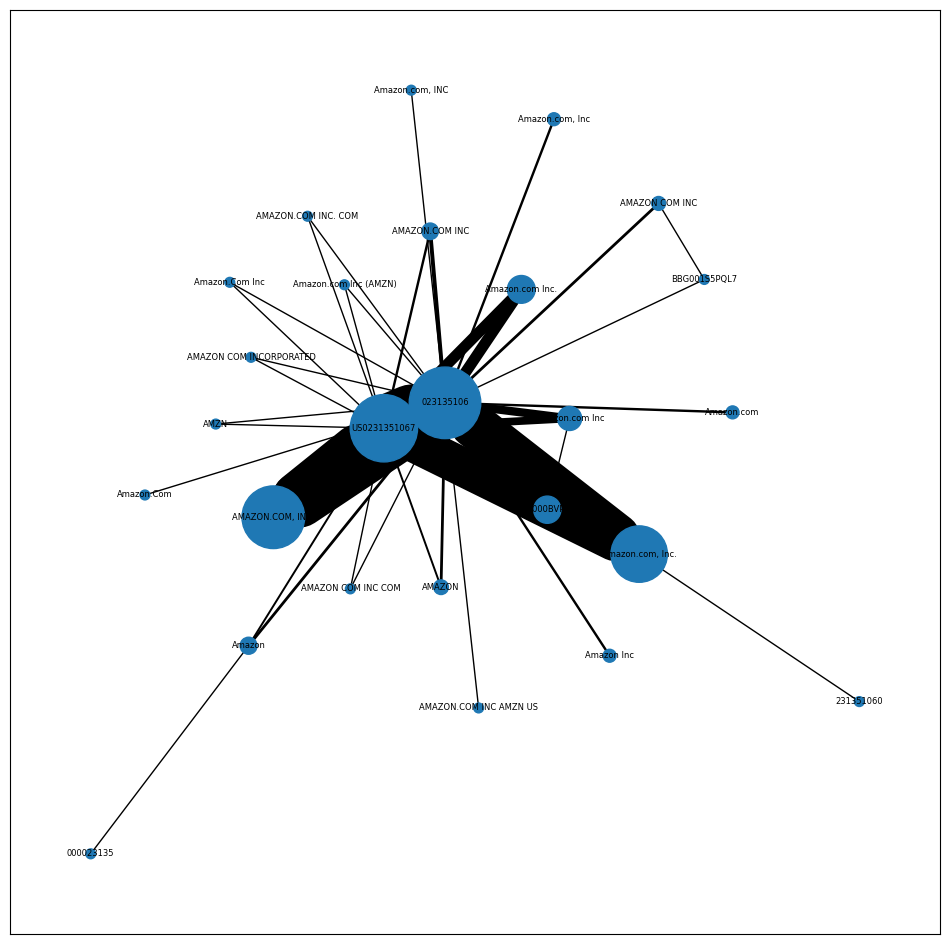

In [87]:
draw_graph(amzn)

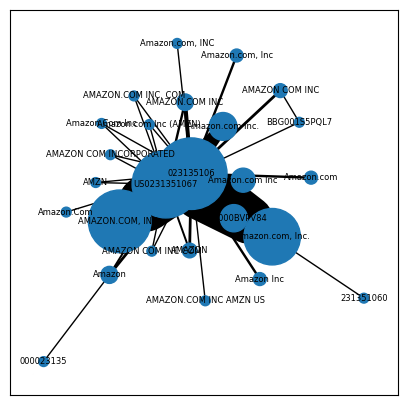

k=np.int64(1)
("node_to_index={'Amazon.com Inc': 0, 'Amazon.com, Inc.': 1, 'AMAZON.COM INC "
 "AMZN US': 2, 'Amazon.Com Inc': 3, 'AMAZON.COM INC': 4, 'Amazon.com, INC': 5, "
 "'231351060': 6, 'Amazon.Com': 7, '000023135': 8, '023135106': 9, "
 "'BBG000BVPV84': 10, 'AMAZON.COM, INC.': 11, 'AMAZON COM INC': 12, 'AMAZON "
 "COM INCORPORATED': 13, 'Amazon': 14, 'AMAZON': 15, 'Amazon.com, Inc': 16, "
 "'Amazon.com Inc.': 17, 'Amazon Inc': 18, 'BBG001S5PQL7': 19, 'AMZN': 20, "
 "'US0231351067': 21, 'AMAZON.COM INC. COM': 22, 'Amazon.com Inc (AMZN)': 23, "
 "'AMAZON COM INC COM': 24, 'Amazon.com': 25}")
'edges_to_remove=[]'


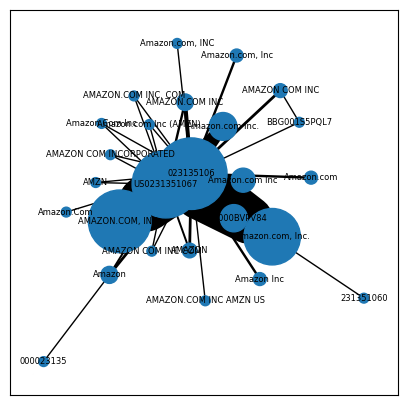

In [89]:
cluster_via_laplacian_kmeans(amzn)

## TF-IDF

In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer

issuer_names = votes["issuer_name"].unique()
vectorizer = TfidfVectorizer(stop_words="english")
tfidf_matrix = vectorizer.fit_transform(issuer_names)

TypeError: TfidfVectorizer.__init__() got an unexpected keyword argument 'set_output'

In [53]:
idfs = pl.DataFrame(
    {"word": vectorizer.get_feature_names_out(), "idf": vectorizer.idf_}
)

In [57]:
idfs.sort("idf").head(50)

word,idf
str,f64
"""corporation""",3.377867
"""corp""",3.621065
"""group""",3.714451
"""holdings""",3.834979
"""limited""",4.284695
…,…
"""gold""",6.33412
"""se""",6.35586
"""bancshares""",6.389383


In [52]:
vectorizer.idf_

array([ 9.48042547, 10.17357265, 10.17357265, ...,  9.76810754,
       10.17357265,  9.76810754])

In [45]:
from sklearn.metrics.pairwise import cosine_similarity

similarity_matrix = cosine_similarity(tfidf_matrix)

In [47]:
similarity_matrix.shape

(19277, 19277)